# <center> Georgia Institute of Technology
# <center> ECE 4252/8803: Fundamentals of Machine Learning (FunML)
# <center> Spring 2025
## <center> **Homework Assignment # 7**
## <center> **Due: April 18, 2025 @8PM**

**Please read the following instructions carefully.**
- The entire homework assignment is to be completed on this `ipython` notebook. It is designed to be used with `AI Makerspace`, but you may use other tools (e.g., Google Colab) as well.
- Make sure that you execute all cells in a way so their output is printed beneath the corresponding cell. Thus, after successfully executing all cells properly, the resulting notebook has all the questions and your answers.  
- Make sure you delete any scratch cells before you export this document as a PDF. Do not change the order of the questions and do not remove any part of the questions. Edit at the indicated places only.
- Print a PDF copy of the notebook with all its outputs printed. <font color='red' > **Submit PDF on `Gradescope`.**</font> <br> Then, zip both **PDF** and **IPYNB** in a single **ZIP** file and submit it on `Canvas` under Assignments.
- Rename the PDF, IPYNB and ZIP file according to the format:\
 ***LastName_FirstName_ECE_4252_8803_F24_assignment_6.zip***\
 ***LastName_FirstName_ECE_4252_8803_F24_assignment_6.pdf***\
 ***LastName_FirstName_ECE_4252_8803_F24_assignment_6.ipynb***
- When submitting PDF on Gradescope, make sure to match each question to the corresponding pages. **Incorrect page assignment may lead to reduction of points.**
- It is encouraged for you to discuss homework problems amongst each other, but any copying is strictly prohibited and will be subject to Georgia Tech Honor Code.
- Late homework is not accepted unless arranged otherwise and in advance.
- Comment on your codes.
- Refer to the tutorial and the supplementary/reading materials that are posted on `Canvas` for the first lecture to help you with this assignment.
- **IMPORTANT:** Start your solution with a <font color='red'>**BOLD RED**</font> text that includes the words *solution* and the part of the problem you are working on. For example, start your solution for Part (c) of Problem 2 by having the first line as:
<br> <font color='red' > **Solution to Problem 2 Part (c)**</font>. Failing to do so may result in a *20\% penalty* of the total grade.

## **Assignment Objectives:**

- Learn to use different methods for model explainability
- Learn how to use hook feature in `Pytorch`
- Implement Grad-CAM and Contrast-CAM


## **Guide for Exporting Ipython Notebook to PDF:**
Remeber to convert your homework into PDF format before submitting it.\
Here is a [video](https://www.youtube.com/watch?v=yXzw9Dd_Na0) summarizing how to export ipython Notebook into PDF.<br>
 - **[Method 1: Print to PDF]**<br>
 After you run every cell and get their outputs, you can use **\[File\] -> \[Print Preview\]** , and then use your browser's print function. Choose **\[Save as PDF\]** to export this Ipython Notebook to PDF for submission. <br>*Note: Sometimes figures or texts are splited into different pages. Try to tweak the layout by adding empty lines to avoid this effect as much as you can.*

- **[Method 2: GoFullPage Chrome Extension]**<br>
Install the [extension](https://gofullpage.com/) and generate PDF file of the Ipython Notebook in the browser.<br>

**Note:**
Since we have embedded images in HW1, it's recommended to generate PDF using the first method. Also, Georgia Tech provides a student discount for Adobe Acrobat subscription. Further information can be found [here](https://faq.oit.gatech.edu/content/adobe-licensing).

## **Problem 1: Direct Explainability and Visualization using Grad-CAM (20 pts)**
In class, we have learnt different approaches for model explainability and visualization such as saliency via occlusion, guided backpropagation, and Grad-CAM etc. In this problem, we are going to guide you implement Grad-CAM method step by step. For each image, Grad-CAM can provide a saliency heatmap based on weighting a convolution layer’s activation maps according to their contributions to the predicting class. This saliency heatmap not only shows the important area in the image, but also provides class-discriminative information. Hence, Grad-CAM helps us understand which area of the image our trained network relys on during classification, and we can also use this information to provide explanations of the decision making in our neural network.


**(a) Load Images**<br>
Load those images that we used in Assignment 5 Problem 4 and visualize them. <br>Create a folder named `my_images` using the code below (`!mkdir my_images`) to store all your uploaded images. Then, upload your own images (at least 12 images) to the created `my_images` folder.

### <br><font color='red'>  **Problem 1 (a) Solution**</font>

In [1]:
# create a folder named `my_images`
!mkdir my_images

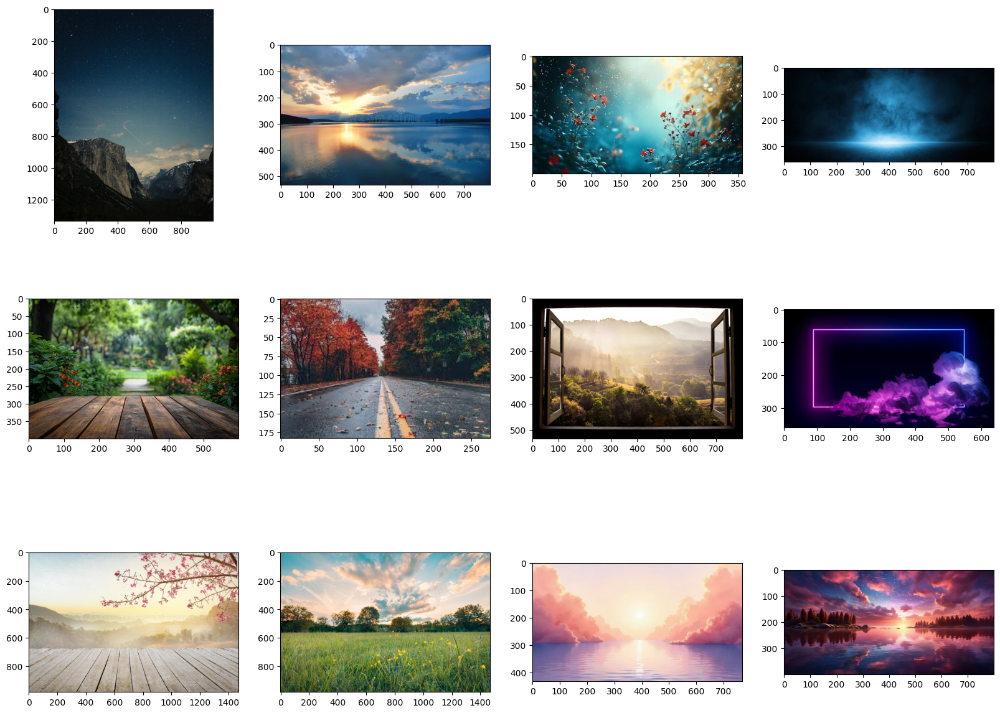

In [3]:
# visualize images

from PIL import Image
import matplotlib.pyplot as plt
from glob import glob
import os
import numpy as np

def imread(img_dir):
  # read the images into a list of `PIL.Image` objects
  images = []
  for f in glob(os.path.join(img_dir, "*")):
    images.append(Image.open(f).convert('RGB'))

  return images

def vis_img_label(image_list, label_list=None):
  # visualize the images w/ labels
  Tot = len(image_list)
  Cols = 4
  Rows = Tot // Cols
  Rows += (Tot % Cols)>0
  if label_list is None:
    label_list = [""]*Tot
  # Create a Position index
  Position = range(1,Tot + 1)
  fig = plt.figure(figsize=(Cols*5, Rows*5))
  for i in range(Tot):
    image = image_list[i]
    # add every single subplot to the figure
    ax = fig.add_subplot(Rows,Cols,Position[i])
    ax.imshow(np.asarray(image))
    ax.set_title(label_list[i])


## Load your uploaded images
img_dir = "./my_images"
image_list = imread(img_dir)
## visualize your uploaded images
vis_img_label(image_list)

**(b) Create Custom Dataset**<br>
Create the custom dataset as you did in Assignment 5.<br>
The class `myDataset` overrides the following methods:
*   `__len__` that returns the size of `myDataset` (the length of the `img_list`)
*   `__getitem__` to support the indexing such that `myDataset[i]` can be used to get the i-th sample of `img_list`.    

Your tasks are:
*   Write your code to return the size of `myDataset`  in the method `__len__`.
*   Write your code to index the i-th sample of `img_list` in the method `__getitem__`.

### <br><font color='red'>  **Problem 1 (b) Solution**</font>

In [4]:
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# customized pytorch dataset
class myDataset(Dataset):
  def __init__(self, img_list, data_transform=None):

    self.img_list = img_list   # the list of all uploaded Images
    self.length = len(img_list)
    self.data_transform = data_transform

  def __getitem__(self, index):
    """function extracts a single example from img_list given its index.

    Parameters
    ----------
    index : int
      index of a single example to be extracted from img_list

    Returns
    -------
    img : torch.tensor, shape(3, 224, 224), type torch.float
      indexed example from img_list reshaped into a RGB channel image of
      size 224 x 224 and float datatype.
    """

    img = self.img_list[index]

    if self.data_transform is not None:
        img =self.data_transform(img)  # apply data transformations
    assert img.shape == (3, 224, 224)

    return img

  def __len__(self):
    """
    Returns
    -------
    length : int
      length of img_list.
    """
    length = len(self.img_list)

    return length

#-----------------Don't change anything below------------------------#

data_transform = transforms.Compose([transforms.Resize((224, 224)),
                                     transforms.ToTensor(),
                                     transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                          std=[0.229, 0.224, 0.225])])

my_dataset = myDataset(image_list, data_transform)
my_dataloader = DataLoader(my_dataset, batch_size=1, shuffle=False, num_workers=2)

#----verify the customized dataset `myDataset`----#
print('The size of the dataset: ', len(my_dataset))
print('The dimension of the first image sample after transformations: ', my_dataset[0].shape)

The size of the dataset:  12
The dimension of the first image sample after transformations:  torch.Size([3, 224, 224])


**(c) Load Vgg16 and Resnet50**<br>
The provided code for this part loads the pre-trained Vgg16 using the `torchvision.models` module. The pre-trained model is constructed by passing `pretrained=True`. Execute the code below as is and observe the printed AlexNet architecture. We will use Vgg16 to visualize Grad-CAM result. You need to implement the same for resnet50.

### <br><font color='red'>  **Problem 1 (c) Solution**</font>

In [5]:
import torchvision

#Load the pre-trained AlexNet
vgg16 = torchvision.models.vgg16(pretrained=True)
print(vgg16)   # print the model architecture

resnet50 = torchvision.models.resnet50(pretrained=True)
print(resnet50)




/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:09<00:00, 58.1MB/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 88.4MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Now, images and model are ready. Before we start designing our Grad-CAM class, we need to learn how to use `hook` feature in `Pytorch`. <br>
**(d) Hook**<br>
In Grad-CAM, we need i) the gradient of predicting class $y^c$ toward the last convolution activations $A_{ij}^k$ to calculate the importance weighting $\alpha_k^c$ and ii) the activation saliency maps $A^k$ in the last convolution layer. In order to get these two components, we need to use the `hook` feature in `Pytorch`. Hooks can help us retain particualr intermediate values in forward and backward pass, since `pytorch` won't store any intermediate results on non-leaf variables. There are several good [tutorals](https://pytorch.org/tutorials/beginner/former_torchies/nnft_tutorial.html) about how `hook` feature works. Learn the idea of `hook` and complete the cell below.

### <br><font color='red'>  **Problem 1 (d) Solution**</font>

In [7]:
import torch

class Hook():

  def __init__(self, ):
    self.z_grad = None
    self.y_grad = None

  # hook for z
  def z_backward_hook(self, grad):
    self.z_grad = grad

    return None

  # hook for y
  def y_backward_hook(self, grad):
    self.y_grad = grad

    return None

  def register(self, y, z):

    # register hooks
    y.register_hook(self.y_backward_hook)
    z.register_hook(self.z_backward_hook)
#-----------------Don't change anything below------------------------#

## Create matrices
v1 = torch.tensor([[1],[2]])
v2 = torch.tensor([[-2],[-1]])

## Compute the L2 norm
square_l2_v = torch.sum((v1 - v2)**2)   #  the L2 norm of v1 - v2

# Create tensors and keep track of operations on them
v1 = (v1.float()).requires_grad_()
v2 = (v2.float()).requires_grad_()

z = v1 - v2
y = (torch.norm((z),2))**2


# register hooks
hook = Hook()
hook.register(y, z)

# Perform automatic differentiation of y
y.backward()

print("The gradient w.r.t. v1 : \n" , v1.grad)
print("The gradient w.r.t. v2 : \n" , v2.grad)
print("The gradient w.r.t. z : \n", z.grad)
print("The gradient w.r.t. y : \n", y.grad)
print("The gradient w.r.t. z by hook : \n", hook.z_grad)
print("The gradient w.r.t. y by hook : \n", hook.y_grad)

The gradient w.r.t. v1 : 
 tensor([[6.],
        [6.]])
The gradient w.r.t. v2 : 
 tensor([[-6.],
        [-6.]])
The gradient w.r.t. z : 
 None
The gradient w.r.t. y : 
 None
The gradient w.r.t. z by hook : 
 tensor([[6.],
        [6.]])
The gradient w.r.t. y by hook : 
 tensor(1.)


<ipython-input-7-26d8be16d586>:52: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at /pytorch/build/aten/src/ATen/core/TensorBody.h:489.)
  print("The gradient w.r.t. z : \n", z.grad)
<ipython-input-7-26d8be16d586>:53: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See githu

**(e) Grad-CAM class**<br>
Now we can start implementing our Grad-CAM class, and we decide to use the last convolution layer activation maps in vgg16 for our Grad-CAM. In `__init__` function, it will load a model and its target layer for Grad-CAM, and register the `hook` in the model for saving particular graidents and activation maps. In `calculate` function, it will calculate the Grad-CAM result using the formula provided in the lecture:<br><br>
step1) calculate the feature importance weighting from gradients.
$$\alpha_k^c=\frac{1}{Z}\underset{i}{\sum}\underset{j}{\sum}\frac{\partial y^c}{\partial A_{ij}^k},$$
step2) calculate the rectified weighted linear combination of feature activation maps.<br> $$L_{\text{Grad-CAM}}^c=ReLU(\underset{k}{\sum}\alpha_k^c A^k).$$

### <br><font color='red'>  **Problem 1 (e) Solution**</font>

In [15]:
# Grad-CAM class implementation

import torch
import torch.nn.functional as F
from torch.autograd import Variable
from torch import nn
import numpy as np

class GradCAM():

  def __init__(self, model_object, layer_idx):
    """
    Args:
        model_object: model object that we apply Grad-CAM with
        layer_idx: index of the layer which we get activation maps when using VGG16

    """

    self.model = model_object

    self.gradients = dict()
    self.activations = dict()

    # backward hook for gradient
    def backward_hook(module, grad_input, grad_output):
      self.gradients['value'] = grad_output[0]
      return None

    # forward hook for activation map
    def forward_hook(module, input, output):
      self.activations['value'] = output
      return None

    if isinstance(model_object, torchvision.models.vgg.VGG):
        target_layer = model_object.features[layer_idx]
    elif isinstance(model_object, torchvision.models.resnet.ResNet):
        target_layer =  model_object.layer4[-1] #: not relevant to the layer_index, rather you have blocks

    # register hooks
    target_layer.register_forward_hook(forward_hook)
    target_layer.register_backward_hook(backward_hook)

  def calculate(self, input):
    """
    Args:
        input: input image with shape of (1, 3, H, W)

    Return:
        saliency_map: saliency map of the same spatial dimension with input
        logit: model output
    """
    b, c, h, w = input.size()
    self.model.eval()
    self.model.cuda()

    # model output
    logit = self.model(input)

    # predicting class
    y_c = logit[:, logit.max(1)[-1]].squeeze()

    self.model.zero_grad()
    y_c.backward()

    # get activation maps and gradients
    gradients = self.gradients['value']
    activations = self.activations['value']
    b, k, i, j = gradients.size()

    # calculate alpha (step1)
    alpha = gradients.view(b, k, -1).mean(2)
    weights = alpha.view(b, k, 1, 1) ##TODO

    # calculate Grad-CAM result using rectified weighted linear combination of feature activation maps (step2)
    ##TODO
    saliency_map = (weights*activations).sum(1, keepdim=True)
    saliency_map = F.relu(saliency_map)

    saliency_map = F.interpolate(saliency_map, size=(h, w), mode='bilinear', align_corners=False)
    saliency_map_min, saliency_map_max = saliency_map.min(), saliency_map.max()
    saliency_map = (saliency_map - saliency_map_min).div(saliency_map_max - saliency_map_min).data

    return saliency_map, logit

  def __call__(self, input):
    return self.calculate(input)

**(f) Grad-CAM Visualization**<br>
Now we can apply our Grad-CAM on those images we loaded. Is there any Grad-CAM visualization reasonable with the prediction? Is there any Grad-CAM visualization not align with prediction? Why? Use the Grad-CAM visualizatioj results to answer these questions.

In [16]:
## Visualization function

import cv2
import numpy as np
import torch

def visualize_cam(mask, img):

    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = heatmap.astype('float64') / 255
    heatmap = heatmap[:, :, [2, 1, 0]]

    result = heatmap + np.asarray(img).astype('float64') / 255
    result = result.astype('float64') / np.amax(result)

    return heatmap, result

### <br><font color='red'>  **Problem 1 (f) Solution**</font>

In [17]:
# create Grad-CAM object
# you should have two models: vgg16, resnet50 (remember you do not need to use layer_idx when using resnet50)
gradcam = GradCAM(vgg16, 20)
gradcam = GradCAM(resnet50, None)

# download label map
!gdown --id 1bDrtvgX-ztIh7A46FQNvROS7bEVuYogn
label_map = torch.load("./label_dict.pth")

# Grad-CAM result list
gradcam_list = []

# prediction label list
pred_list = []

for batch_id, img_tensor in enumerate(my_dataloader):

  img_tensor = img_tensor.cuda()
  mask_gradcam, logit = gradcam(img_tensor) ##TODO

  output = F.softmax(logit, dim=1)
  pred_class_idx = output.argmax(dim=1)

  pred_list.append(label_map[pred_class_idx.item()])

  # convert to original size
  mask_gradcam = F.interpolate(mask_gradcam.cpu(), np.asarray(my_dataset.img_list[batch_id]).shape[:2], mode='bilinear', align_corners=False)

  # align heatmap with image
  heatmap, result = visualize_cam(mask_gradcam[0, 0, :, :].numpy(), my_dataset.img_list[batch_id])

  gradcam_list.append(result)

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1bDrtvgX-ztIh7A46FQNvROS7bEVuYogn
To: /content/label_dict.pth
100% 33.1k/33.1k [00:00<00:00, 72.5MB/s]


/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1830: FutureWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  self._maybe_warn_non_full_backward_hook(args, result, grad_fn)


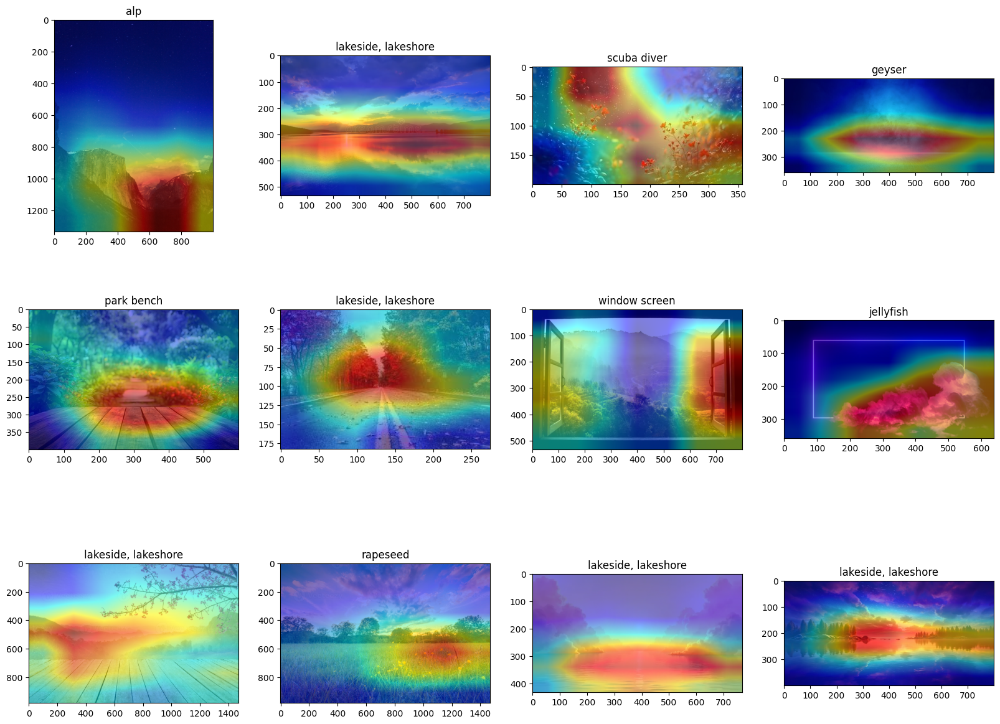

In [18]:
# visualize result
vis_img_label(gradcam_list, pred_list)

### <br><font color='red'>  **Problem 1 (f) Solution**</font>

After applying our Grad-CAM on those images we loaded, it results in many Grad-CAM visualization being quite similar with the prediction. There are some discrepancies as the "road" was labeled as a "lakeside, lakeshore".

## **Problem 2: Contrast-CAM (20 pts)**
We have learnt that Contract-CAM can help us answer a different kind of explainability question such as "Why P, rather than Q?". In this problem, we will instead use Contract-CAM to analyze examples from Imagenet.

**(a) Load Imagenet Images**<br>
Load provided `Imagenet` images and visualize them. <br> Use the code in the cell below to create a folder named `Imagenet_images` and store the `Imagenet` images we provide.

### <br><font color='red'>  **Problem 2 (a) Solution**</font>

In [19]:
# create a folder named `Imagenet_images`
!mkdir Imagenet_images

# download Imagenet images
!gdown --id 196BaTh-mJqj9Y4Zn0MWWIWm9oiYnebff --output './Imagenet_images/image1.jpeg'
!gdown --id 1OofwrL3xClMJukXMMpD3kLefIvPFdu10 --output './Imagenet_images/image2.jpeg'
!gdown --id 1bmJ-98dSz2JTgfRseJXYcVNkec55Vng4 --output './Imagenet_images/image3.jpeg'

/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=196BaTh-mJqj9Y4Zn0MWWIWm9oiYnebff
To: /content/Imagenet_images/image1.jpeg
100% 96.3k/96.3k [00:00<00:00, 100MB/s]
/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1OofwrL3xClMJukXMMpD3kLefIvPFdu10
To: /content/Imagenet_images/image2.jpeg
100% 921k/921k [00:00<00:00, 144MB/s]
/usr/local/lib/python3.11/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downl

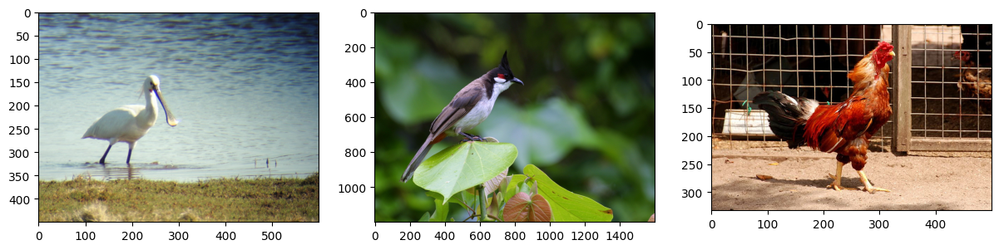

In [20]:
# visualize images

from PIL import Image
import matplotlib.pyplot as plt
from glob import glob
import os
import numpy as np

def imread(img_dir):
  # read the images into a list of `PIL.Image` objects
  images = []
  for f in sorted(glob(os.path.join(img_dir, "*"))):
    images.append(Image.open(f).convert('RGB'))

  return images

def vis_img_label(image_list, label_list=None):
  # visualize the images w/ labels
  Tot = len(image_list)
  Cols = 4
  Rows = Tot // Cols
  Rows += (Tot % Cols)>0
  if label_list is None:
    label_list = [""]*Tot
  # Create a Position index
  Position = range(1,Tot + 1)
  fig = plt.figure(figsize=(Cols*5, Rows*5))
  for i in range(Tot):
    image = image_list[i]
    # add every single subplot to the figure
    ax = fig.add_subplot(Rows,Cols,Position[i])
    ax.imshow(np.asarray(image))
    ax.set_title(label_list[i])


## Load Imagenet images
img_dir = "./Imagenet_images"
Imagenet_image_list = imread(img_dir)
## visualize Imagenet images
vis_img_label(Imagenet_image_list)

**(b) Create Imagenet Dataset**<br>
Create the Imagenet dataset by re-using `myDataset`.<br>


### <br><font color='red'>  **Problem 2 (b) Solution**</font>

In [22]:
# reuse myDataset class
Imagenet_dataset = myDataset(Imagenet_image_list, data_transform)
Imagenet_dataloader = DataLoader(Imagenet_dataset, batch_size=1, shuffle=False, num_workers=2)

#----verify the Imagenet dataset `myDataset`----#
print('The size of the dataset: ', len(Imagenet_dataset))
print('The dimension of the first image sample after transformations: ', Imagenet_dataset[0].shape)

The size of the dataset:  3
The dimension of the first image sample after transformations:  torch.Size([3, 224, 224])


**(c) Contrast-CAM class**<br>
Now, we are going to implement Contrast-CAM class. The only difference between Grad-CAM and Contrast-CAM is that Contrast-CAM utilizes the loss between predicted class $P$ and some contrast class $Q$ to get gradients:
$$\alpha_k^c=\frac{1}{Z}\underset{i}{\sum}\underset{j}{\sum}\frac{\partial J(P,Q)}{\partial A_{ij}^k}.$$
Hence, you can reuse most of your implementation from problem 1 (e) to complete this part.


### <br><font color='red'>  **Problem 2 (c) Solution**</font>

In [23]:
from ctypes import Array
# Contrast-CAM class implementation

import torch
import torch.nn.functional as F
from torch.autograd import Variable
from torch import nn
import numpy as np

class ContrastCAM():

  def __init__(self, model_object, layer_idx):
    """
    Args:
        model_object: model object that we apply Grad-CAM with
        layer_idx: index of the layer which we get activation maps

    """

    self.model = model_object

    self.gradients = dict()
    self.activations = dict()

    # backward hook for gradient
    def backward_hook(module, grad_input, grad_output):
      self.gradients['value'] = grad_output[0]
      return None

    # forward hook for activation map
    def forward_hook(module, input, output):
      self.activations['value'] = output
      return None

    if isinstance(model_object,  torchvision.models.vgg.VGG):
        target_layer = model_object.features[layer_idx]
    elif isinstance(model_object,  torchvision.models.resnet.ResNet):
        target_layer = model_object.layer4[-1]

    # register hooks
    target_layer.register_forward_hook(forward_hook)
    target_layer.register_backward_hook(backward_hook)

  def calculate(self, input, Q):
    """
    Args:
        input: input image with shape of (1, 3, H, W)
        Q: integer, class index for calculating Contrast-CAM

    Return:
        saliency_map: saliency map of the same spatial dimension with input
        logit: model output
    """
    b, c, h, w = input.size()
    self.model.eval()
    self.model.cuda()

    # model output
    logit = self.model(input)

    # predicting class
    y_c = logit[:, logit.max(1)[-1]].squeeze()

    # cross entropy loss function
    ce_loss = nn.CrossEntropyLoss()

    # calculate loss
    ##TODO
    array = torch.from_numpy(np.asarray([Q]))
    pred_loss = ce_loss(logit.cuda(), array.cuda())

    self.model.zero_grad()
    pred_loss.backward()

    # get activation maps and gradients
    gradients = self.gradients['value']
    activations = self.activations['value']
    b, k, i, j = gradients.size()

    # calculate alpha (step1)
    alpha = gradients.view(b, k, -1).mean(2)
    weights = alpha.view(b, k, 1, 1)

    # calculate Grad-CAM result using rectified weighted linear combination of feature activation maps (step2)
    ##TODO
    saliency_map = (weights*activations).sum(1, keepdim=True)
    saliency_map = F.relu(saliency_map)

    saliency_map = F.interpolate(saliency_map, size=(h, w), mode='bilinear', align_corners=False)
    saliency_map_min, saliency_map_max = saliency_map.min(), saliency_map.max()
    saliency_map = (saliency_map - saliency_map_min).div(saliency_map_max - saliency_map_min).data

    return saliency_map, logit

  def __call__(self, input, Q):
    return self.calculate(input, Q)

**(d) Contrast-CAM: Why P, rather than Q?**<br>
Use the Contrast-CAM visualization result to give your explaination for the "Why P, rather than Q?" question below. Suppose $Q$ is flamingo bird here.

### <br><font color='red'>  **Problem 2 (d) Solution**</font>

In [25]:
# Why P, rather than Q?

# create Contrast-CAM object
contrastcam = ContrastCAM(vgg16, 29)
contrastcam = ContrastCAM(resnet50, 0)

# Contrast-CAM result list
contrastcam_list = []

# prediction label list
imagenet_pred_list = []

# Q list
Q_list = [130, 130, 130]

for batch_id, img_tensor in enumerate(Imagenet_dataloader):

  img_tensor = img_tensor.cuda()
  mask_contrastcam, logit = contrastcam.calculate(img_tensor, Q_list[batch_id])

  output = F.softmax(logit, dim=1)
  pred_class_idx = output.argmax(dim=1)

  imagenet_pred_list.append(label_map[pred_class_idx.item()])

  # convert to original size
  mask_contrastcam = F.interpolate(mask_contrastcam.cpu(), np.asarray(Imagenet_dataset.img_list[batch_id]).shape[:2], mode='bilinear', align_corners=False)

  # align heatmap with image
  heatmap, result = visualize_cam(mask_contrastcam[0, 0, :, :].numpy(), Imagenet_dataset.img_list[batch_id])

  contrastcam_list.append(result)

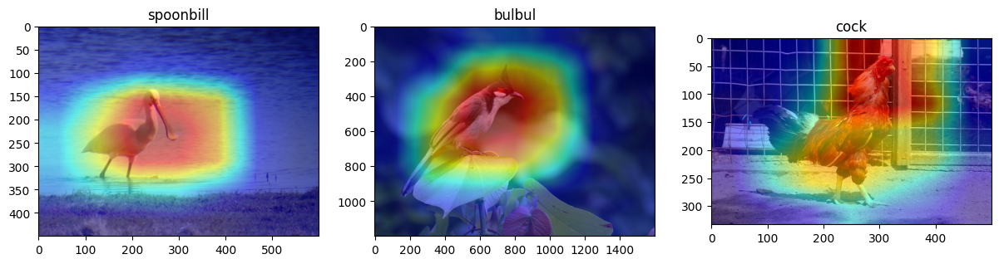

In [26]:
# visualize result
vis_img_label(contrastcam_list, imagenet_pred_list)

### <br><font color='red'>  **Problem 2 (d) Solution**</font>

When examining why an image is classified as class P rather than a flamingo using Contrast-CAM visualization, the technique highlights specific regions that simultaneously boost P's classification score while reducing the likelihood of the flamingo classification.
The highlighted areas in the visualization emphasize:

Body sections that diverge from the flamingo's characteristic slender, pink form
Legs that appear thick rather than the thin legs typical of flamingos
The straight neck configuration that differs from a flamingo's distinctive curved neck
Features that specifically align with class P's identifying characteristics (robust body structure, sturdier legs, distinctive beak morphology)

In essence, the bright red regions in the Contrast-CAM visualization precisely identify the anatomical elements whose appearance supports classification as P while contradicting identification as a flamingo.

**(e) Contrast-CAM: Why P, rather than P?**<br>
Use the Contrast-CAM visualization result to give your explaination for the "Why P, rather than P?" question below.

### <br><font color='red'>  **Problem 2 (e) Solution**</font>



In [27]:
# Why P, rather than P?

# Contrast-CAM result list
contrastcam_list = []

# P list
P_list = [129, 16, 7]

for batch_id, img_tensor in enumerate(Imagenet_dataloader):

  img_tensor = img_tensor.cuda()
  mask_contrastcam, logit = contrastcam.calculate(img_tensor, P_list[batch_id])

  output = F.softmax(logit, dim=1)
  pred_class_idx = output.argmax(dim=1)

  pred_list.append(label_map[pred_class_idx.item()])

  # convert to original size
  mask_contrastcam = F.interpolate(mask_contrastcam.cpu(), np.asarray(Imagenet_dataset.img_list[batch_id]).shape[:2], mode='bilinear', align_corners=False)

  # align heatmap with image
  heatmap, result = visualize_cam(mask_contrastcam[0, 0, :, :].numpy(), Imagenet_dataset.img_list[batch_id])

  contrastcam_list.append(result)

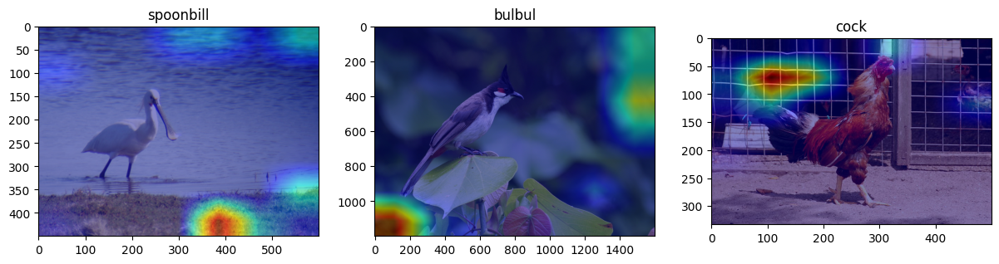

In [28]:
# visualize result
vis_img_label(contrastcam_list, imagenet_pred_list)

### <br><font color='red'>  **Problem 2 (e) Solution**</font>

When setting Q equal to P in the Contrast-CAM visualization (essentially comparing a class against itself), the mathematical computation results in no "opponent" gradient. In this scenario, Contrast-CAM functions identically to the standard Grad-CAM for class P.

The visualization produced simply highlights all image regions that positively contribute to the P classification score, without any suppression effect.

Consequently, when P is contrasted with itself, the visualization displays the complete set of features that aid in recognizing class P, rather than showing the distinctive features that differentiate P from another class.

## **Problem 3: MLP-Based AE From Scratch (30 pts)**

In this question, you will implement an MLP-based AE from scratch. In the previous homework, you implemented this structure using PyTorch. In other words, you did not have to deal with backpropagation and weight updates. In this question, you will go through all of these details step-by-step.

As you go through this question, you will notice that you have already implemented all of the individual parts in the previous homeworks. Therefore, for this question, you will be graded directly according to your results. In other words, you will not receive partial credits if your final answer is incorrect.


Let's first start by loading the dataset and visualizing a sample. We are using the MNIST dataset, which consists of images of size 28 by 28 in grayscale. After the dataset is loaded, the images are normalized.

100%|██████████| 9.91M/9.91M [00:01<00:00, 5.12MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 133kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.28MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 7.66MB/s]


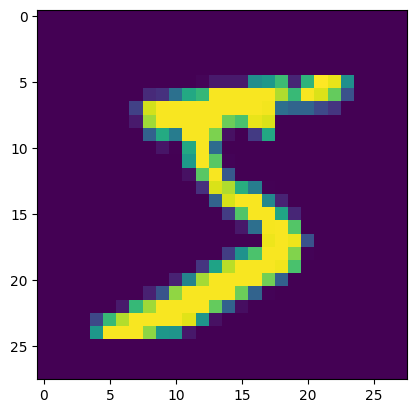

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import torchvision
%matplotlib inline

# load_dataset function;
# - takes training set of MNIST dataset from torch datasets,
# - flattens 28x28 images to 784 dimensional vectors

def load_dataset():

    mnist = torchvision.datasets.MNIST('./', train=True, download=True)

    X = np.zeros((len(mnist), 784))
    for n in range(len(mnist)):
        X[n] = np.array(mnist[n][0]).reshape(-1)
    return X


X = load_dataset()

# - Normalize the dataset in between 0-1
X =  X/X.max()

#visualize 1 sample
plt.imshow(X[0].reshape(28,28))
plt.show()

**(a) Initializing Weights**<br>
In this part, you will initialize the weights as numpy arrays. For this question, assume that the network does not contain any biases. In other words, for the $i^{th}$ layer, the output is obtained with the following formula.

$$X_{i+1} = X_{i} \times W_{i}$$

Randomly initialize layer one and layer two weights with 64 hidden layer size as 2D numpy arrays with zero mean and $0.01$ standard deviation.

### <br><font color='red'>  **Problem 3 (a) Solution**</font>

In [37]:
INPUT_SIZE  = X.shape[1]
HIDDEN_SIZE = 64

w1 =  np.random.normal(loc=0.0, scale=0.01, size=[INPUT_SIZE, HIDDEN_SIZE])
w2 =  np.random.normal(loc=0.0, scale=0.01, size=[HIDDEN_SIZE, INPUT_SIZE])


**(b) Activation Functions**<br>
In this part, as usual, you will define the activation functions in forward and backward modes.

### <br><font color='red'>  **Problem 3 (b) Solution**</font>

In [36]:
def relu(x):
    ################

    return np.maximum(x, 0) #TODO
    ################

def relu_backward(D_output, output):
    '''
    relu_backward: Backward mode of relu activation function

    Arguments;
    D_output: Derivative of output of relu with respect to loss.
    output  : Output of relu activation function

    Returns;
    Derivative of input of relu function with respect to loss.
    '''
    #TODO
    dZ = np.array(D_output, copy=True)
    dZ[output <= 0] = 0
    return dZ;

In [30]:
def sigmoid(x):
    ################
    return 1 / (1 + np.exp(-x))
    ################

def sigmoid_backward(D_output, output):
    '''
    sigmoid_backward: Backward mode of sigmoid activation function

    Arguments;
    D_output: Derivative of output of sigmoid with respect to loss.
    output  : Output of sigmoid activation function

    Returns;
    Derivative of input of sigmoid function with respect to loss.
    '''
    return D_output * output * (1 - output) #TODO

**(c) Activation Functions**<br>
In this part, you will define the function computing mean squared error metric, given outputs and targets.

### <br><font color='red'>  **Problem 3 (c) Solution**</font>

In [31]:
def mean_squared_error(outputs, targets):
    return np.mean((outputs - targets)**2)

**(d) Training**<br>
We are now ready to train our network. First set some hyperparameters (you may want to reconsider these values in the future.)

### <br><font color='red'>  **Problem 3 (d) Solution**</font>

In [33]:
BATCH_SIZE = 1024
NUM_EPOCHS = 20
LEARNING_RATE = 0.001

As we will work with batches, you should calculate how many iterations will be done per epoch.

Hint: You may want to use `//` operator, which does integer division in Python 3.

In [34]:
NUM_TRAINING_INSTANCES = X.shape[0]
ITERATIONS_PER_EPOCH = NUM_TRAINING_INSTANCES // BATCH_SIZE

print("The iterations that will be done every epoch is: ", ITERATIONS_PER_EPOCH)

The iterations that will be done every epoch is:  58


Training loop mainly consists of 4 steps

1) Sample batch from dataset

2) Forward propagation
  - Use a relu after the first matrix multiplication and use a sigmoid after the second matrix multiplication.

3) Backpropagation

4) Parameter updates

1st step is implemented. You are expected to implement forward propagation, backpropagation, and parameter updates using the functions you defined above.

- You can use ```@``` operator or ```np.dot``` function for matrix multiplication.
- Note that you have implemented every backward operation needed, except matrix multiplication. Find out what is the backward mode of matrix multiplication operation.

Epoch 1, Iteration 0 -- Loss: 0.231347


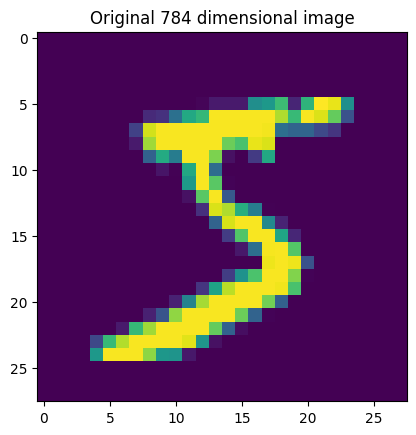

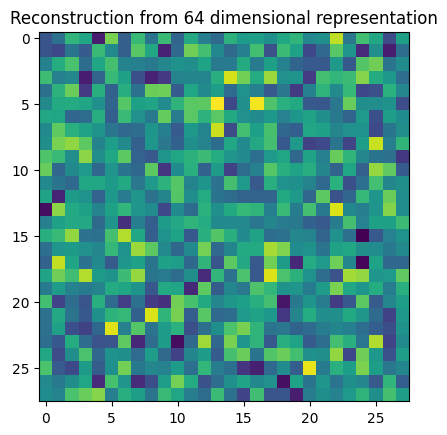

Epoch 1, Iteration 1 -- Loss: 0.178512
Epoch 1, Iteration 2 -- Loss: 0.115535
Epoch 1, Iteration 3 -- Loss: 0.113276
Epoch 1, Iteration 4 -- Loss: 0.118508
Epoch 1, Iteration 5 -- Loss: 0.120484


<ipython-input-30-7f233ce9507c>:3: RuntimeWarning: overflow encountered in exp
  return 1 / (1 + np.exp(-x))


Epoch 1, Iteration 6 -- Loss: 0.113838
Epoch 1, Iteration 7 -- Loss: 0.114915
Epoch 1, Iteration 8 -- Loss: 0.119352
Epoch 1, Iteration 9 -- Loss: 0.118632
Epoch 1, Iteration 10 -- Loss: 0.121552


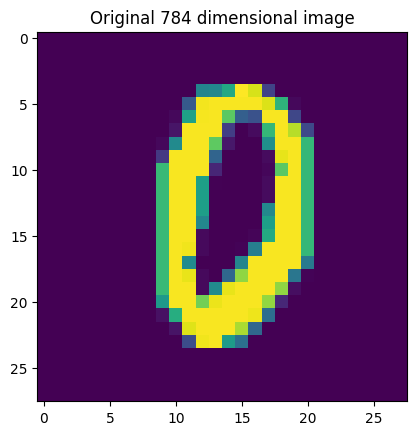

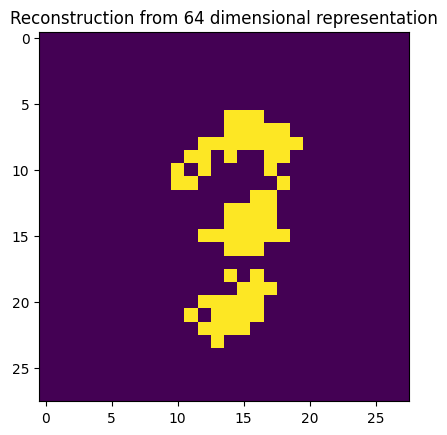

Epoch 1, Iteration 11 -- Loss: 0.116524
Epoch 1, Iteration 12 -- Loss: 0.124131
Epoch 1, Iteration 13 -- Loss: 0.123379
Epoch 1, Iteration 14 -- Loss: 0.116760
Epoch 1, Iteration 15 -- Loss: 0.116271
Epoch 1, Iteration 16 -- Loss: 0.116872
Epoch 1, Iteration 17 -- Loss: 0.111759
Epoch 1, Iteration 18 -- Loss: 0.117940
Epoch 1, Iteration 19 -- Loss: 0.123857
Epoch 1, Iteration 20 -- Loss: 0.119476


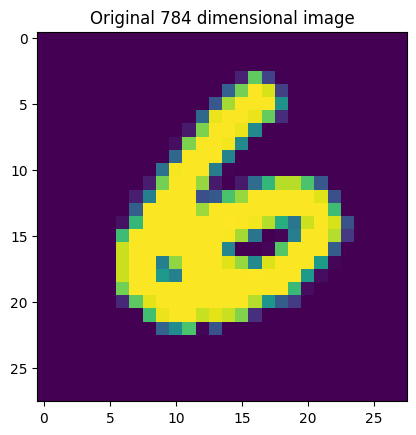

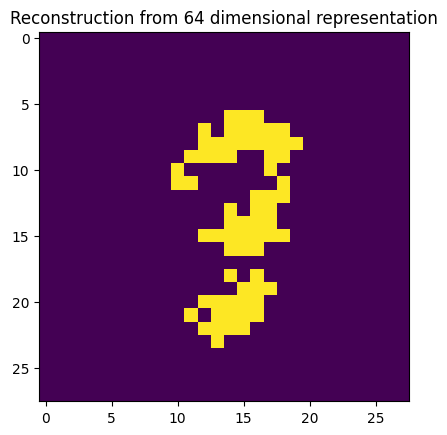

Epoch 1, Iteration 21 -- Loss: 0.120213
Epoch 1, Iteration 22 -- Loss: 0.123057
Epoch 1, Iteration 23 -- Loss: 0.116947
Epoch 1, Iteration 24 -- Loss: 0.117673
Epoch 1, Iteration 25 -- Loss: 0.114031
Epoch 1, Iteration 26 -- Loss: 0.119874
Epoch 1, Iteration 27 -- Loss: 0.120499
Epoch 1, Iteration 28 -- Loss: 0.119080
Epoch 1, Iteration 29 -- Loss: 0.114990
Epoch 1, Iteration 30 -- Loss: 0.113791


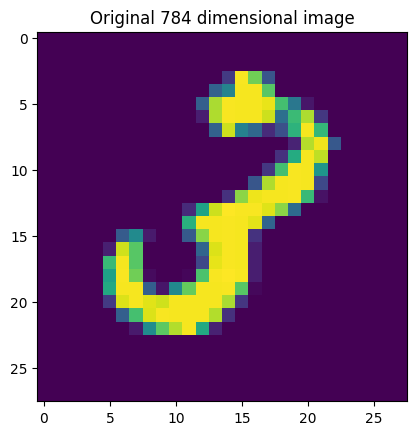

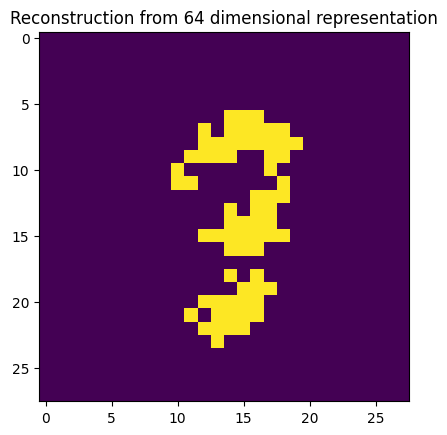

Epoch 1, Iteration 31 -- Loss: 0.119273
Epoch 1, Iteration 32 -- Loss: 0.117113
Epoch 1, Iteration 33 -- Loss: 0.117057
Epoch 1, Iteration 34 -- Loss: 0.117553
Epoch 1, Iteration 35 -- Loss: 0.122240
Epoch 1, Iteration 36 -- Loss: 0.120003
Epoch 1, Iteration 37 -- Loss: 0.117768
Epoch 1, Iteration 38 -- Loss: 0.117558
Epoch 1, Iteration 39 -- Loss: 0.119247
Epoch 1, Iteration 40 -- Loss: 0.118191


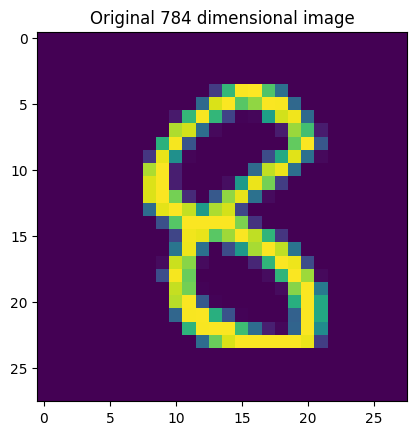

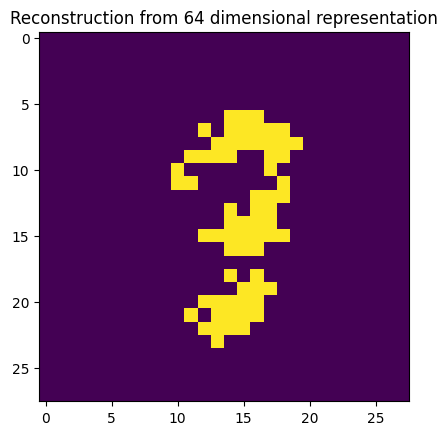

Epoch 1, Iteration 41 -- Loss: 0.120413
Epoch 1, Iteration 42 -- Loss: 0.113936
Epoch 1, Iteration 43 -- Loss: 0.116791
Epoch 1, Iteration 44 -- Loss: 0.117389
Epoch 1, Iteration 45 -- Loss: 0.118919
Epoch 1, Iteration 46 -- Loss: 0.120334
Epoch 1, Iteration 47 -- Loss: 0.121454
Epoch 1, Iteration 48 -- Loss: 0.118907
Epoch 1, Iteration 49 -- Loss: 0.116130
Epoch 1, Iteration 50 -- Loss: 0.119521


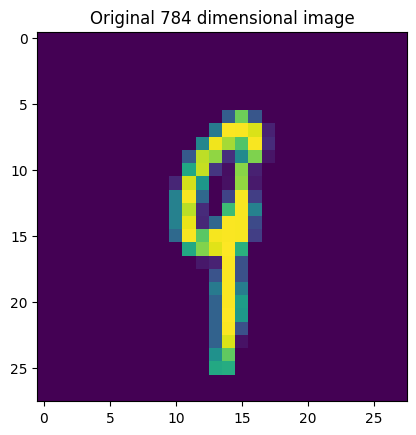

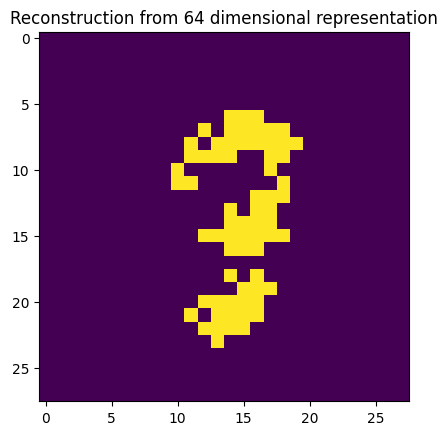

Epoch 1, Iteration 51 -- Loss: 0.115053
Epoch 1, Iteration 52 -- Loss: 0.116501
Epoch 1, Iteration 53 -- Loss: 0.117685
Epoch 1, Iteration 54 -- Loss: 0.118027
Epoch 1, Iteration 55 -- Loss: 0.117006
Epoch 1, Iteration 56 -- Loss: 0.116755
Epoch 1, Iteration 57 -- Loss: 0.118054
Epoch 2, Iteration 58 -- Loss: 0.117483


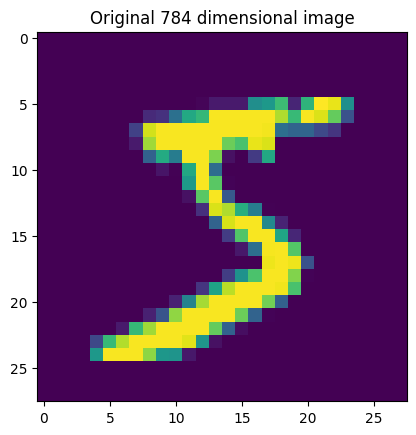

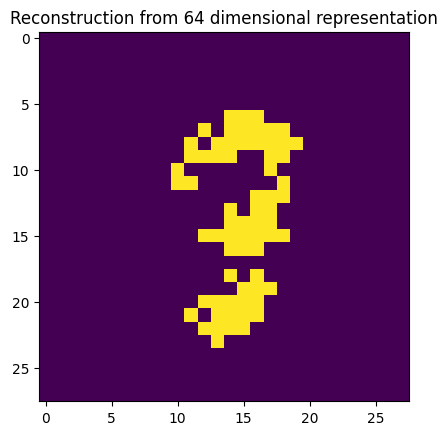

Epoch 2, Iteration 59 -- Loss: 0.117932
Epoch 2, Iteration 60 -- Loss: 0.119910
Epoch 2, Iteration 61 -- Loss: 0.116417
Epoch 2, Iteration 62 -- Loss: 0.121795
Epoch 2, Iteration 63 -- Loss: 0.122132
Epoch 2, Iteration 64 -- Loss: 0.115524
Epoch 2, Iteration 65 -- Loss: 0.115969
Epoch 2, Iteration 66 -- Loss: 0.120043
Epoch 2, Iteration 67 -- Loss: 0.119700
Epoch 2, Iteration 68 -- Loss: 0.121789


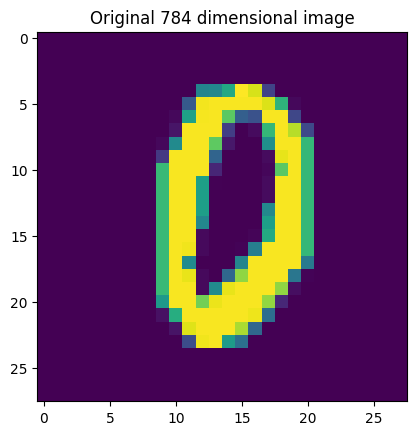

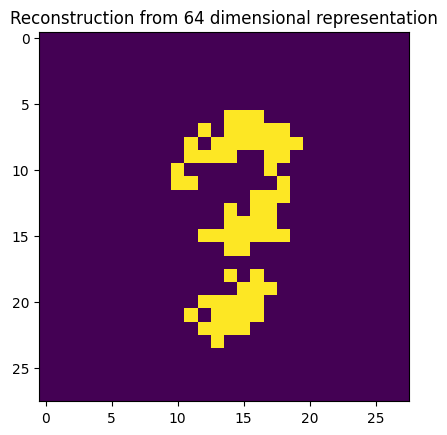

Epoch 2, Iteration 69 -- Loss: 0.116887
Epoch 2, Iteration 70 -- Loss: 0.124409
Epoch 2, Iteration 71 -- Loss: 0.123408
Epoch 2, Iteration 72 -- Loss: 0.117122
Epoch 2, Iteration 73 -- Loss: 0.116832
Epoch 2, Iteration 74 -- Loss: 0.117090
Epoch 2, Iteration 75 -- Loss: 0.112312
Epoch 2, Iteration 76 -- Loss: 0.118074
Epoch 2, Iteration 77 -- Loss: 0.123874
Epoch 2, Iteration 78 -- Loss: 0.119424


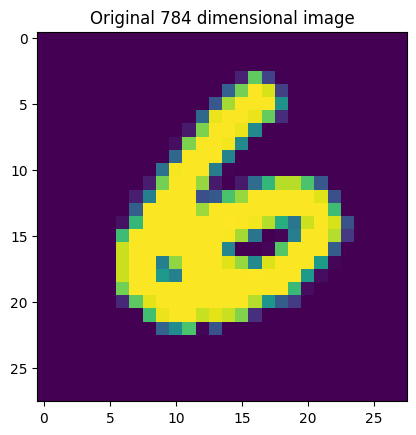

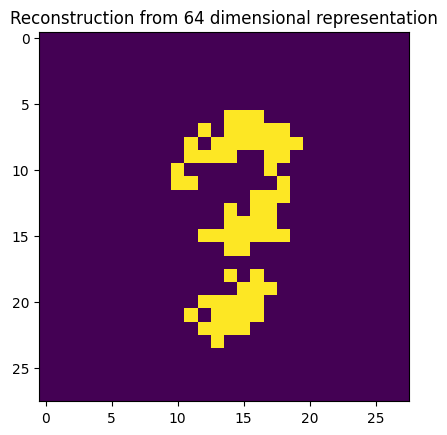

Epoch 2, Iteration 79 -- Loss: 0.120177
Epoch 2, Iteration 80 -- Loss: 0.123234
Epoch 2, Iteration 81 -- Loss: 0.117057
Epoch 2, Iteration 82 -- Loss: 0.117767
Epoch 2, Iteration 83 -- Loss: 0.113936
Epoch 2, Iteration 84 -- Loss: 0.119738
Epoch 2, Iteration 85 -- Loss: 0.120551
Epoch 2, Iteration 86 -- Loss: 0.119136
Epoch 2, Iteration 87 -- Loss: 0.114946
Epoch 2, Iteration 88 -- Loss: 0.113711


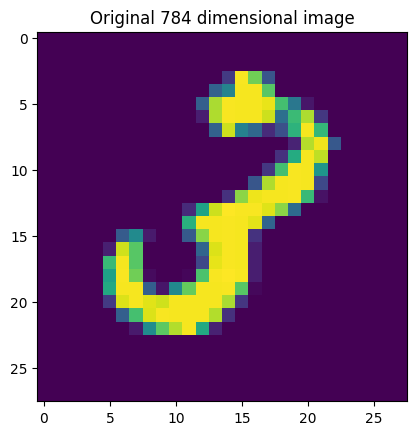

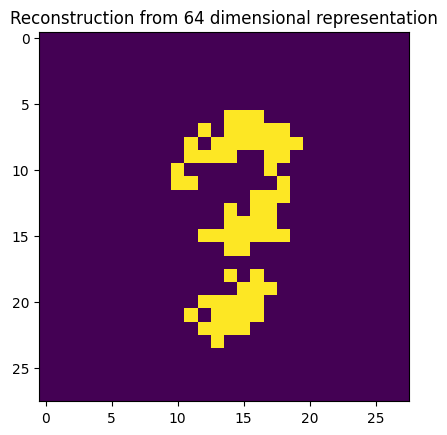

Epoch 2, Iteration 89 -- Loss: 0.119295
Epoch 2, Iteration 90 -- Loss: 0.117059
Epoch 2, Iteration 91 -- Loss: 0.117133
Epoch 2, Iteration 92 -- Loss: 0.117700
Epoch 2, Iteration 93 -- Loss: 0.122247
Epoch 2, Iteration 94 -- Loss: 0.120136
Epoch 2, Iteration 95 -- Loss: 0.117747
Epoch 2, Iteration 96 -- Loss: 0.117638
Epoch 2, Iteration 97 -- Loss: 0.119343
Epoch 2, Iteration 98 -- Loss: 0.118442


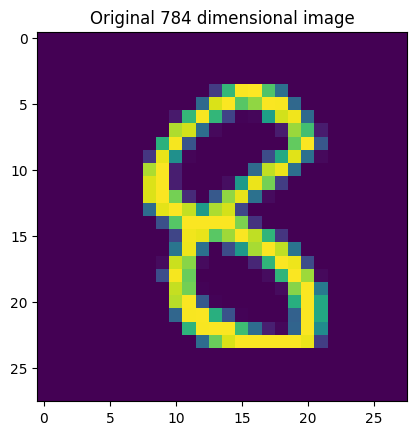

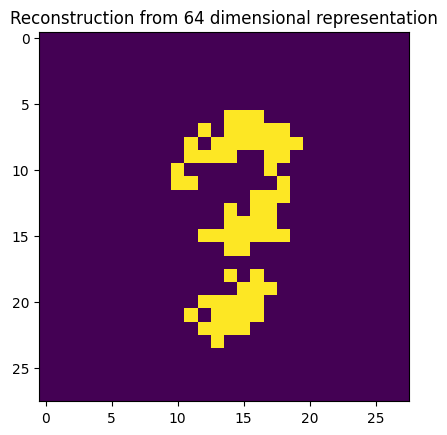

Epoch 2, Iteration 99 -- Loss: 0.120315
Epoch 2, Iteration 100 -- Loss: 0.114082
Epoch 2, Iteration 101 -- Loss: 0.116777
Epoch 2, Iteration 102 -- Loss: 0.117439
Epoch 2, Iteration 103 -- Loss: 0.119254
Epoch 2, Iteration 104 -- Loss: 0.120405
Epoch 2, Iteration 105 -- Loss: 0.121687
Epoch 2, Iteration 106 -- Loss: 0.119025
Epoch 2, Iteration 107 -- Loss: 0.115962
Epoch 2, Iteration 108 -- Loss: 0.119470


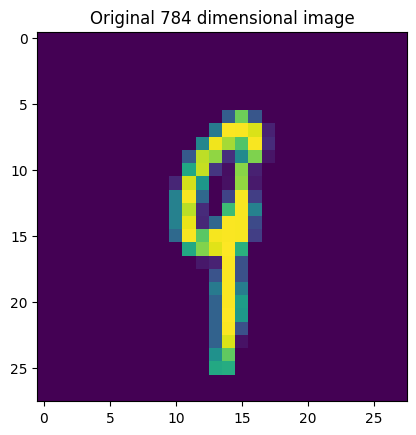

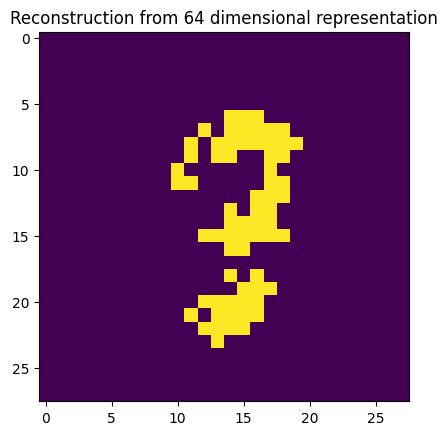

Epoch 2, Iteration 109 -- Loss: 0.115136
Epoch 2, Iteration 110 -- Loss: 0.116186
Epoch 2, Iteration 111 -- Loss: 0.117727
Epoch 2, Iteration 112 -- Loss: 0.118174
Epoch 2, Iteration 113 -- Loss: 0.116939
Epoch 2, Iteration 114 -- Loss: 0.116519
Epoch 2, Iteration 115 -- Loss: 0.118039
Epoch 3, Iteration 116 -- Loss: 0.117996


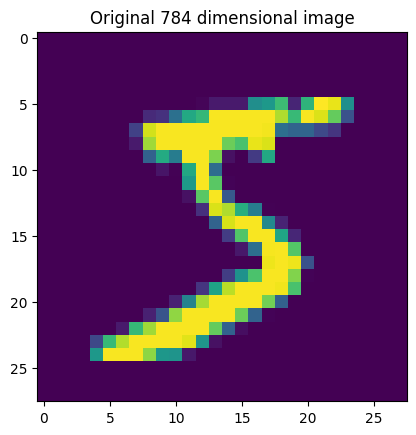

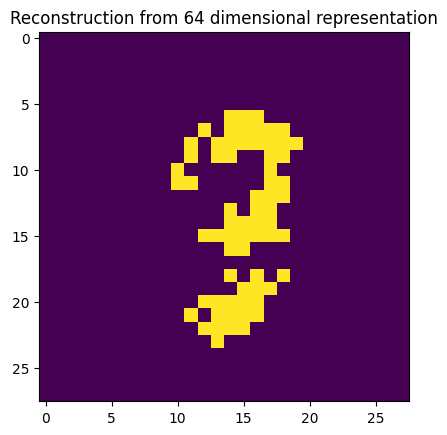

Epoch 3, Iteration 117 -- Loss: 0.118291
Epoch 3, Iteration 118 -- Loss: 0.120315
Epoch 3, Iteration 119 -- Loss: 0.116846
Epoch 3, Iteration 120 -- Loss: 0.122162
Epoch 3, Iteration 121 -- Loss: 0.122500
Epoch 3, Iteration 122 -- Loss: 0.115905
Epoch 3, Iteration 123 -- Loss: 0.116300
Epoch 3, Iteration 124 -- Loss: 0.120320
Epoch 3, Iteration 125 -- Loss: 0.119910
Epoch 3, Iteration 126 -- Loss: 0.122023


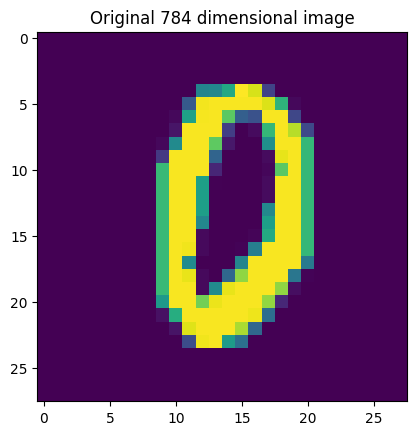

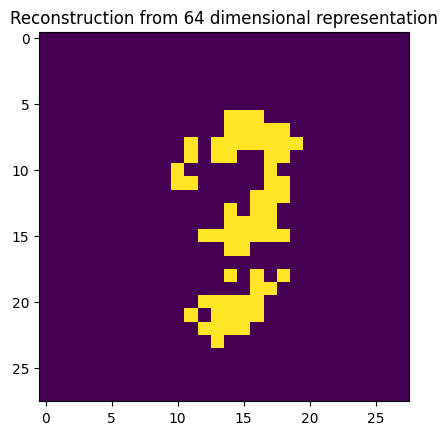

Epoch 3, Iteration 127 -- Loss: 0.117090
Epoch 3, Iteration 128 -- Loss: 0.124523
Epoch 3, Iteration 129 -- Loss: 0.123443
Epoch 3, Iteration 130 -- Loss: 0.117262
Epoch 3, Iteration 131 -- Loss: 0.117145
Epoch 3, Iteration 132 -- Loss: 0.117299
Epoch 3, Iteration 133 -- Loss: 0.112605
Epoch 3, Iteration 134 -- Loss: 0.118393
Epoch 3, Iteration 135 -- Loss: 0.123951
Epoch 3, Iteration 136 -- Loss: 0.119651


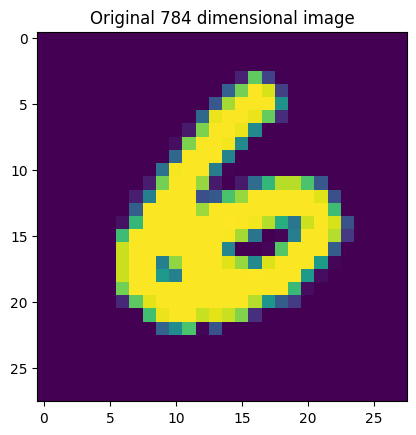

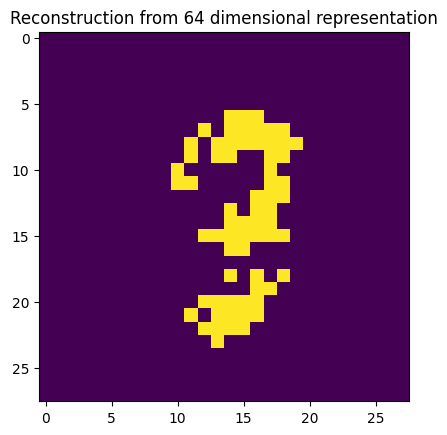

Epoch 3, Iteration 137 -- Loss: 0.120133
Epoch 3, Iteration 138 -- Loss: 0.123690
Epoch 3, Iteration 139 -- Loss: 0.117453
Epoch 3, Iteration 140 -- Loss: 0.118002
Epoch 3, Iteration 141 -- Loss: 0.113878
Epoch 3, Iteration 142 -- Loss: 0.119741
Epoch 3, Iteration 143 -- Loss: 0.120702
Epoch 3, Iteration 144 -- Loss: 0.119295
Epoch 3, Iteration 145 -- Loss: 0.115155
Epoch 3, Iteration 146 -- Loss: 0.114224


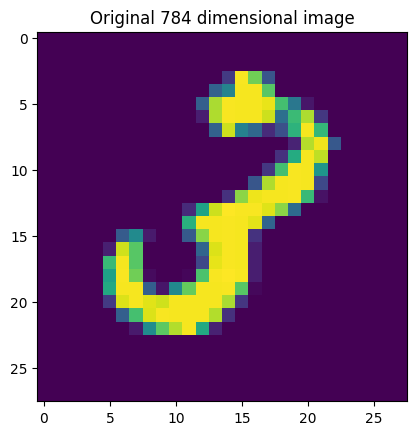

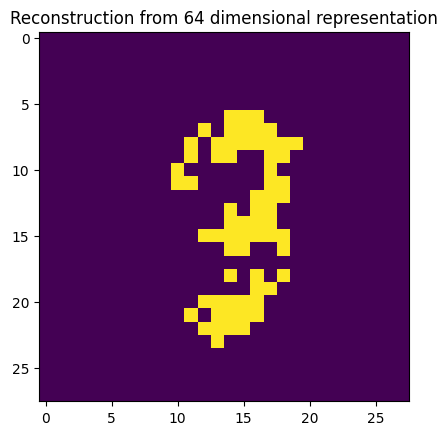

Epoch 3, Iteration 147 -- Loss: 0.119853
Epoch 3, Iteration 148 -- Loss: 0.117074
Epoch 3, Iteration 149 -- Loss: 0.117538
Epoch 3, Iteration 150 -- Loss: 0.118434
Epoch 3, Iteration 151 -- Loss: 0.122530
Epoch 3, Iteration 152 -- Loss: 0.120510
Epoch 3, Iteration 153 -- Loss: 0.118421
Epoch 3, Iteration 154 -- Loss: 0.118346
Epoch 3, Iteration 155 -- Loss: 0.119927
Epoch 3, Iteration 156 -- Loss: 0.118845


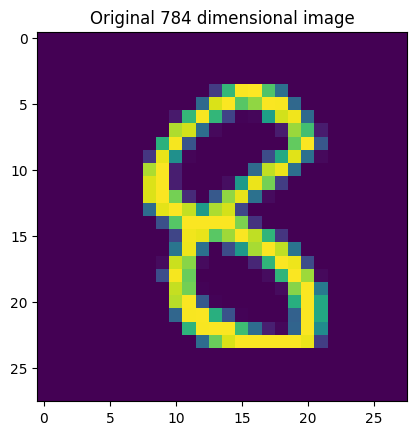

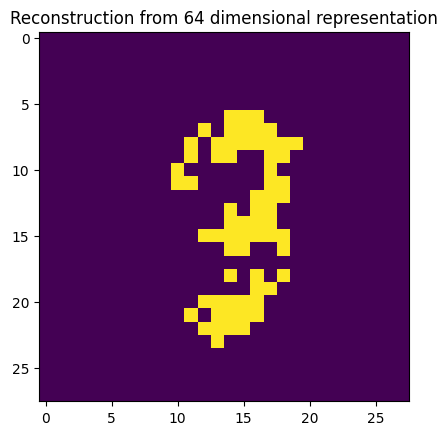

Epoch 3, Iteration 157 -- Loss: 0.120961
Epoch 3, Iteration 158 -- Loss: 0.114940
Epoch 3, Iteration 159 -- Loss: 0.117451
Epoch 3, Iteration 160 -- Loss: 0.117609
Epoch 3, Iteration 161 -- Loss: 0.119564
Epoch 3, Iteration 162 -- Loss: 0.120888
Epoch 3, Iteration 163 -- Loss: 0.121802
Epoch 3, Iteration 164 -- Loss: 0.119361
Epoch 3, Iteration 165 -- Loss: 0.116348
Epoch 3, Iteration 166 -- Loss: 0.119939


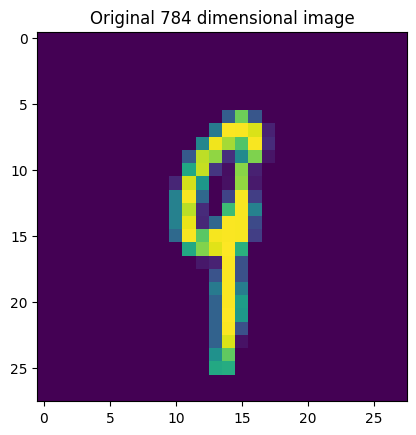

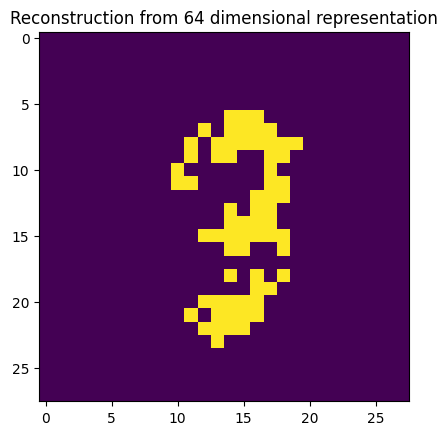

Epoch 3, Iteration 167 -- Loss: 0.115604
Epoch 3, Iteration 168 -- Loss: 0.116491
Epoch 3, Iteration 169 -- Loss: 0.118204
Epoch 3, Iteration 170 -- Loss: 0.118635
Epoch 3, Iteration 171 -- Loss: 0.117148
Epoch 3, Iteration 172 -- Loss: 0.117247
Epoch 3, Iteration 173 -- Loss: 0.118581
Epoch 4, Iteration 174 -- Loss: 0.118006


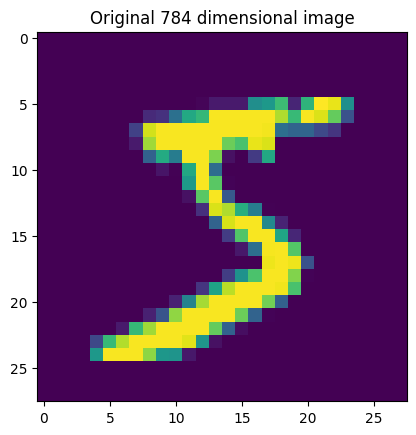

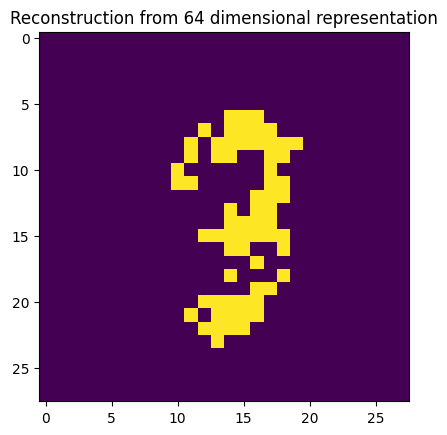

Epoch 4, Iteration 175 -- Loss: 0.118364
Epoch 4, Iteration 176 -- Loss: 0.120285
Epoch 4, Iteration 177 -- Loss: 0.116779
Epoch 4, Iteration 178 -- Loss: 0.122128
Epoch 4, Iteration 179 -- Loss: 0.122896
Epoch 4, Iteration 180 -- Loss: 0.116114
Epoch 4, Iteration 181 -- Loss: 0.116300
Epoch 4, Iteration 182 -- Loss: 0.120439
Epoch 4, Iteration 183 -- Loss: 0.120079
Epoch 4, Iteration 184 -- Loss: 0.122272


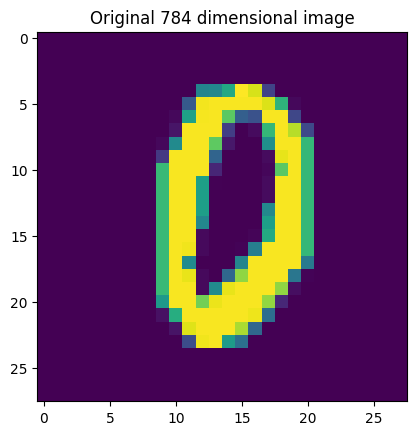

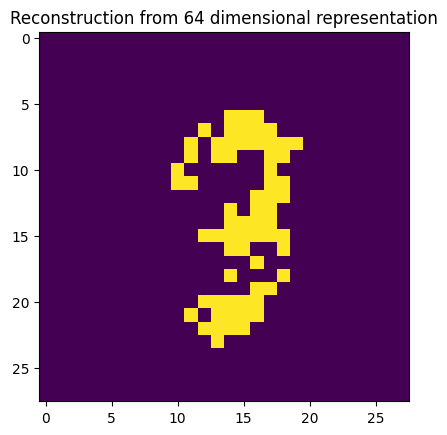

Epoch 4, Iteration 185 -- Loss: 0.117564
Epoch 4, Iteration 186 -- Loss: 0.124985
Epoch 4, Iteration 187 -- Loss: 0.123661
Epoch 4, Iteration 188 -- Loss: 0.117464
Epoch 4, Iteration 189 -- Loss: 0.117380
Epoch 4, Iteration 190 -- Loss: 0.117472
Epoch 4, Iteration 191 -- Loss: 0.112743
Epoch 4, Iteration 192 -- Loss: 0.118528
Epoch 4, Iteration 193 -- Loss: 0.124023
Epoch 4, Iteration 194 -- Loss: 0.119984


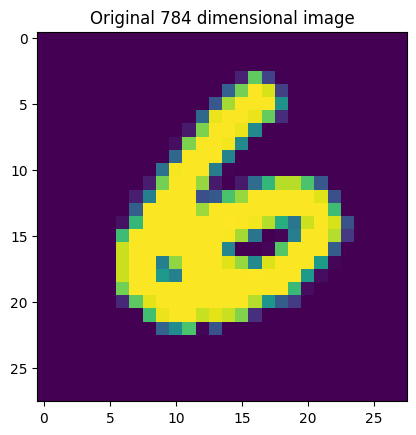

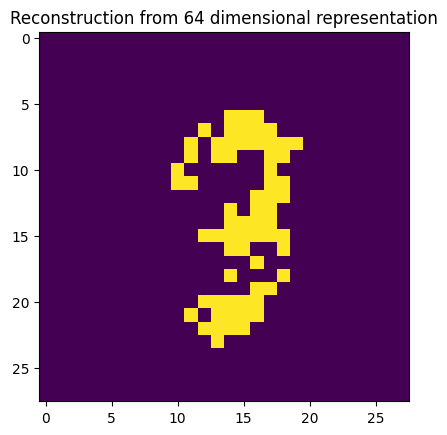

Epoch 4, Iteration 195 -- Loss: 0.120261
Epoch 4, Iteration 196 -- Loss: 0.123765
Epoch 4, Iteration 197 -- Loss: 0.117618
Epoch 4, Iteration 198 -- Loss: 0.118149
Epoch 4, Iteration 199 -- Loss: 0.114549
Epoch 4, Iteration 200 -- Loss: 0.120178
Epoch 4, Iteration 201 -- Loss: 0.121233
Epoch 4, Iteration 202 -- Loss: 0.119940
Epoch 4, Iteration 203 -- Loss: 0.115613
Epoch 4, Iteration 204 -- Loss: 0.114529


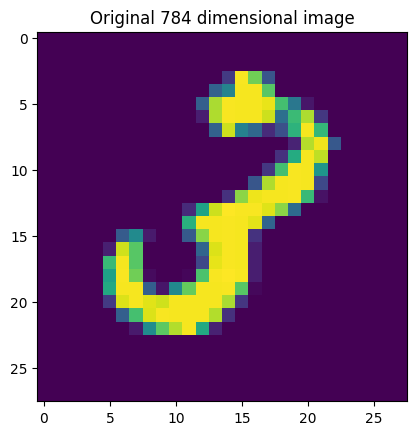

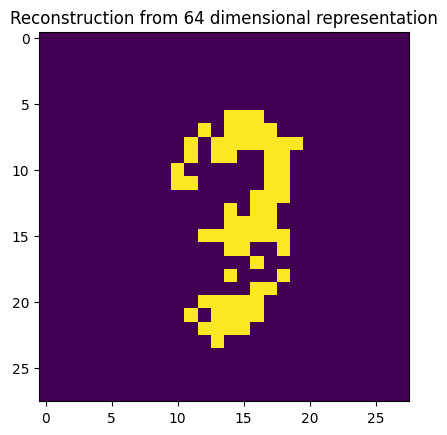

Epoch 4, Iteration 205 -- Loss: 0.120087
Epoch 4, Iteration 206 -- Loss: 0.117637
Epoch 4, Iteration 207 -- Loss: 0.117713
Epoch 4, Iteration 208 -- Loss: 0.118664
Epoch 4, Iteration 209 -- Loss: 0.122676
Epoch 4, Iteration 210 -- Loss: 0.120639
Epoch 4, Iteration 211 -- Loss: 0.118352
Epoch 4, Iteration 212 -- Loss: 0.118548
Epoch 4, Iteration 213 -- Loss: 0.120147
Epoch 4, Iteration 214 -- Loss: 0.119099


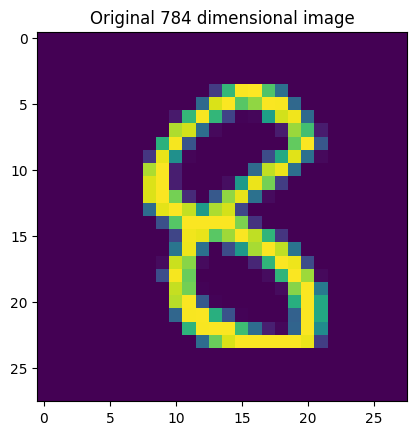

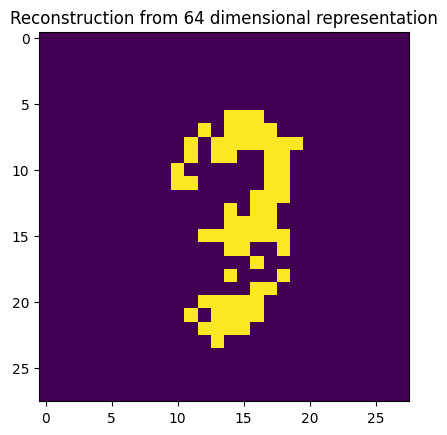

Epoch 4, Iteration 215 -- Loss: 0.121222
Epoch 4, Iteration 216 -- Loss: 0.115062
Epoch 4, Iteration 217 -- Loss: 0.117664
Epoch 4, Iteration 218 -- Loss: 0.118018
Epoch 4, Iteration 219 -- Loss: 0.119731
Epoch 4, Iteration 220 -- Loss: 0.121046
Epoch 4, Iteration 221 -- Loss: 0.122061
Epoch 4, Iteration 222 -- Loss: 0.119671
Epoch 4, Iteration 223 -- Loss: 0.116593
Epoch 4, Iteration 224 -- Loss: 0.120142


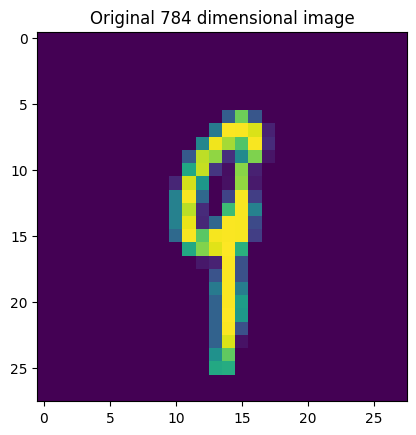

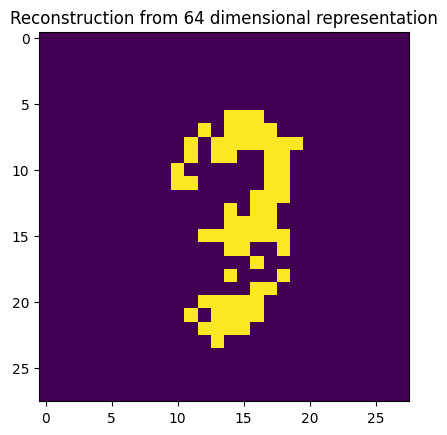

Epoch 4, Iteration 225 -- Loss: 0.115823
Epoch 4, Iteration 226 -- Loss: 0.116806
Epoch 4, Iteration 227 -- Loss: 0.118324
Epoch 4, Iteration 228 -- Loss: 0.118871
Epoch 4, Iteration 229 -- Loss: 0.117458
Epoch 4, Iteration 230 -- Loss: 0.117184
Epoch 4, Iteration 231 -- Loss: 0.118788
Epoch 5, Iteration 232 -- Loss: 0.118230


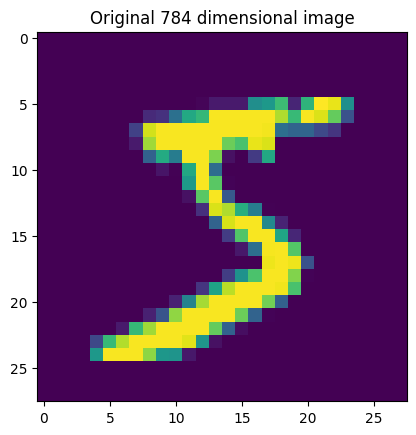

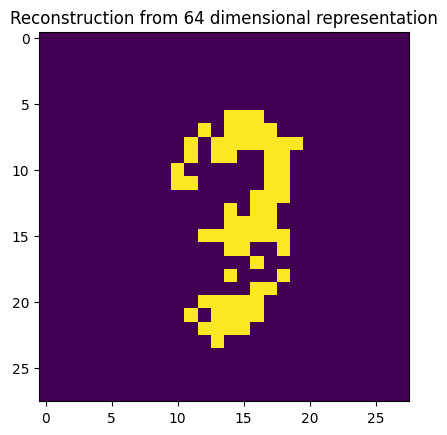

Epoch 5, Iteration 233 -- Loss: 0.118549
Epoch 5, Iteration 234 -- Loss: 0.120593
Epoch 5, Iteration 235 -- Loss: 0.116983
Epoch 5, Iteration 236 -- Loss: 0.122321
Epoch 5, Iteration 237 -- Loss: 0.122979
Epoch 5, Iteration 238 -- Loss: 0.116318
Epoch 5, Iteration 239 -- Loss: 0.116493
Epoch 5, Iteration 240 -- Loss: 0.120594
Epoch 5, Iteration 241 -- Loss: 0.120245
Epoch 5, Iteration 242 -- Loss: 0.122508


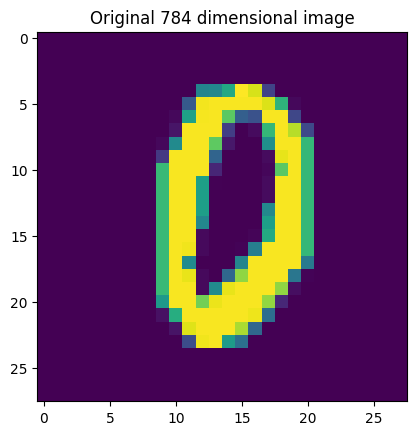

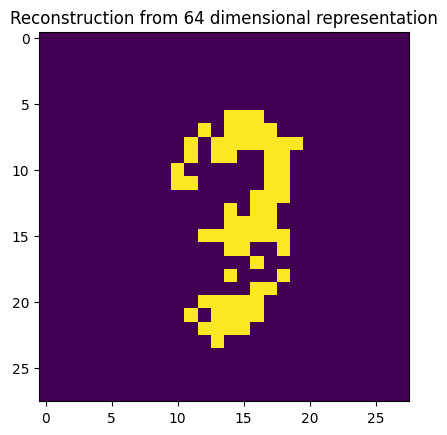

Epoch 5, Iteration 243 -- Loss: 0.117708
Epoch 5, Iteration 244 -- Loss: 0.125155
Epoch 5, Iteration 245 -- Loss: 0.123856
Epoch 5, Iteration 246 -- Loss: 0.117810
Epoch 5, Iteration 247 -- Loss: 0.117630
Epoch 5, Iteration 248 -- Loss: 0.117678
Epoch 5, Iteration 249 -- Loss: 0.112966
Epoch 5, Iteration 250 -- Loss: 0.118753
Epoch 5, Iteration 251 -- Loss: 0.124218
Epoch 5, Iteration 252 -- Loss: 0.120183


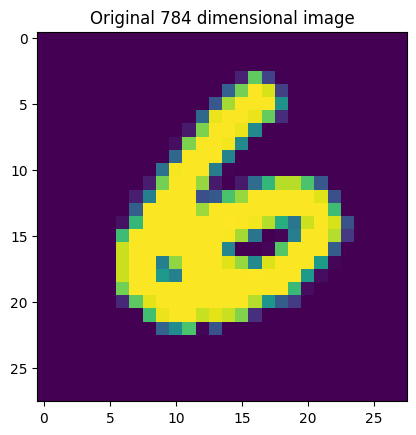

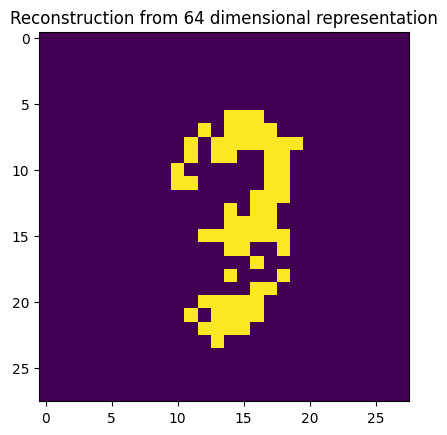

Epoch 5, Iteration 253 -- Loss: 0.120425
Epoch 5, Iteration 254 -- Loss: 0.123912
Epoch 5, Iteration 255 -- Loss: 0.117849
Epoch 5, Iteration 256 -- Loss: 0.118290
Epoch 5, Iteration 257 -- Loss: 0.114549
Epoch 5, Iteration 258 -- Loss: 0.120177
Epoch 5, Iteration 259 -- Loss: 0.121233
Epoch 5, Iteration 260 -- Loss: 0.119939
Epoch 5, Iteration 261 -- Loss: 0.115778
Epoch 5, Iteration 262 -- Loss: 0.114529


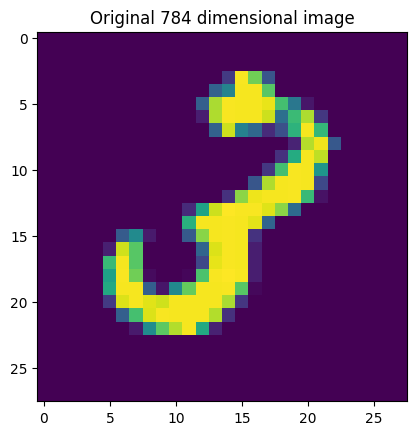

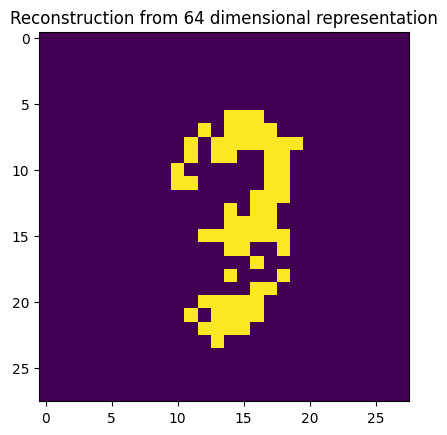

Epoch 5, Iteration 263 -- Loss: 0.120087
Epoch 5, Iteration 264 -- Loss: 0.117636
Epoch 5, Iteration 265 -- Loss: 0.117981
Epoch 5, Iteration 266 -- Loss: 0.118886
Epoch 5, Iteration 267 -- Loss: 0.122946
Epoch 5, Iteration 268 -- Loss: 0.120948
Epoch 5, Iteration 269 -- Loss: 0.118667
Epoch 5, Iteration 270 -- Loss: 0.118741
Epoch 5, Iteration 271 -- Loss: 0.120379
Epoch 5, Iteration 272 -- Loss: 0.119099


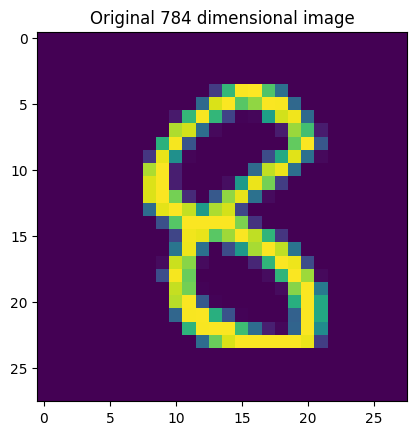

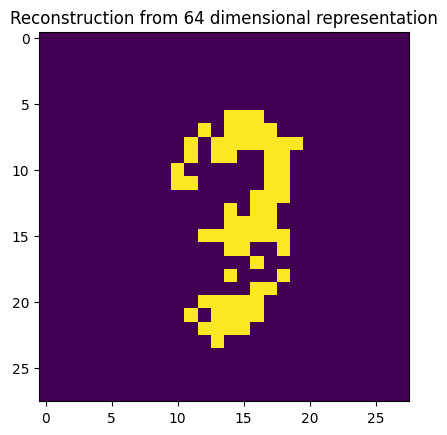

Epoch 5, Iteration 273 -- Loss: 0.121222
Epoch 5, Iteration 274 -- Loss: 0.115062
Epoch 5, Iteration 275 -- Loss: 0.117664
Epoch 5, Iteration 276 -- Loss: 0.118003
Epoch 5, Iteration 277 -- Loss: 0.120086
Epoch 5, Iteration 278 -- Loss: 0.121239
Epoch 5, Iteration 279 -- Loss: 0.122227
Epoch 5, Iteration 280 -- Loss: 0.119959
Epoch 5, Iteration 281 -- Loss: 0.116855
Epoch 5, Iteration 282 -- Loss: 0.120466


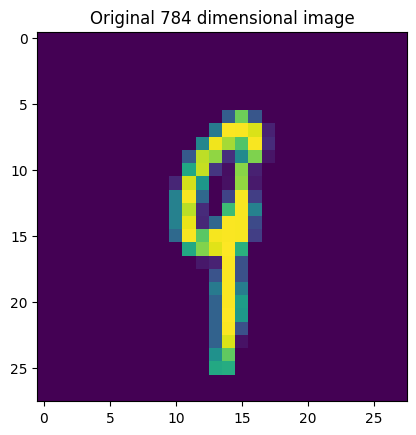

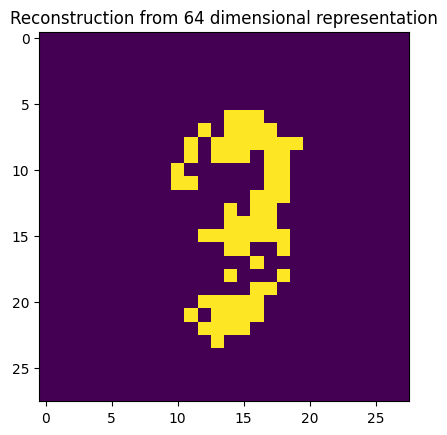

Epoch 5, Iteration 283 -- Loss: 0.116179
Epoch 5, Iteration 284 -- Loss: 0.117212
Epoch 5, Iteration 285 -- Loss: 0.118595
Epoch 5, Iteration 286 -- Loss: 0.119166
Epoch 5, Iteration 287 -- Loss: 0.117795
Epoch 5, Iteration 288 -- Loss: 0.117591
Epoch 5, Iteration 289 -- Loss: 0.119223
Epoch 6, Iteration 290 -- Loss: 0.118598


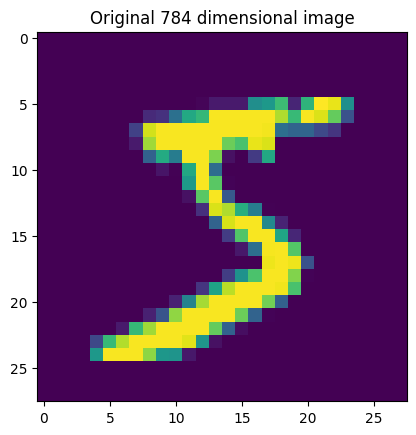

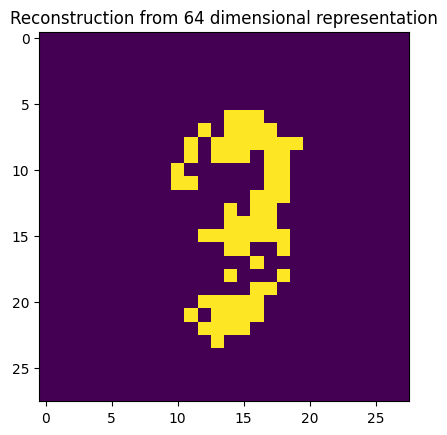

Epoch 6, Iteration 291 -- Loss: 0.118735
Epoch 6, Iteration 292 -- Loss: 0.120939
Epoch 6, Iteration 293 -- Loss: 0.117341
Epoch 6, Iteration 294 -- Loss: 0.122645
Epoch 6, Iteration 295 -- Loss: 0.123185
Epoch 6, Iteration 296 -- Loss: 0.116531
Epoch 6, Iteration 297 -- Loss: 0.117131
Epoch 6, Iteration 298 -- Loss: 0.121003
Epoch 6, Iteration 299 -- Loss: 0.120626
Epoch 6, Iteration 300 -- Loss: 0.122906


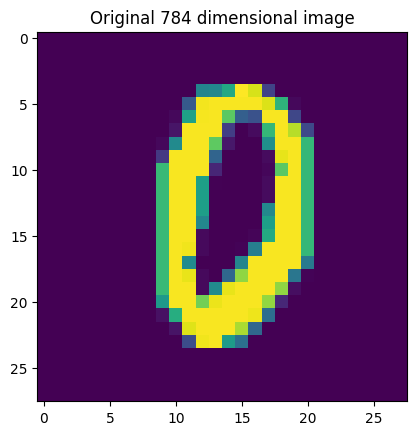

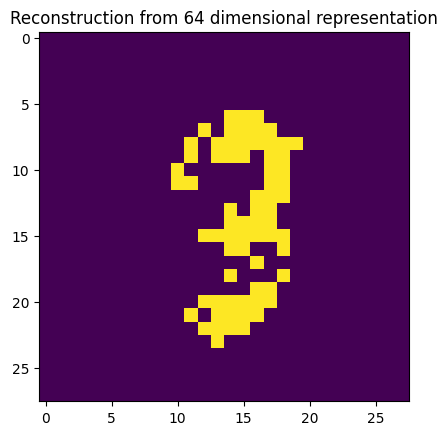

Epoch 6, Iteration 301 -- Loss: 0.118204
Epoch 6, Iteration 302 -- Loss: 0.125650
Epoch 6, Iteration 303 -- Loss: 0.124244
Epoch 6, Iteration 304 -- Loss: 0.118205
Epoch 6, Iteration 305 -- Loss: 0.118089
Epoch 6, Iteration 306 -- Loss: 0.118203
Epoch 6, Iteration 307 -- Loss: 0.113385
Epoch 6, Iteration 308 -- Loss: 0.119250
Epoch 6, Iteration 309 -- Loss: 0.124583
Epoch 6, Iteration 310 -- Loss: 0.120636


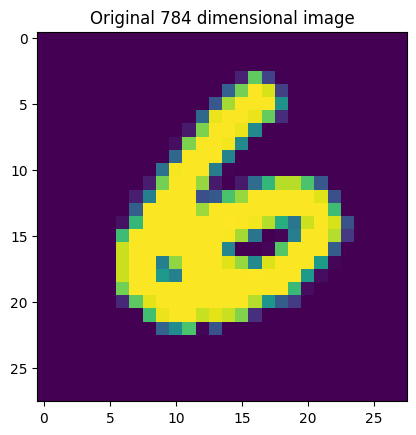

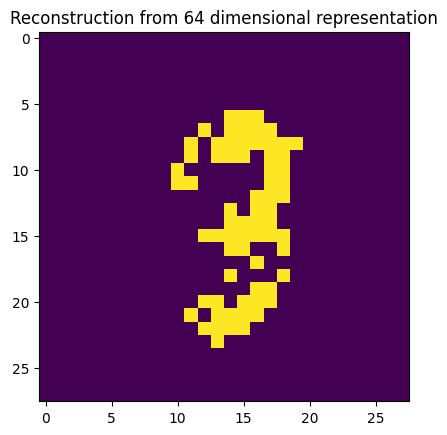

Epoch 6, Iteration 311 -- Loss: 0.120772
Epoch 6, Iteration 312 -- Loss: 0.124267
Epoch 6, Iteration 313 -- Loss: 0.118388
Epoch 6, Iteration 314 -- Loss: 0.118600
Epoch 6, Iteration 315 -- Loss: 0.115014
Epoch 6, Iteration 316 -- Loss: 0.120527
Epoch 6, Iteration 317 -- Loss: 0.121552
Epoch 6, Iteration 318 -- Loss: 0.120454
Epoch 6, Iteration 319 -- Loss: 0.116223
Epoch 6, Iteration 320 -- Loss: 0.115216


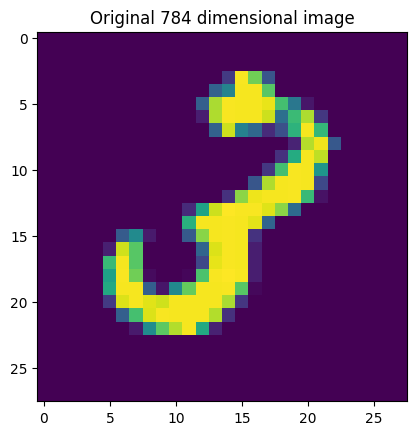

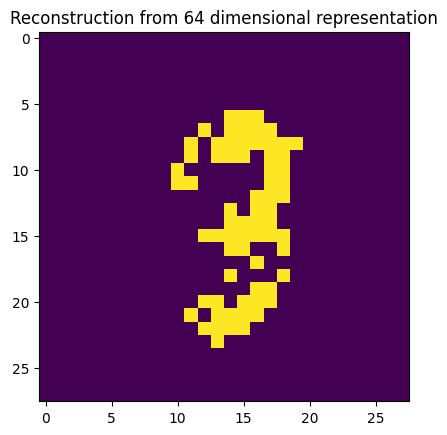

Epoch 6, Iteration 321 -- Loss: 0.120547
Epoch 6, Iteration 322 -- Loss: 0.118133
Epoch 6, Iteration 323 -- Loss: 0.118216
Epoch 6, Iteration 324 -- Loss: 0.119312
Epoch 6, Iteration 325 -- Loss: 0.123030
Epoch 6, Iteration 326 -- Loss: 0.120932
Epoch 6, Iteration 327 -- Loss: 0.118878
Epoch 6, Iteration 328 -- Loss: 0.119074
Epoch 6, Iteration 329 -- Loss: 0.120760
Epoch 6, Iteration 330 -- Loss: 0.119677


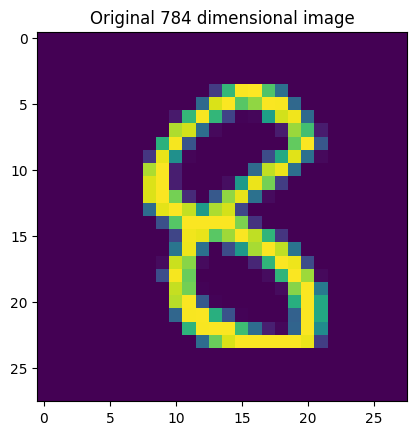

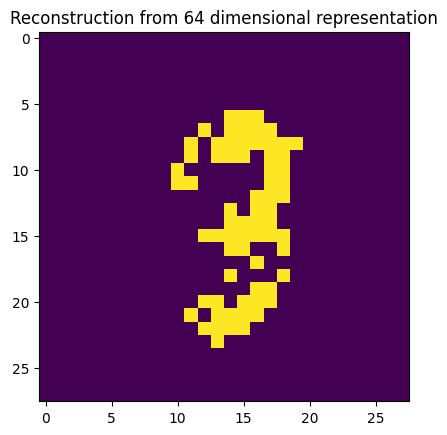

Epoch 6, Iteration 331 -- Loss: 0.121739
Epoch 6, Iteration 332 -- Loss: 0.115687
Epoch 6, Iteration 333 -- Loss: 0.118106
Epoch 6, Iteration 334 -- Loss: 0.118436
Epoch 6, Iteration 335 -- Loss: 0.120134
Epoch 6, Iteration 336 -- Loss: 0.121515
Epoch 6, Iteration 337 -- Loss: 0.122385
Epoch 6, Iteration 338 -- Loss: 0.120063
Epoch 6, Iteration 339 -- Loss: 0.116911
Epoch 6, Iteration 340 -- Loss: 0.120654


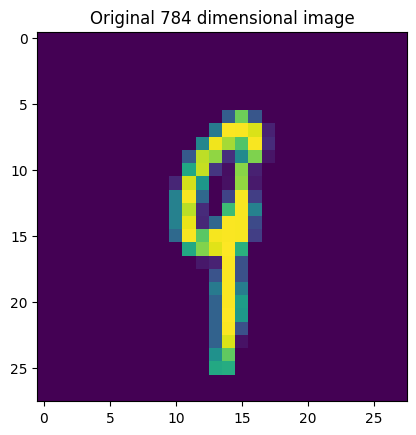

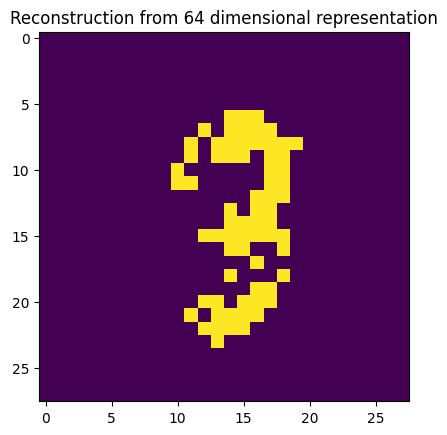

Epoch 6, Iteration 341 -- Loss: 0.116488
Epoch 6, Iteration 342 -- Loss: 0.117335
Epoch 6, Iteration 343 -- Loss: 0.118758
Epoch 6, Iteration 344 -- Loss: 0.119362
Epoch 6, Iteration 345 -- Loss: 0.117934
Epoch 6, Iteration 346 -- Loss: 0.117858
Epoch 6, Iteration 347 -- Loss: 0.119643
Epoch 7, Iteration 348 -- Loss: 0.119089


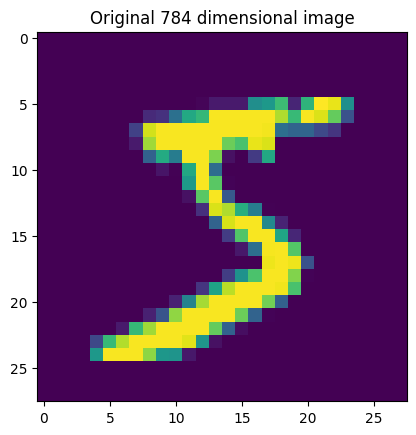

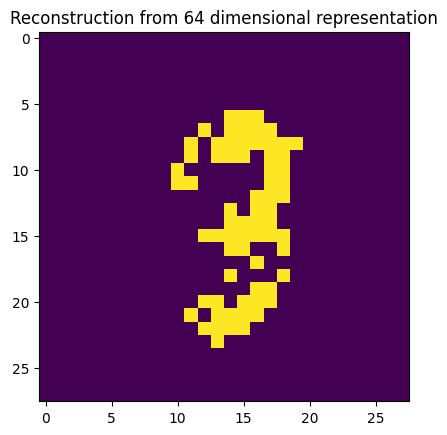

Epoch 7, Iteration 349 -- Loss: 0.118964
Epoch 7, Iteration 350 -- Loss: 0.121114
Epoch 7, Iteration 351 -- Loss: 0.117512
Epoch 7, Iteration 352 -- Loss: 0.122830
Epoch 7, Iteration 353 -- Loss: 0.123575
Epoch 7, Iteration 354 -- Loss: 0.116855
Epoch 7, Iteration 355 -- Loss: 0.117019
Epoch 7, Iteration 356 -- Loss: 0.121035
Epoch 7, Iteration 357 -- Loss: 0.120608
Epoch 7, Iteration 358 -- Loss: 0.122972


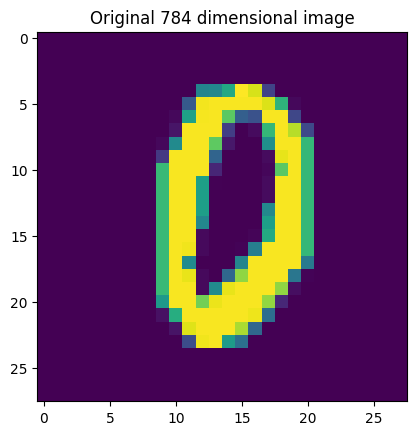

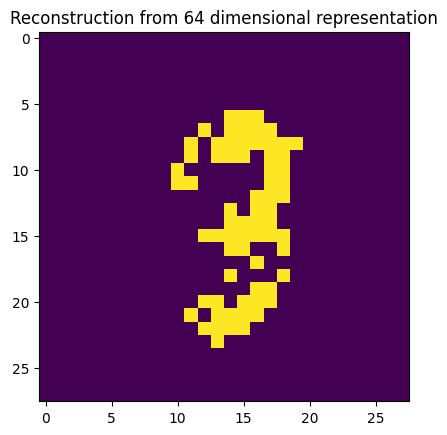

Epoch 7, Iteration 359 -- Loss: 0.118353
Epoch 7, Iteration 360 -- Loss: 0.125650
Epoch 7, Iteration 361 -- Loss: 0.124244
Epoch 7, Iteration 362 -- Loss: 0.118205
Epoch 7, Iteration 363 -- Loss: 0.118089
Epoch 7, Iteration 364 -- Loss: 0.118203
Epoch 7, Iteration 365 -- Loss: 0.113385
Epoch 7, Iteration 366 -- Loss: 0.119250
Epoch 7, Iteration 367 -- Loss: 0.124583
Epoch 7, Iteration 368 -- Loss: 0.120636


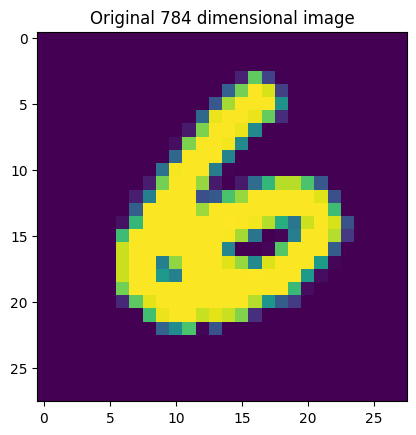

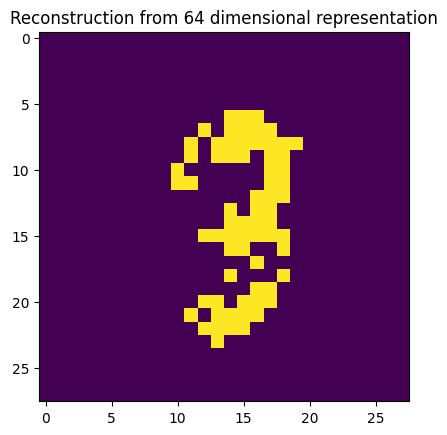

Epoch 7, Iteration 369 -- Loss: 0.120772
Epoch 7, Iteration 370 -- Loss: 0.124267
Epoch 7, Iteration 371 -- Loss: 0.118388
Epoch 7, Iteration 372 -- Loss: 0.118600
Epoch 7, Iteration 373 -- Loss: 0.115014
Epoch 7, Iteration 374 -- Loss: 0.120527
Epoch 7, Iteration 375 -- Loss: 0.121551
Epoch 7, Iteration 376 -- Loss: 0.120454
Epoch 7, Iteration 377 -- Loss: 0.116223
Epoch 7, Iteration 378 -- Loss: 0.115215


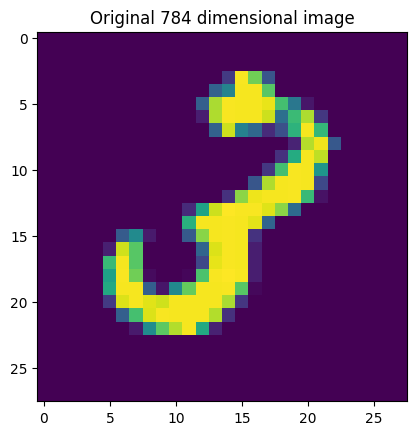

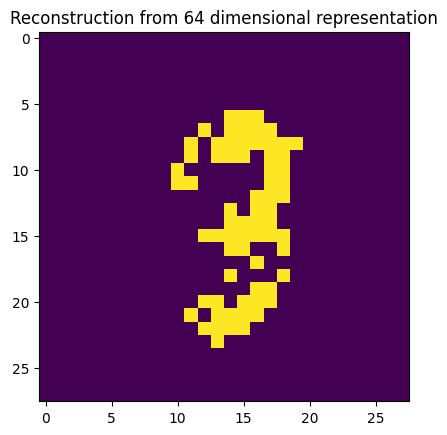

Epoch 7, Iteration 379 -- Loss: 0.120547
Epoch 7, Iteration 380 -- Loss: 0.118127
Epoch 7, Iteration 381 -- Loss: 0.118022
Epoch 7, Iteration 382 -- Loss: 0.119132
Epoch 7, Iteration 383 -- Loss: 0.122862
Epoch 7, Iteration 384 -- Loss: 0.120848
Epoch 7, Iteration 385 -- Loss: 0.118724
Epoch 7, Iteration 386 -- Loss: 0.118960
Epoch 7, Iteration 387 -- Loss: 0.120598
Epoch 7, Iteration 388 -- Loss: 0.119460


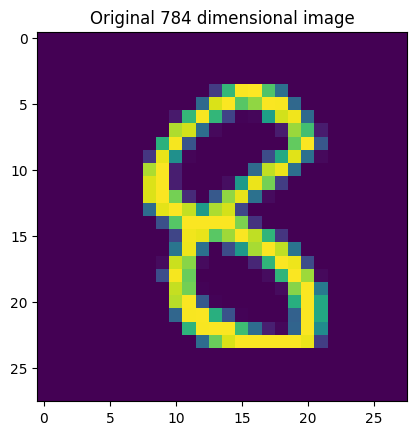

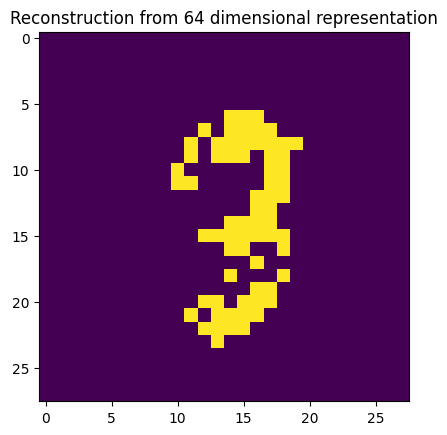

Epoch 7, Iteration 389 -- Loss: 0.121608
Epoch 7, Iteration 390 -- Loss: 0.115529
Epoch 7, Iteration 391 -- Loss: 0.117883
Epoch 7, Iteration 392 -- Loss: 0.118272
Epoch 7, Iteration 393 -- Loss: 0.119904
Epoch 7, Iteration 394 -- Loss: 0.121395
Epoch 7, Iteration 395 -- Loss: 0.122275
Epoch 7, Iteration 396 -- Loss: 0.119780
Epoch 7, Iteration 397 -- Loss: 0.116730
Epoch 7, Iteration 398 -- Loss: 0.120468


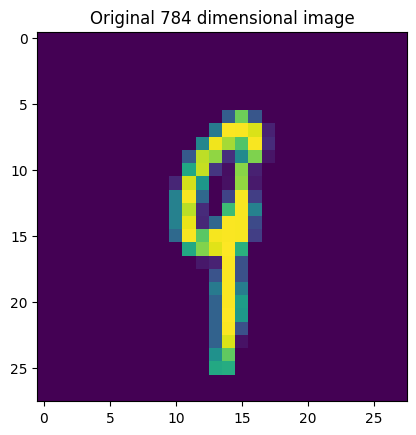

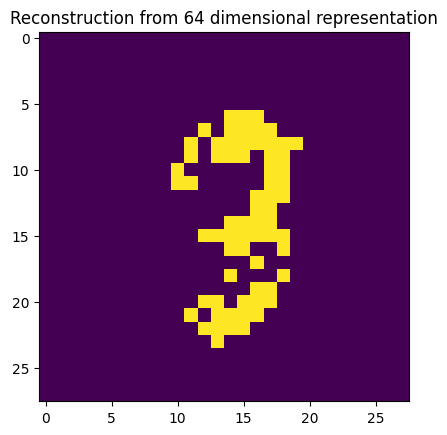

Epoch 7, Iteration 399 -- Loss: 0.116308
Epoch 7, Iteration 400 -- Loss: 0.117101
Epoch 7, Iteration 401 -- Loss: 0.118682
Epoch 7, Iteration 402 -- Loss: 0.119214
Epoch 7, Iteration 403 -- Loss: 0.117769
Epoch 7, Iteration 404 -- Loss: 0.117621
Epoch 7, Iteration 405 -- Loss: 0.119400
Epoch 8, Iteration 406 -- Loss: 0.118938


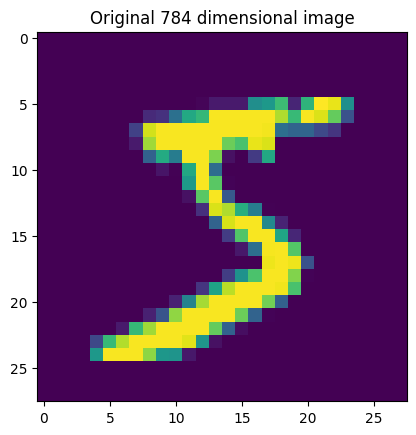

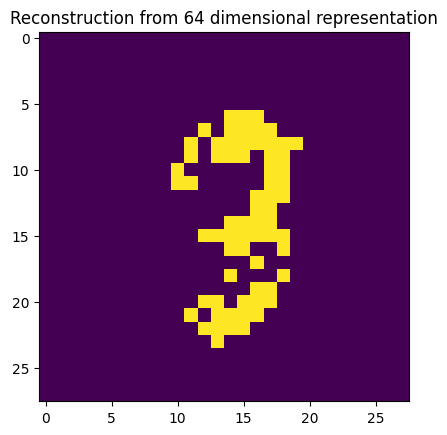

Epoch 8, Iteration 407 -- Loss: 0.118833
Epoch 8, Iteration 408 -- Loss: 0.120883
Epoch 8, Iteration 409 -- Loss: 0.117295
Epoch 8, Iteration 410 -- Loss: 0.122625
Epoch 8, Iteration 411 -- Loss: 0.123450
Epoch 8, Iteration 412 -- Loss: 0.116726
Epoch 8, Iteration 413 -- Loss: 0.116832
Epoch 8, Iteration 414 -- Loss: 0.120859
Epoch 8, Iteration 415 -- Loss: 0.120376
Epoch 8, Iteration 416 -- Loss: 0.122904


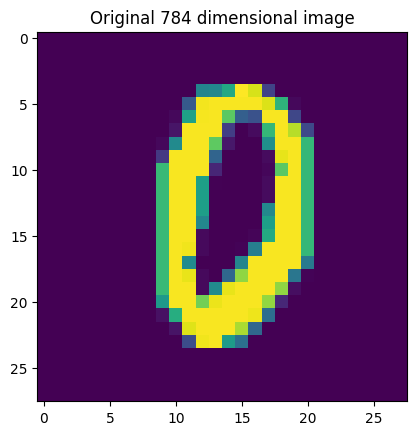

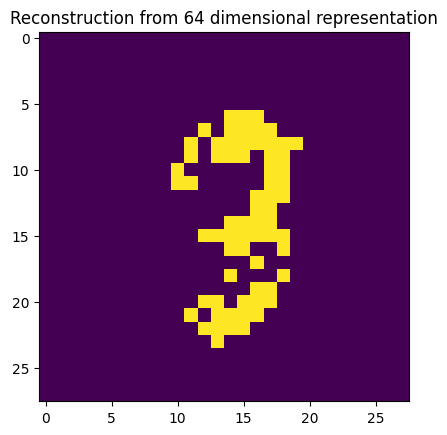

Epoch 8, Iteration 417 -- Loss: 0.118198
Epoch 8, Iteration 418 -- Loss: 0.125550
Epoch 8, Iteration 419 -- Loss: 0.124116
Epoch 8, Iteration 420 -- Loss: 0.118077
Epoch 8, Iteration 421 -- Loss: 0.117927
Epoch 8, Iteration 422 -- Loss: 0.118034
Epoch 8, Iteration 423 -- Loss: 0.113256
Epoch 8, Iteration 424 -- Loss: 0.119068
Epoch 8, Iteration 425 -- Loss: 0.124505
Epoch 8, Iteration 426 -- Loss: 0.120475


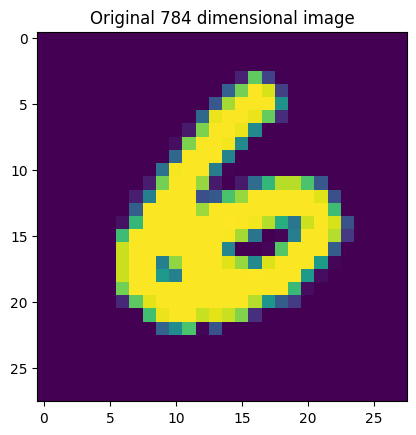

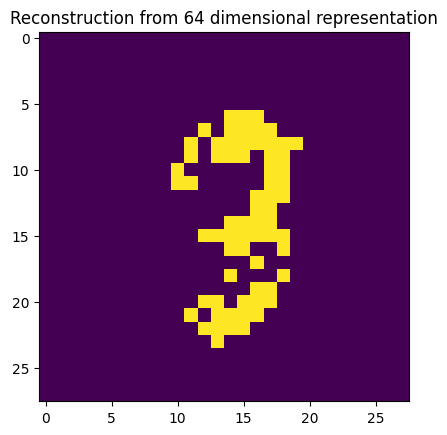

Epoch 8, Iteration 427 -- Loss: 0.120605
Epoch 8, Iteration 428 -- Loss: 0.124136
Epoch 8, Iteration 429 -- Loss: 0.118207
Epoch 8, Iteration 430 -- Loss: 0.118466
Epoch 8, Iteration 431 -- Loss: 0.114816
Epoch 8, Iteration 432 -- Loss: 0.120422
Epoch 8, Iteration 433 -- Loss: 0.121500
Epoch 8, Iteration 434 -- Loss: 0.120323
Epoch 8, Iteration 435 -- Loss: 0.116032
Epoch 8, Iteration 436 -- Loss: 0.114999


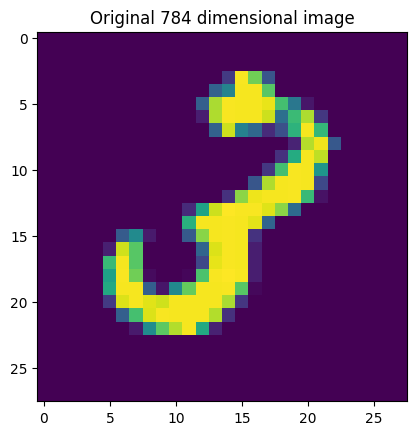

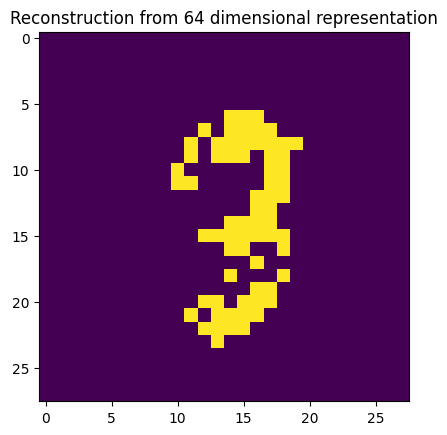

Epoch 8, Iteration 437 -- Loss: 0.120447
Epoch 8, Iteration 438 -- Loss: 0.117976
Epoch 8, Iteration 439 -- Loss: 0.118022
Epoch 8, Iteration 440 -- Loss: 0.119132
Epoch 8, Iteration 441 -- Loss: 0.122862
Epoch 8, Iteration 442 -- Loss: 0.120848
Epoch 8, Iteration 443 -- Loss: 0.118724
Epoch 8, Iteration 444 -- Loss: 0.118960
Epoch 8, Iteration 445 -- Loss: 0.120598
Epoch 8, Iteration 446 -- Loss: 0.119460


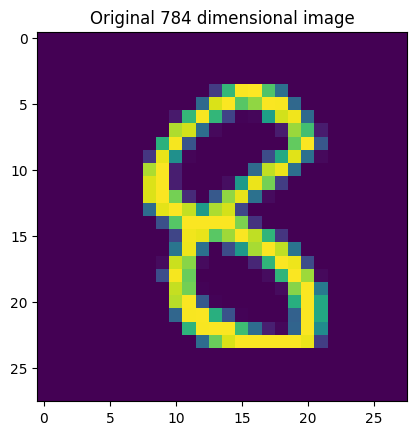

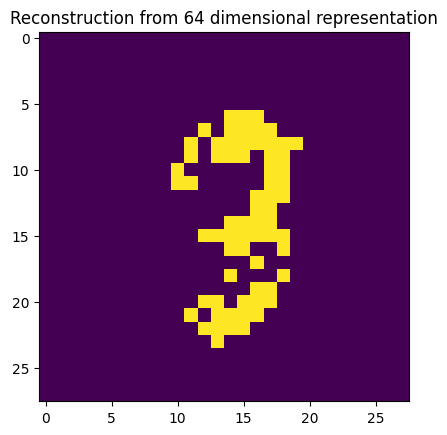

Epoch 8, Iteration 447 -- Loss: 0.121608
Epoch 8, Iteration 448 -- Loss: 0.115529
Epoch 8, Iteration 449 -- Loss: 0.117883
Epoch 8, Iteration 450 -- Loss: 0.118272
Epoch 8, Iteration 451 -- Loss: 0.119904
Epoch 8, Iteration 452 -- Loss: 0.121395
Epoch 8, Iteration 453 -- Loss: 0.122275
Epoch 8, Iteration 454 -- Loss: 0.119780
Epoch 8, Iteration 455 -- Loss: 0.116730
Epoch 8, Iteration 456 -- Loss: 0.120468


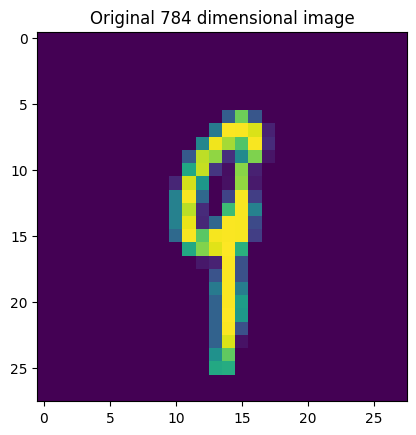

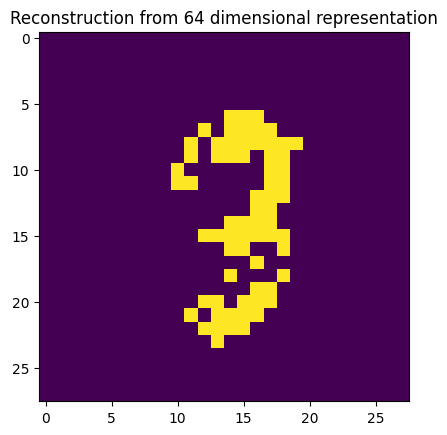

Epoch 8, Iteration 457 -- Loss: 0.116308
Epoch 8, Iteration 458 -- Loss: 0.117101
Epoch 8, Iteration 459 -- Loss: 0.118682
Epoch 8, Iteration 460 -- Loss: 0.119214
Epoch 8, Iteration 461 -- Loss: 0.117769
Epoch 8, Iteration 462 -- Loss: 0.117621
Epoch 8, Iteration 463 -- Loss: 0.119400
Epoch 9, Iteration 464 -- Loss: 0.118938


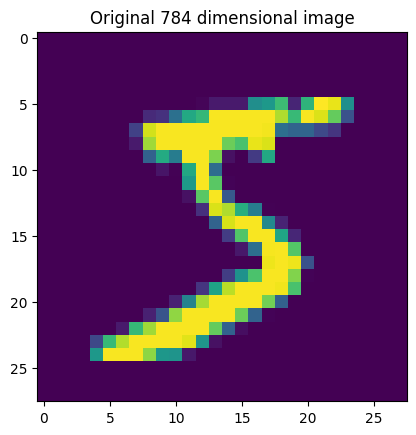

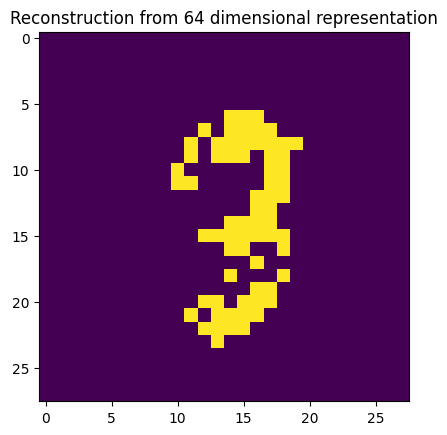

Epoch 9, Iteration 465 -- Loss: 0.118833
Epoch 9, Iteration 466 -- Loss: 0.120883
Epoch 9, Iteration 467 -- Loss: 0.117295
Epoch 9, Iteration 468 -- Loss: 0.122625
Epoch 9, Iteration 469 -- Loss: 0.123450
Epoch 9, Iteration 470 -- Loss: 0.116726
Epoch 9, Iteration 471 -- Loss: 0.116832
Epoch 9, Iteration 472 -- Loss: 0.120857
Epoch 9, Iteration 473 -- Loss: 0.120717
Epoch 9, Iteration 474 -- Loss: 0.123089


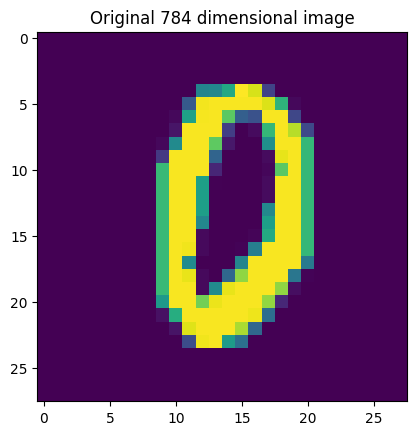

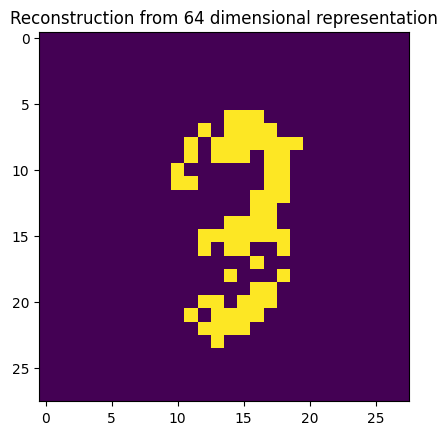

Epoch 9, Iteration 475 -- Loss: 0.118383
Epoch 9, Iteration 476 -- Loss: 0.125734
Epoch 9, Iteration 477 -- Loss: 0.124260
Epoch 9, Iteration 478 -- Loss: 0.118441
Epoch 9, Iteration 479 -- Loss: 0.118214
Epoch 9, Iteration 480 -- Loss: 0.118350
Epoch 9, Iteration 481 -- Loss: 0.113538
Epoch 9, Iteration 482 -- Loss: 0.119338
Epoch 9, Iteration 483 -- Loss: 0.124731
Epoch 9, Iteration 484 -- Loss: 0.120746


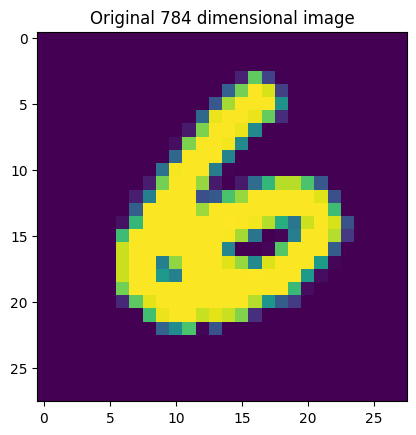

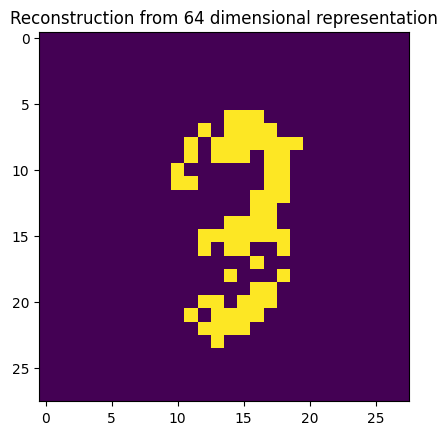

Epoch 9, Iteration 485 -- Loss: 0.120897
Epoch 9, Iteration 486 -- Loss: 0.124265
Epoch 9, Iteration 487 -- Loss: 0.118473
Epoch 9, Iteration 488 -- Loss: 0.118672
Epoch 9, Iteration 489 -- Loss: 0.115167
Epoch 9, Iteration 490 -- Loss: 0.120759
Epoch 9, Iteration 491 -- Loss: 0.121716
Epoch 9, Iteration 492 -- Loss: 0.120533
Epoch 9, Iteration 493 -- Loss: 0.116322
Epoch 9, Iteration 494 -- Loss: 0.115347


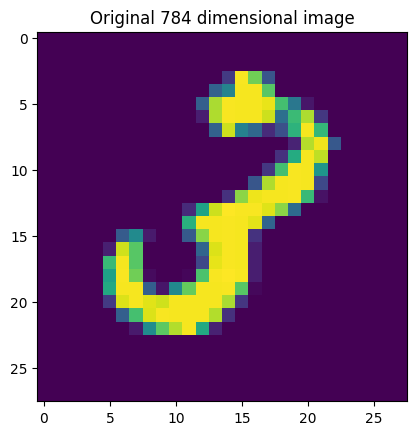

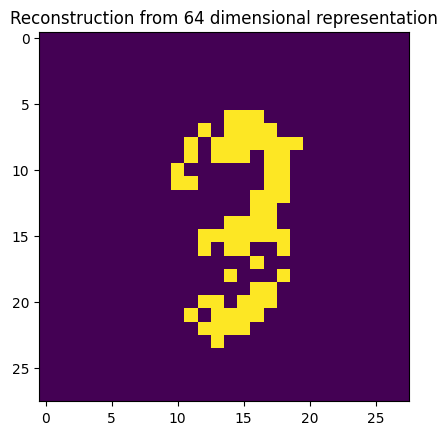

Epoch 9, Iteration 495 -- Loss: 0.120714
Epoch 9, Iteration 496 -- Loss: 0.118297
Epoch 9, Iteration 497 -- Loss: 0.118274
Epoch 9, Iteration 498 -- Loss: 0.119352
Epoch 9, Iteration 499 -- Loss: 0.123130
Epoch 9, Iteration 500 -- Loss: 0.121061
Epoch 9, Iteration 501 -- Loss: 0.118973
Epoch 9, Iteration 502 -- Loss: 0.119217
Epoch 9, Iteration 503 -- Loss: 0.120897
Epoch 9, Iteration 504 -- Loss: 0.119709


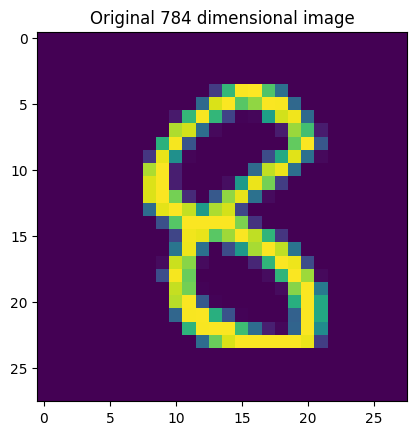

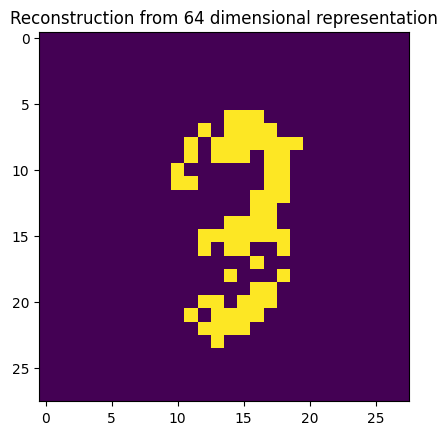

Epoch 9, Iteration 505 -- Loss: 0.121886
Epoch 9, Iteration 506 -- Loss: 0.115740
Epoch 9, Iteration 507 -- Loss: 0.118247
Epoch 9, Iteration 508 -- Loss: 0.118647
Epoch 9, Iteration 509 -- Loss: 0.120174
Epoch 9, Iteration 510 -- Loss: 0.121650
Epoch 9, Iteration 511 -- Loss: 0.122465
Epoch 9, Iteration 512 -- Loss: 0.120110
Epoch 9, Iteration 513 -- Loss: 0.117045
Epoch 9, Iteration 514 -- Loss: 0.120748


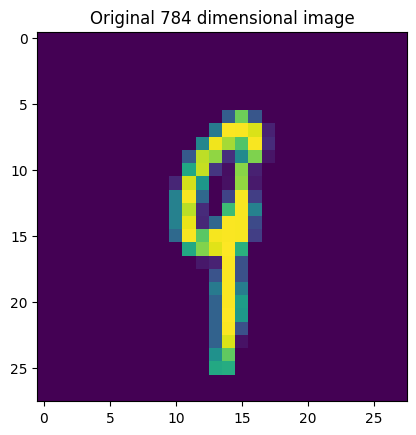

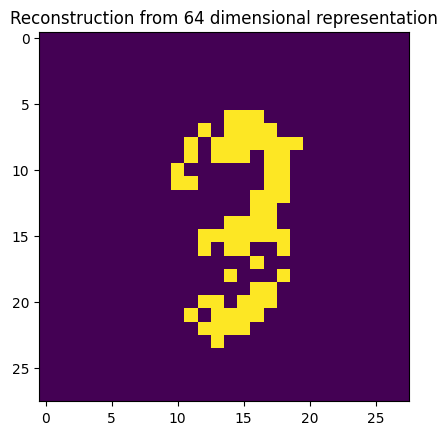

Epoch 9, Iteration 515 -- Loss: 0.116523
Epoch 9, Iteration 516 -- Loss: 0.117399
Epoch 9, Iteration 517 -- Loss: 0.118925
Epoch 9, Iteration 518 -- Loss: 0.119379
Epoch 9, Iteration 519 -- Loss: 0.118126
Epoch 9, Iteration 520 -- Loss: 0.117999
Epoch 9, Iteration 521 -- Loss: 0.119695
Epoch 10, Iteration 522 -- Loss: 0.119233


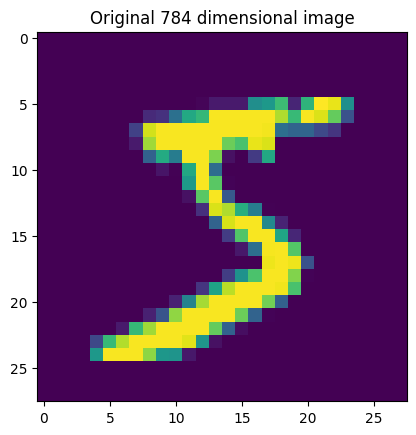

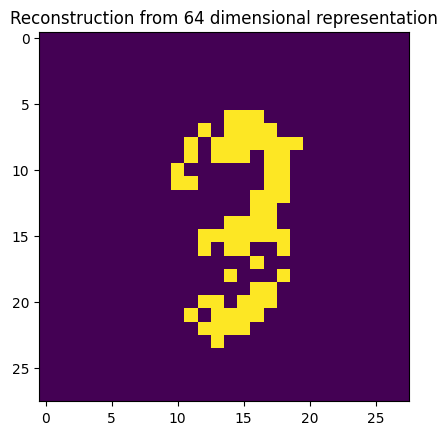

Epoch 10, Iteration 523 -- Loss: 0.118998
Epoch 10, Iteration 524 -- Loss: 0.121122
Epoch 10, Iteration 525 -- Loss: 0.117529
Epoch 10, Iteration 526 -- Loss: 0.122878
Epoch 10, Iteration 527 -- Loss: 0.123718
Epoch 10, Iteration 528 -- Loss: 0.116965
Epoch 10, Iteration 529 -- Loss: 0.117147
Epoch 10, Iteration 530 -- Loss: 0.121088
Epoch 10, Iteration 531 -- Loss: 0.120717
Epoch 10, Iteration 532 -- Loss: 0.123089


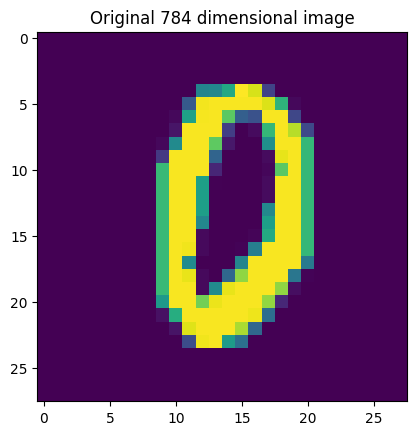

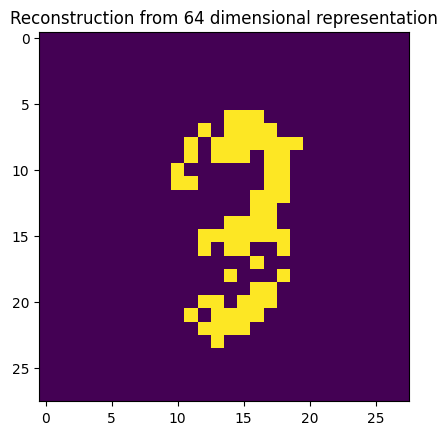

Epoch 10, Iteration 533 -- Loss: 0.118383
Epoch 10, Iteration 534 -- Loss: 0.125734
Epoch 10, Iteration 535 -- Loss: 0.124260
Epoch 10, Iteration 536 -- Loss: 0.118441
Epoch 10, Iteration 537 -- Loss: 0.118214
Epoch 10, Iteration 538 -- Loss: 0.118350
Epoch 10, Iteration 539 -- Loss: 0.113538
Epoch 10, Iteration 540 -- Loss: 0.119338
Epoch 10, Iteration 541 -- Loss: 0.124731
Epoch 10, Iteration 542 -- Loss: 0.120746


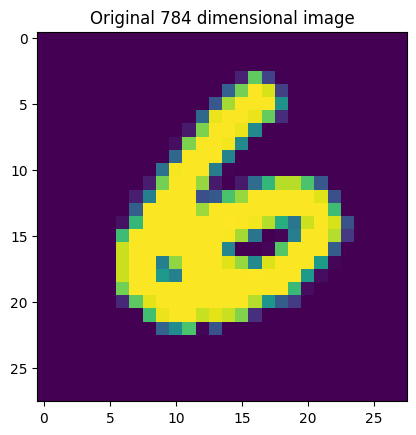

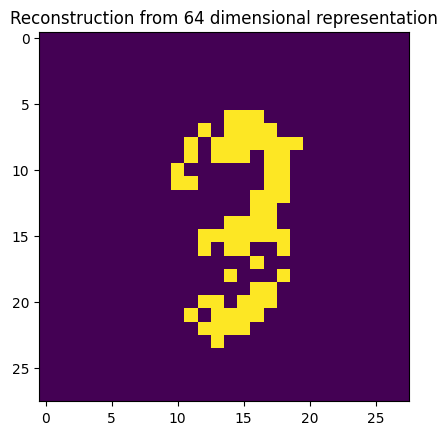

Epoch 10, Iteration 543 -- Loss: 0.120897
Epoch 10, Iteration 544 -- Loss: 0.124265
Epoch 10, Iteration 545 -- Loss: 0.118473
Epoch 10, Iteration 546 -- Loss: 0.118672
Epoch 10, Iteration 547 -- Loss: 0.115167
Epoch 10, Iteration 548 -- Loss: 0.120759
Epoch 10, Iteration 549 -- Loss: 0.121716
Epoch 10, Iteration 550 -- Loss: 0.120533
Epoch 10, Iteration 551 -- Loss: 0.116322
Epoch 10, Iteration 552 -- Loss: 0.115347


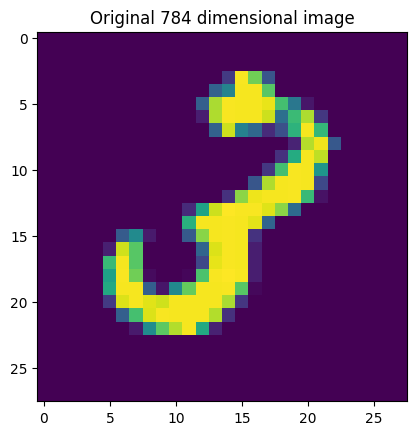

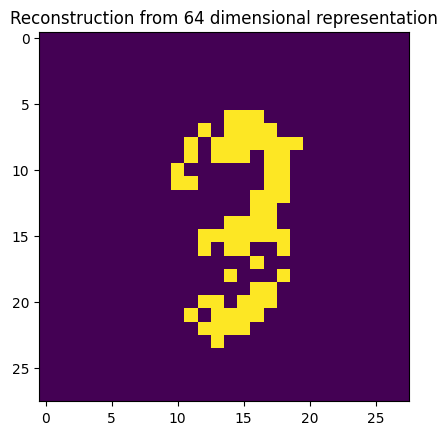

Epoch 10, Iteration 553 -- Loss: 0.120714
Epoch 10, Iteration 554 -- Loss: 0.118297
Epoch 10, Iteration 555 -- Loss: 0.118274
Epoch 10, Iteration 556 -- Loss: 0.119352
Epoch 10, Iteration 557 -- Loss: 0.123130
Epoch 10, Iteration 558 -- Loss: 0.121061
Epoch 10, Iteration 559 -- Loss: 0.118973
Epoch 10, Iteration 560 -- Loss: 0.119217
Epoch 10, Iteration 561 -- Loss: 0.120897
Epoch 10, Iteration 562 -- Loss: 0.119709


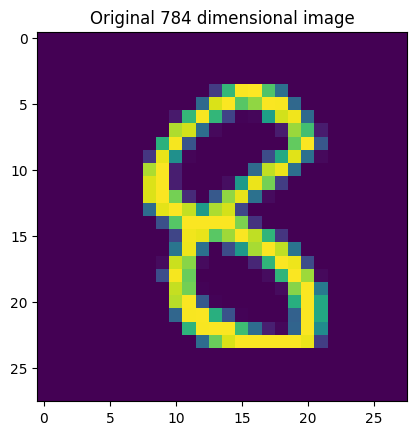

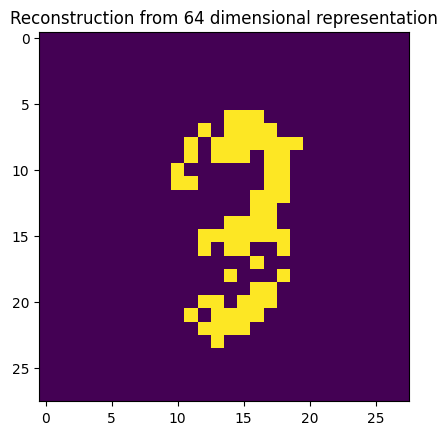

Epoch 10, Iteration 563 -- Loss: 0.121886
Epoch 10, Iteration 564 -- Loss: 0.115740
Epoch 10, Iteration 565 -- Loss: 0.118247
Epoch 10, Iteration 566 -- Loss: 0.118647
Epoch 10, Iteration 567 -- Loss: 0.120174
Epoch 10, Iteration 568 -- Loss: 0.121650
Epoch 10, Iteration 569 -- Loss: 0.122465
Epoch 10, Iteration 570 -- Loss: 0.120110
Epoch 10, Iteration 571 -- Loss: 0.117045
Epoch 10, Iteration 572 -- Loss: 0.120746


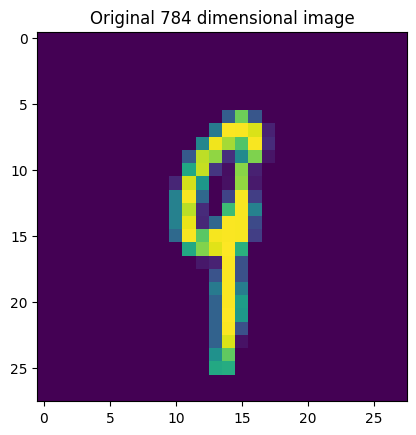

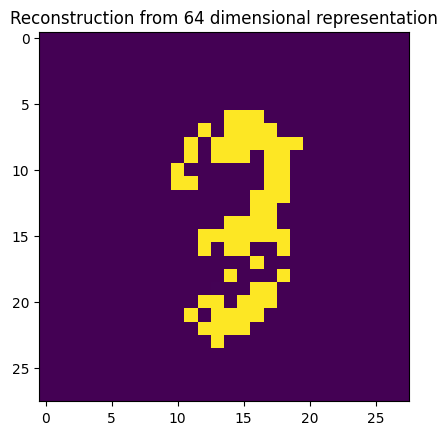

Epoch 10, Iteration 573 -- Loss: 0.116735
Epoch 10, Iteration 574 -- Loss: 0.117742
Epoch 10, Iteration 575 -- Loss: 0.119234
Epoch 10, Iteration 576 -- Loss: 0.119670
Epoch 10, Iteration 577 -- Loss: 0.118551
Epoch 10, Iteration 578 -- Loss: 0.118292
Epoch 10, Iteration 579 -- Loss: 0.119955
Epoch 11, Iteration 580 -- Loss: 0.119431


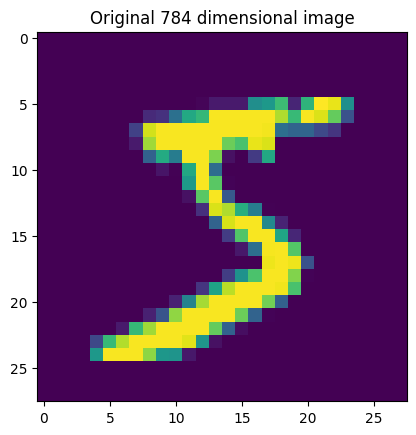

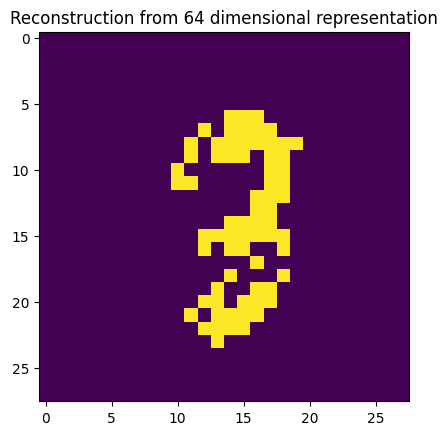

Epoch 11, Iteration 581 -- Loss: 0.119209
Epoch 11, Iteration 582 -- Loss: 0.121336
Epoch 11, Iteration 583 -- Loss: 0.117801
Epoch 11, Iteration 584 -- Loss: 0.123189
Epoch 11, Iteration 585 -- Loss: 0.124139
Epoch 11, Iteration 586 -- Loss: 0.117507
Epoch 11, Iteration 587 -- Loss: 0.117720
Epoch 11, Iteration 588 -- Loss: 0.121457
Epoch 11, Iteration 589 -- Loss: 0.121306
Epoch 11, Iteration 590 -- Loss: 0.123490


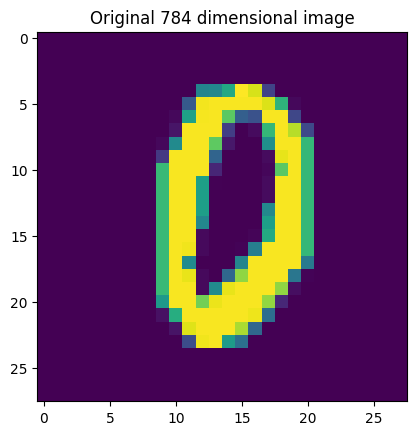

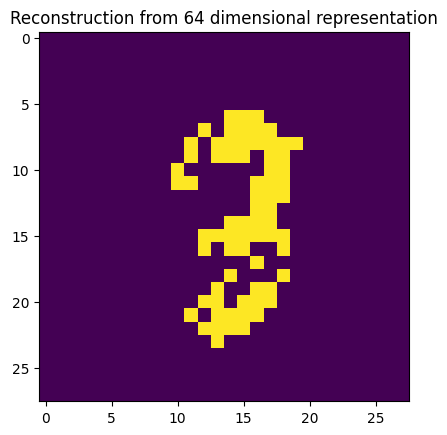

Epoch 11, Iteration 591 -- Loss: 0.118799
Epoch 11, Iteration 592 -- Loss: 0.126162
Epoch 11, Iteration 593 -- Loss: 0.124793
Epoch 11, Iteration 594 -- Loss: 0.119094
Epoch 11, Iteration 595 -- Loss: 0.118701
Epoch 11, Iteration 596 -- Loss: 0.118970
Epoch 11, Iteration 597 -- Loss: 0.114104
Epoch 11, Iteration 598 -- Loss: 0.119934
Epoch 11, Iteration 599 -- Loss: 0.125328
Epoch 11, Iteration 600 -- Loss: 0.121211


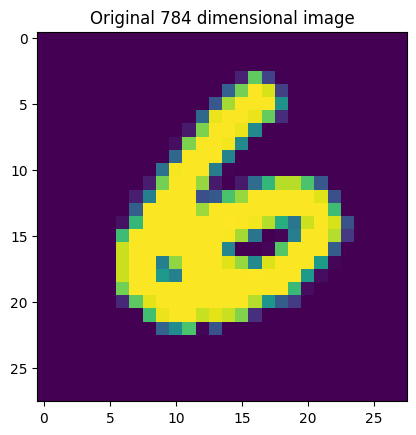

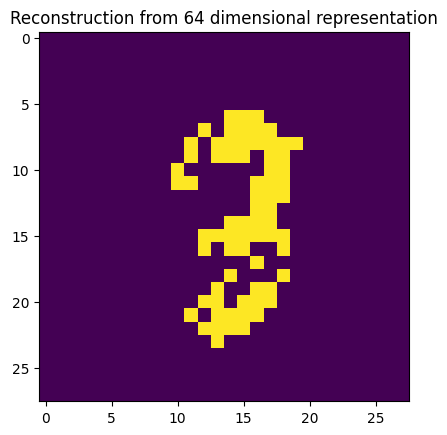

Epoch 11, Iteration 601 -- Loss: 0.121459
Epoch 11, Iteration 602 -- Loss: 0.124666
Epoch 11, Iteration 603 -- Loss: 0.119011
Epoch 11, Iteration 604 -- Loss: 0.119138
Epoch 11, Iteration 605 -- Loss: 0.115958
Epoch 11, Iteration 606 -- Loss: 0.121460
Epoch 11, Iteration 607 -- Loss: 0.122159
Epoch 11, Iteration 608 -- Loss: 0.121081
Epoch 11, Iteration 609 -- Loss: 0.116950
Epoch 11, Iteration 610 -- Loss: 0.116045


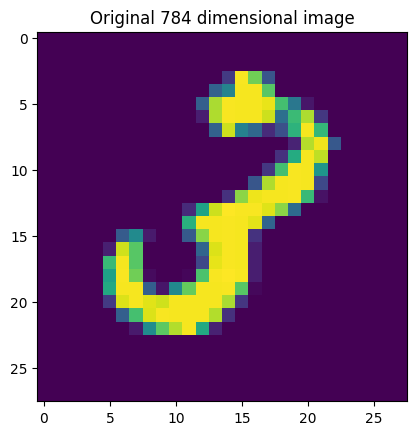

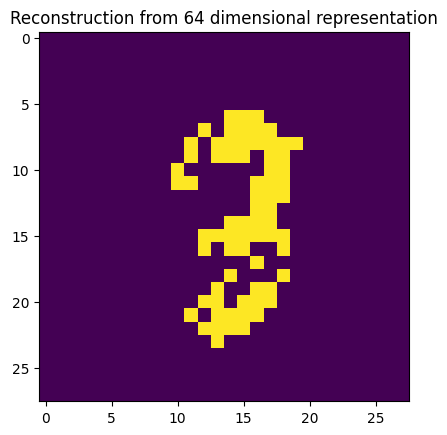

Epoch 11, Iteration 611 -- Loss: 0.121247
Epoch 11, Iteration 612 -- Loss: 0.118981
Epoch 11, Iteration 613 -- Loss: 0.118805
Epoch 11, Iteration 614 -- Loss: 0.119893
Epoch 11, Iteration 615 -- Loss: 0.123718
Epoch 11, Iteration 616 -- Loss: 0.121525
Epoch 11, Iteration 617 -- Loss: 0.119536
Epoch 11, Iteration 618 -- Loss: 0.119653
Epoch 11, Iteration 619 -- Loss: 0.121332
Epoch 11, Iteration 620 -- Loss: 0.120296


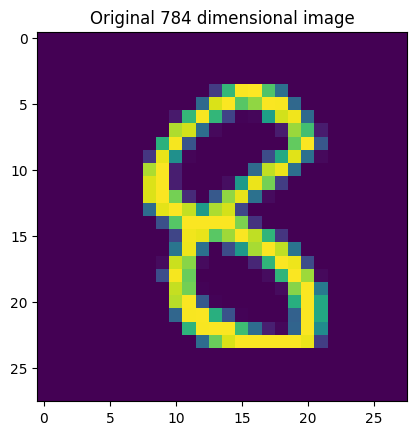

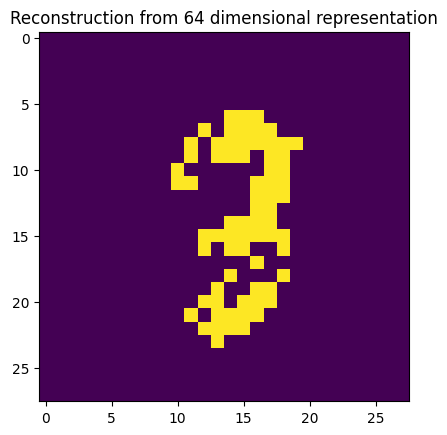

Epoch 11, Iteration 621 -- Loss: 0.122373
Epoch 11, Iteration 622 -- Loss: 0.116254
Epoch 11, Iteration 623 -- Loss: 0.118955
Epoch 11, Iteration 624 -- Loss: 0.119424
Epoch 11, Iteration 625 -- Loss: 0.120807
Epoch 11, Iteration 626 -- Loss: 0.121985
Epoch 11, Iteration 627 -- Loss: 0.123048
Epoch 11, Iteration 628 -- Loss: 0.120678
Epoch 11, Iteration 629 -- Loss: 0.117663
Epoch 11, Iteration 630 -- Loss: 0.121412


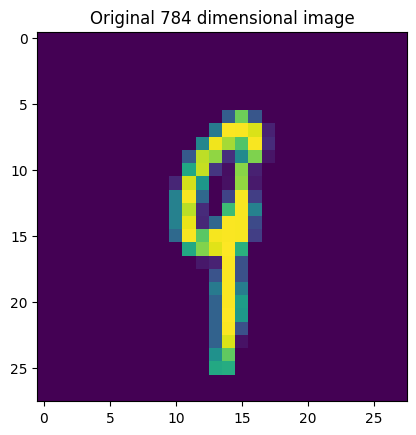

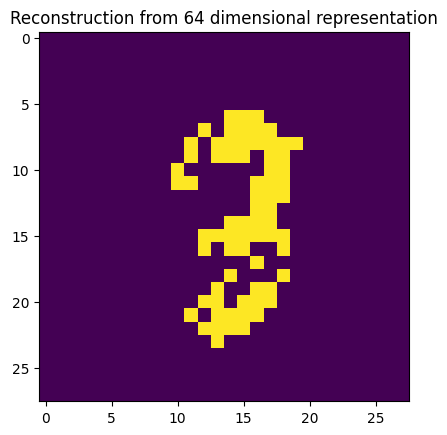

Epoch 11, Iteration 631 -- Loss: 0.117107
Epoch 11, Iteration 632 -- Loss: 0.118123
Epoch 11, Iteration 633 -- Loss: 0.119534
Epoch 11, Iteration 634 -- Loss: 0.120005
Epoch 11, Iteration 635 -- Loss: 0.118936
Epoch 11, Iteration 636 -- Loss: 0.118600
Epoch 11, Iteration 637 -- Loss: 0.120338
Epoch 12, Iteration 638 -- Loss: 0.119803


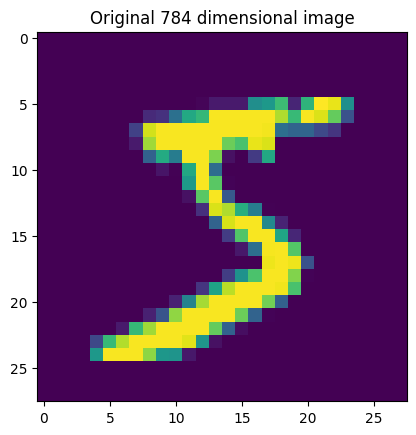

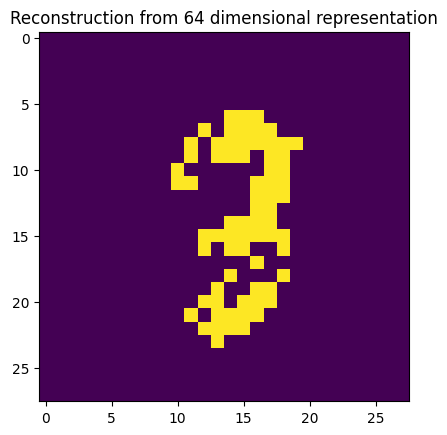

Epoch 12, Iteration 639 -- Loss: 0.119466
Epoch 12, Iteration 640 -- Loss: 0.121757
Epoch 12, Iteration 641 -- Loss: 0.118124
Epoch 12, Iteration 642 -- Loss: 0.123511
Epoch 12, Iteration 643 -- Loss: 0.124139
Epoch 12, Iteration 644 -- Loss: 0.117507
Epoch 12, Iteration 645 -- Loss: 0.117720
Epoch 12, Iteration 646 -- Loss: 0.121457
Epoch 12, Iteration 647 -- Loss: 0.121306
Epoch 12, Iteration 648 -- Loss: 0.123490


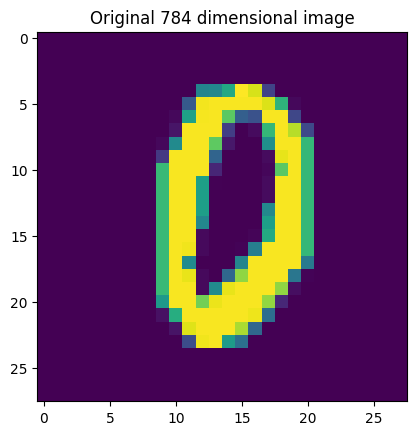

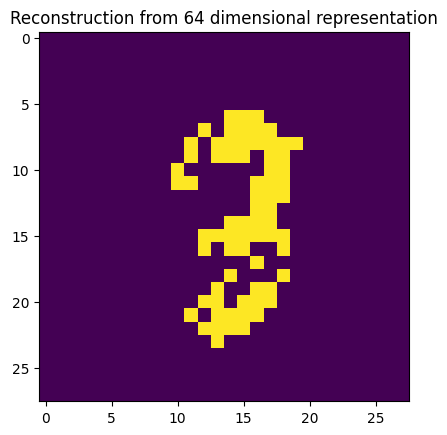

Epoch 12, Iteration 649 -- Loss: 0.118799
Epoch 12, Iteration 650 -- Loss: 0.126162
Epoch 12, Iteration 651 -- Loss: 0.124793
Epoch 12, Iteration 652 -- Loss: 0.119094
Epoch 12, Iteration 653 -- Loss: 0.118701
Epoch 12, Iteration 654 -- Loss: 0.118970
Epoch 12, Iteration 655 -- Loss: 0.114104
Epoch 12, Iteration 656 -- Loss: 0.119934
Epoch 12, Iteration 657 -- Loss: 0.125328
Epoch 12, Iteration 658 -- Loss: 0.121211


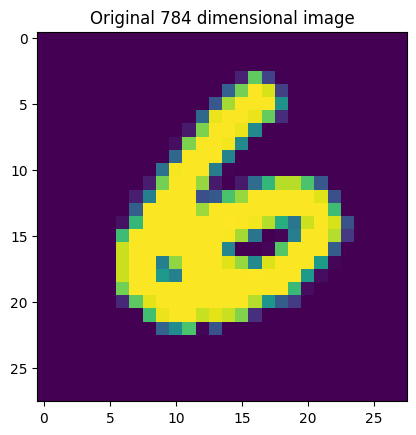

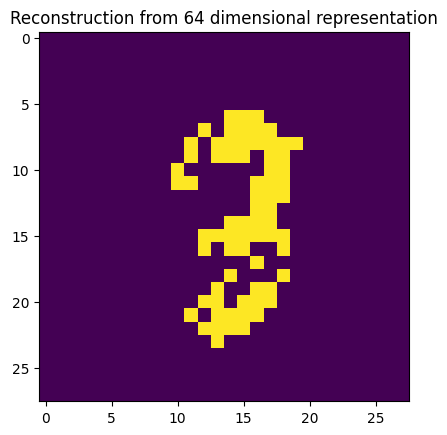

Epoch 12, Iteration 659 -- Loss: 0.121459
Epoch 12, Iteration 660 -- Loss: 0.124666
Epoch 12, Iteration 661 -- Loss: 0.119011
Epoch 12, Iteration 662 -- Loss: 0.119138
Epoch 12, Iteration 663 -- Loss: 0.115958
Epoch 12, Iteration 664 -- Loss: 0.121460
Epoch 12, Iteration 665 -- Loss: 0.122159
Epoch 12, Iteration 666 -- Loss: 0.121081
Epoch 12, Iteration 667 -- Loss: 0.116950
Epoch 12, Iteration 668 -- Loss: 0.116045


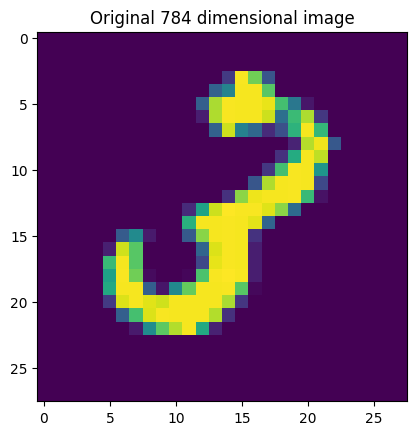

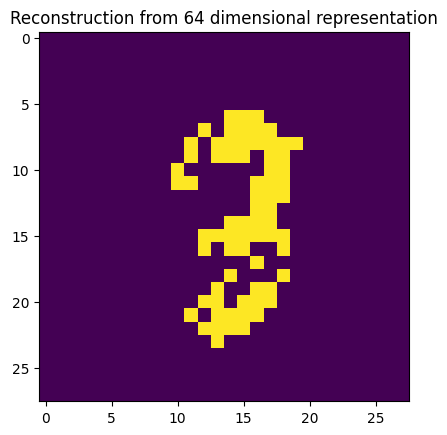

Epoch 12, Iteration 669 -- Loss: 0.121247
Epoch 12, Iteration 670 -- Loss: 0.118981
Epoch 12, Iteration 671 -- Loss: 0.118805
Epoch 12, Iteration 672 -- Loss: 0.119893
Epoch 12, Iteration 673 -- Loss: 0.123718
Epoch 12, Iteration 674 -- Loss: 0.121525
Epoch 12, Iteration 675 -- Loss: 0.119536
Epoch 12, Iteration 676 -- Loss: 0.119653
Epoch 12, Iteration 677 -- Loss: 0.121332
Epoch 12, Iteration 678 -- Loss: 0.120296


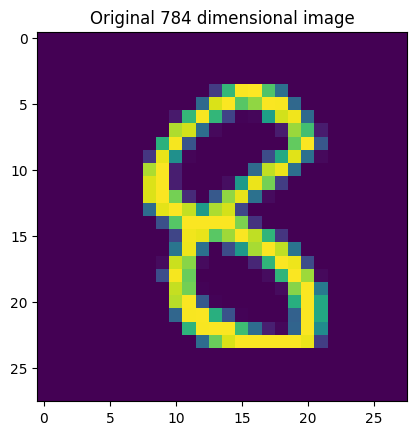

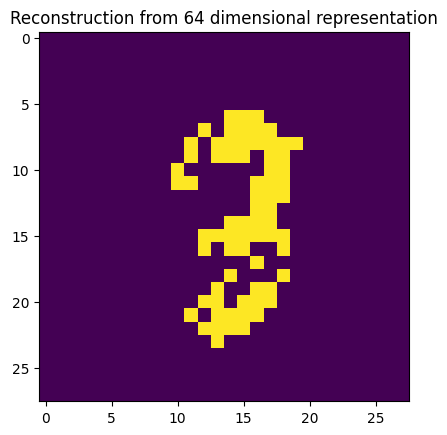

Epoch 12, Iteration 679 -- Loss: 0.122373
Epoch 12, Iteration 680 -- Loss: 0.116254
Epoch 12, Iteration 681 -- Loss: 0.118955
Epoch 12, Iteration 682 -- Loss: 0.119424
Epoch 12, Iteration 683 -- Loss: 0.120807
Epoch 12, Iteration 684 -- Loss: 0.121985
Epoch 12, Iteration 685 -- Loss: 0.123048
Epoch 12, Iteration 686 -- Loss: 0.120678
Epoch 12, Iteration 687 -- Loss: 0.117663
Epoch 12, Iteration 688 -- Loss: 0.121412


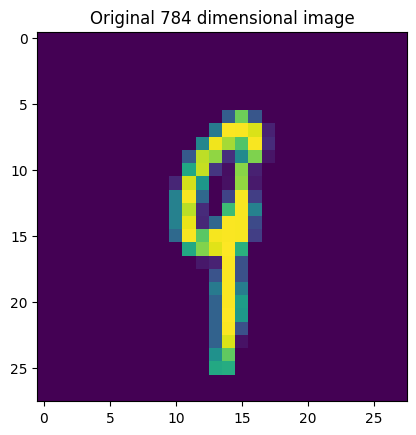

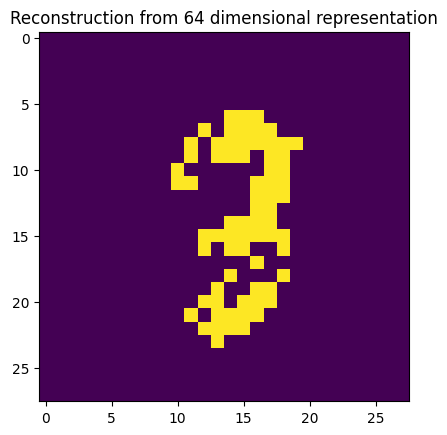

Epoch 12, Iteration 689 -- Loss: 0.117107
Epoch 12, Iteration 690 -- Loss: 0.118123
Epoch 12, Iteration 691 -- Loss: 0.119534
Epoch 12, Iteration 692 -- Loss: 0.120005
Epoch 12, Iteration 693 -- Loss: 0.118936
Epoch 12, Iteration 694 -- Loss: 0.118600
Epoch 12, Iteration 695 -- Loss: 0.120338
Epoch 13, Iteration 696 -- Loss: 0.119803


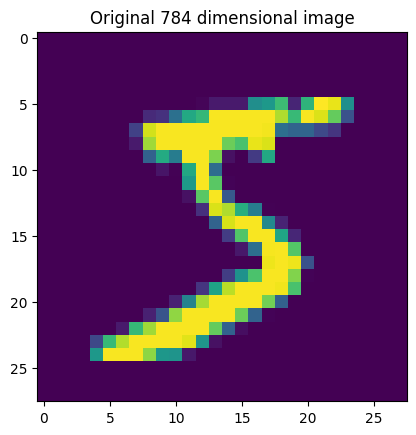

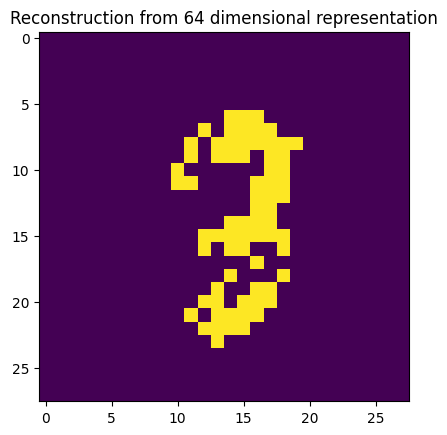

Epoch 13, Iteration 697 -- Loss: 0.119466
Epoch 13, Iteration 698 -- Loss: 0.121757
Epoch 13, Iteration 699 -- Loss: 0.118124
Epoch 13, Iteration 700 -- Loss: 0.123511
Epoch 13, Iteration 701 -- Loss: 0.124139
Epoch 13, Iteration 702 -- Loss: 0.117507
Epoch 13, Iteration 703 -- Loss: 0.117720
Epoch 13, Iteration 704 -- Loss: 0.121457
Epoch 13, Iteration 705 -- Loss: 0.121306
Epoch 13, Iteration 706 -- Loss: 0.123490


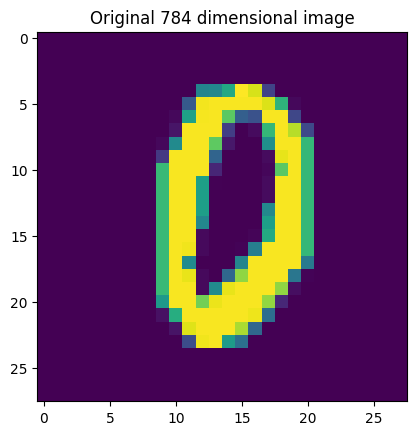

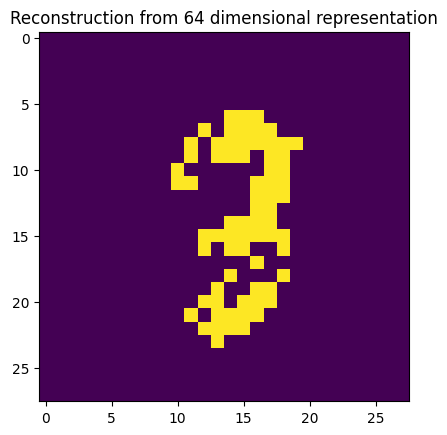

Epoch 13, Iteration 707 -- Loss: 0.118799
Epoch 13, Iteration 708 -- Loss: 0.126162
Epoch 13, Iteration 709 -- Loss: 0.124793
Epoch 13, Iteration 710 -- Loss: 0.119094
Epoch 13, Iteration 711 -- Loss: 0.118701
Epoch 13, Iteration 712 -- Loss: 0.118970
Epoch 13, Iteration 713 -- Loss: 0.114104
Epoch 13, Iteration 714 -- Loss: 0.119934
Epoch 13, Iteration 715 -- Loss: 0.125328
Epoch 13, Iteration 716 -- Loss: 0.121211


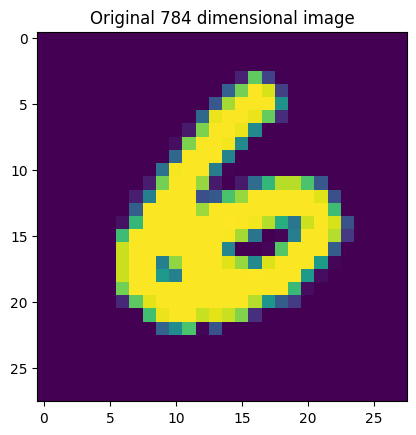

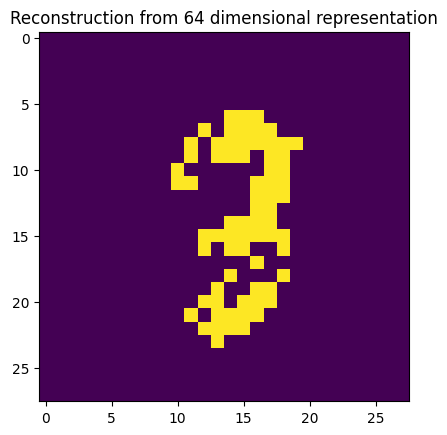

Epoch 13, Iteration 717 -- Loss: 0.121459
Epoch 13, Iteration 718 -- Loss: 0.124666
Epoch 13, Iteration 719 -- Loss: 0.119011
Epoch 13, Iteration 720 -- Loss: 0.119138
Epoch 13, Iteration 721 -- Loss: 0.115958
Epoch 13, Iteration 722 -- Loss: 0.121460
Epoch 13, Iteration 723 -- Loss: 0.122159
Epoch 13, Iteration 724 -- Loss: 0.121081
Epoch 13, Iteration 725 -- Loss: 0.116950
Epoch 13, Iteration 726 -- Loss: 0.116045


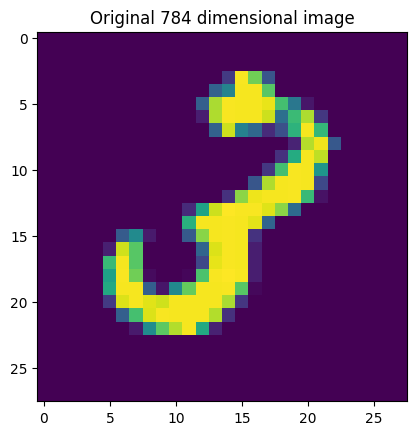

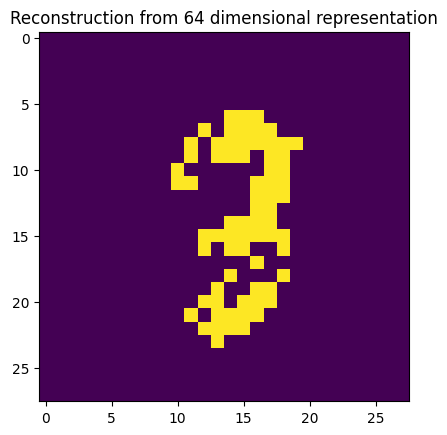

Epoch 13, Iteration 727 -- Loss: 0.121247
Epoch 13, Iteration 728 -- Loss: 0.118981
Epoch 13, Iteration 729 -- Loss: 0.118805
Epoch 13, Iteration 730 -- Loss: 0.119893
Epoch 13, Iteration 731 -- Loss: 0.123718
Epoch 13, Iteration 732 -- Loss: 0.121525
Epoch 13, Iteration 733 -- Loss: 0.119536
Epoch 13, Iteration 734 -- Loss: 0.119653
Epoch 13, Iteration 735 -- Loss: 0.121332
Epoch 13, Iteration 736 -- Loss: 0.120296


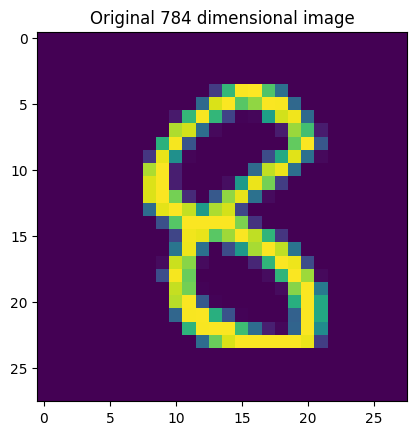

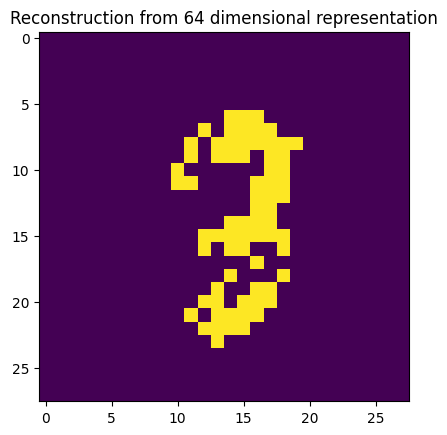

Epoch 13, Iteration 737 -- Loss: 0.122373
Epoch 13, Iteration 738 -- Loss: 0.116254
Epoch 13, Iteration 739 -- Loss: 0.118955
Epoch 13, Iteration 740 -- Loss: 0.119424
Epoch 13, Iteration 741 -- Loss: 0.120807
Epoch 13, Iteration 742 -- Loss: 0.121985
Epoch 13, Iteration 743 -- Loss: 0.123048
Epoch 13, Iteration 744 -- Loss: 0.120678
Epoch 13, Iteration 745 -- Loss: 0.117663
Epoch 13, Iteration 746 -- Loss: 0.121412


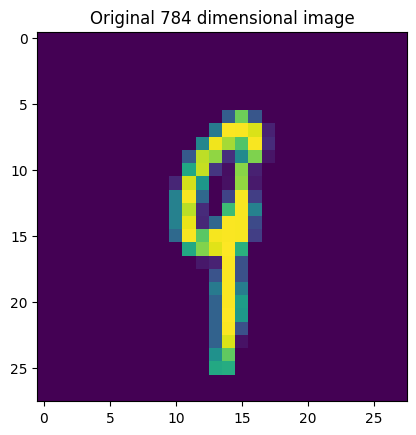

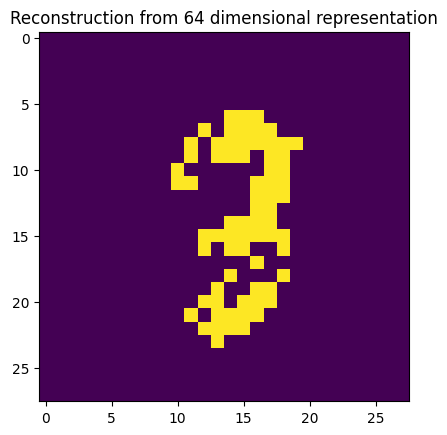

Epoch 13, Iteration 747 -- Loss: 0.117107
Epoch 13, Iteration 748 -- Loss: 0.118123
Epoch 13, Iteration 749 -- Loss: 0.119534
Epoch 13, Iteration 750 -- Loss: 0.120005
Epoch 13, Iteration 751 -- Loss: 0.118936
Epoch 13, Iteration 752 -- Loss: 0.118600
Epoch 13, Iteration 753 -- Loss: 0.120338
Epoch 14, Iteration 754 -- Loss: 0.119803


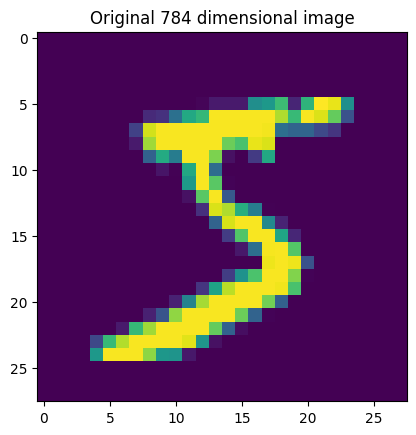

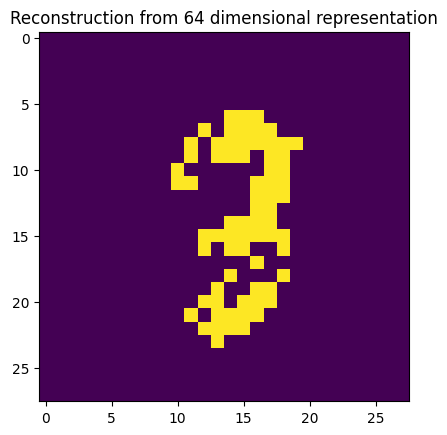

Epoch 14, Iteration 755 -- Loss: 0.119466
Epoch 14, Iteration 756 -- Loss: 0.121757
Epoch 14, Iteration 757 -- Loss: 0.118124
Epoch 14, Iteration 758 -- Loss: 0.123511
Epoch 14, Iteration 759 -- Loss: 0.124139
Epoch 14, Iteration 760 -- Loss: 0.117507
Epoch 14, Iteration 761 -- Loss: 0.117720
Epoch 14, Iteration 762 -- Loss: 0.121457
Epoch 14, Iteration 763 -- Loss: 0.121306
Epoch 14, Iteration 764 -- Loss: 0.123490


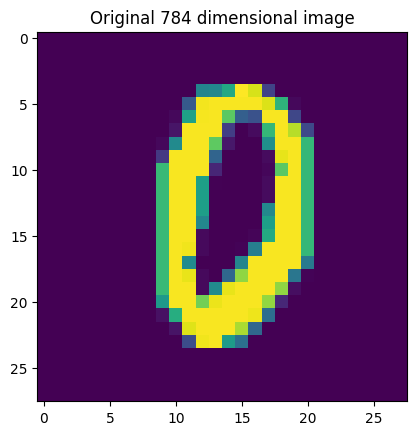

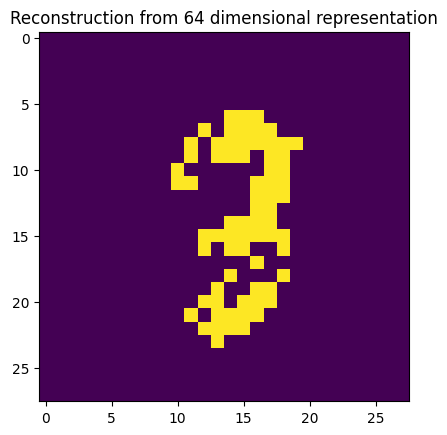

Epoch 14, Iteration 765 -- Loss: 0.118799
Epoch 14, Iteration 766 -- Loss: 0.126162
Epoch 14, Iteration 767 -- Loss: 0.124793
Epoch 14, Iteration 768 -- Loss: 0.119094
Epoch 14, Iteration 769 -- Loss: 0.118701
Epoch 14, Iteration 770 -- Loss: 0.118970
Epoch 14, Iteration 771 -- Loss: 0.114104
Epoch 14, Iteration 772 -- Loss: 0.119934
Epoch 14, Iteration 773 -- Loss: 0.125328
Epoch 14, Iteration 774 -- Loss: 0.121211


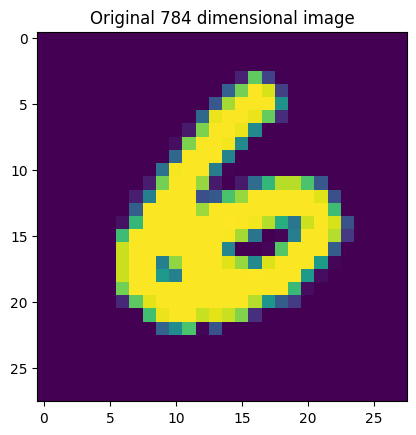

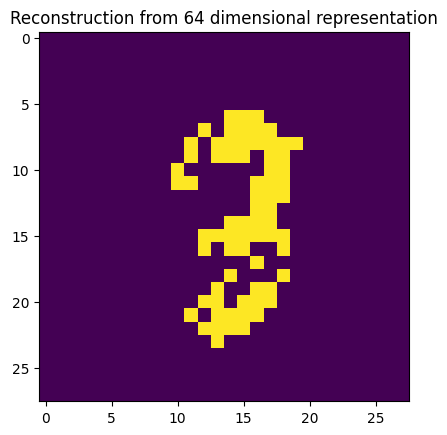

Epoch 14, Iteration 775 -- Loss: 0.121459
Epoch 14, Iteration 776 -- Loss: 0.124666
Epoch 14, Iteration 777 -- Loss: 0.119011
Epoch 14, Iteration 778 -- Loss: 0.119138
Epoch 14, Iteration 779 -- Loss: 0.115958
Epoch 14, Iteration 780 -- Loss: 0.121460
Epoch 14, Iteration 781 -- Loss: 0.122159
Epoch 14, Iteration 782 -- Loss: 0.121081
Epoch 14, Iteration 783 -- Loss: 0.116950
Epoch 14, Iteration 784 -- Loss: 0.116045


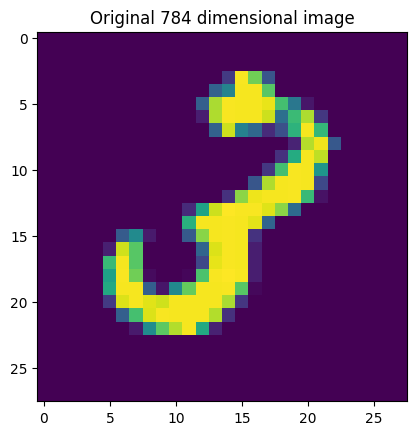

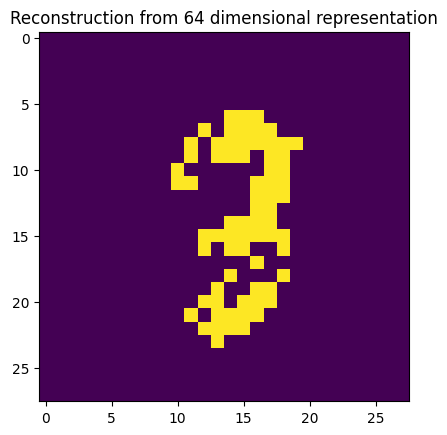

Epoch 14, Iteration 785 -- Loss: 0.121247
Epoch 14, Iteration 786 -- Loss: 0.118981
Epoch 14, Iteration 787 -- Loss: 0.118805
Epoch 14, Iteration 788 -- Loss: 0.119893
Epoch 14, Iteration 789 -- Loss: 0.123718
Epoch 14, Iteration 790 -- Loss: 0.121525
Epoch 14, Iteration 791 -- Loss: 0.119348
Epoch 14, Iteration 792 -- Loss: 0.119624
Epoch 14, Iteration 793 -- Loss: 0.121214
Epoch 14, Iteration 794 -- Loss: 0.120087


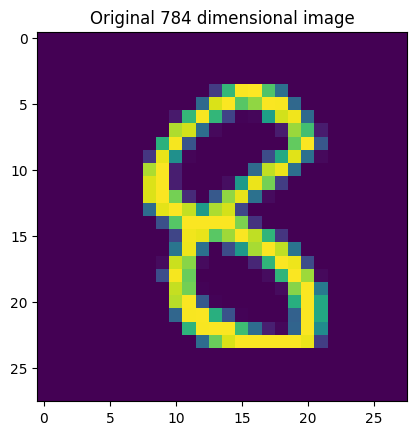

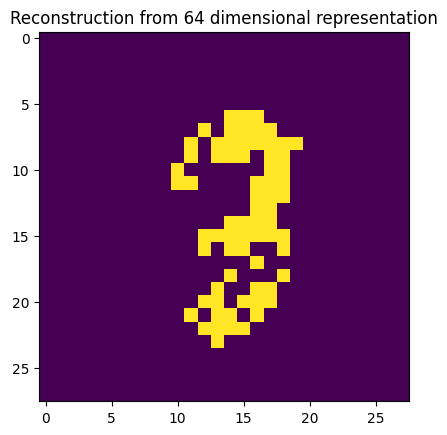

Epoch 14, Iteration 795 -- Loss: 0.122335
Epoch 14, Iteration 796 -- Loss: 0.116183
Epoch 14, Iteration 797 -- Loss: 0.118890
Epoch 14, Iteration 798 -- Loss: 0.119420
Epoch 14, Iteration 799 -- Loss: 0.120742
Epoch 14, Iteration 800 -- Loss: 0.122041
Epoch 14, Iteration 801 -- Loss: 0.123081
Epoch 14, Iteration 802 -- Loss: 0.120570
Epoch 14, Iteration 803 -- Loss: 0.117753
Epoch 14, Iteration 804 -- Loss: 0.121282


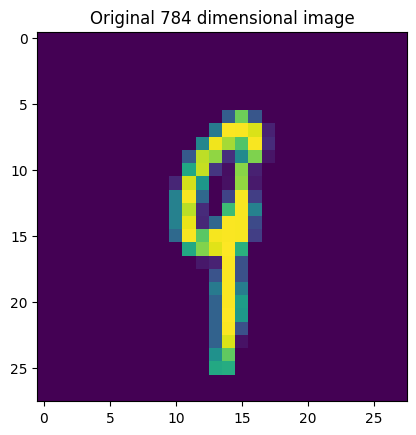

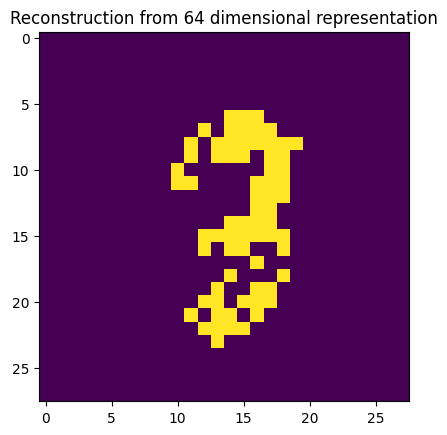

Epoch 14, Iteration 805 -- Loss: 0.117137
Epoch 14, Iteration 806 -- Loss: 0.118039
Epoch 14, Iteration 807 -- Loss: 0.119629
Epoch 14, Iteration 808 -- Loss: 0.120070
Epoch 14, Iteration 809 -- Loss: 0.118909
Epoch 14, Iteration 810 -- Loss: 0.118449
Epoch 14, Iteration 811 -- Loss: 0.120306
Epoch 15, Iteration 812 -- Loss: 0.119651


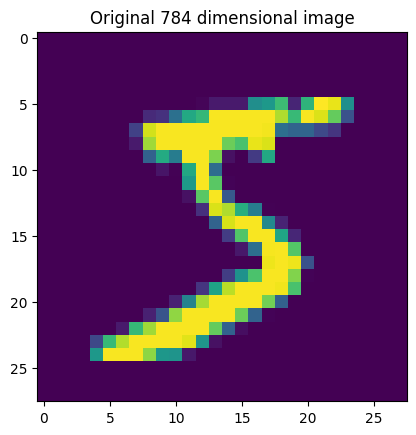

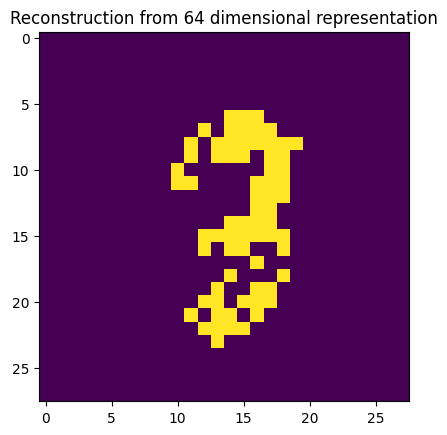

Epoch 15, Iteration 813 -- Loss: 0.119482
Epoch 15, Iteration 814 -- Loss: 0.121702
Epoch 15, Iteration 815 -- Loss: 0.118023
Epoch 15, Iteration 816 -- Loss: 0.123474
Epoch 15, Iteration 817 -- Loss: 0.124129
Epoch 15, Iteration 818 -- Loss: 0.117538
Epoch 15, Iteration 819 -- Loss: 0.117622
Epoch 15, Iteration 820 -- Loss: 0.121442
Epoch 15, Iteration 821 -- Loss: 0.121281
Epoch 15, Iteration 822 -- Loss: 0.123483


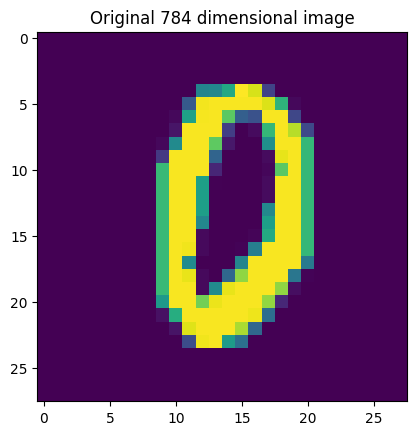

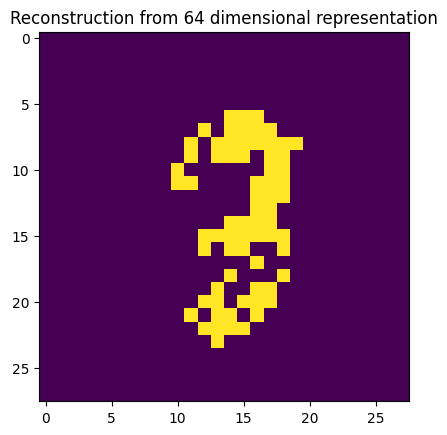

Epoch 15, Iteration 823 -- Loss: 0.118732
Epoch 15, Iteration 824 -- Loss: 0.125980
Epoch 15, Iteration 825 -- Loss: 0.124732
Epoch 15, Iteration 826 -- Loss: 0.119063
Epoch 15, Iteration 827 -- Loss: 0.118609
Epoch 15, Iteration 828 -- Loss: 0.118938
Epoch 15, Iteration 829 -- Loss: 0.114135
Epoch 15, Iteration 830 -- Loss: 0.119957
Epoch 15, Iteration 831 -- Loss: 0.125384
Epoch 15, Iteration 832 -- Loss: 0.121222


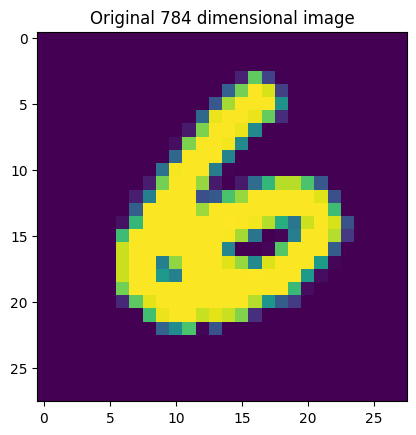

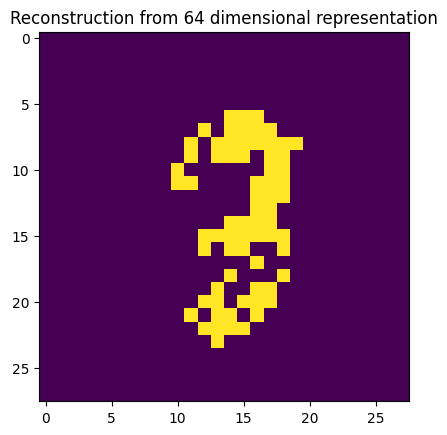

Epoch 15, Iteration 833 -- Loss: 0.121438
Epoch 15, Iteration 834 -- Loss: 0.124756
Epoch 15, Iteration 835 -- Loss: 0.118938
Epoch 15, Iteration 836 -- Loss: 0.119216
Epoch 15, Iteration 837 -- Loss: 0.116077
Epoch 15, Iteration 838 -- Loss: 0.121567
Epoch 15, Iteration 839 -- Loss: 0.122348
Epoch 15, Iteration 840 -- Loss: 0.121063
Epoch 15, Iteration 841 -- Loss: 0.116719
Epoch 15, Iteration 842 -- Loss: 0.115993


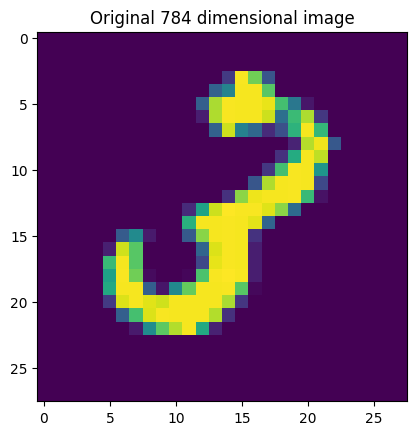

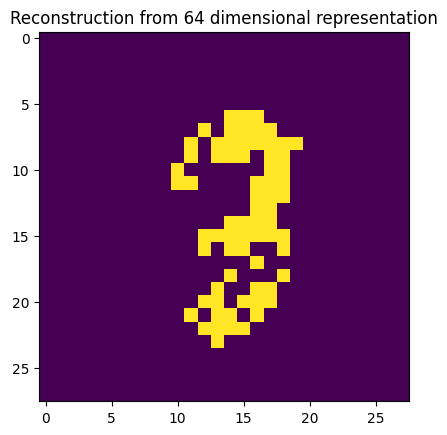

Epoch 15, Iteration 843 -- Loss: 0.121172
Epoch 15, Iteration 844 -- Loss: 0.119004
Epoch 15, Iteration 845 -- Loss: 0.119221
Epoch 15, Iteration 846 -- Loss: 0.119865
Epoch 15, Iteration 847 -- Loss: 0.124092
Epoch 15, Iteration 848 -- Loss: 0.121886
Epoch 15, Iteration 849 -- Loss: 0.119839
Epoch 15, Iteration 850 -- Loss: 0.119948
Epoch 15, Iteration 851 -- Loss: 0.121416
Epoch 15, Iteration 852 -- Loss: 0.120443


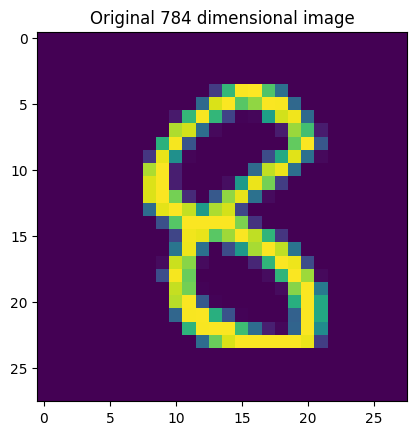

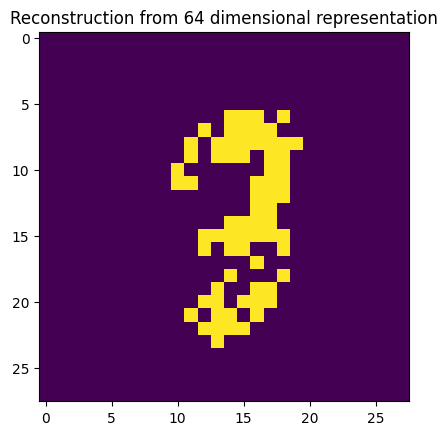

Epoch 15, Iteration 853 -- Loss: 0.122865
Epoch 15, Iteration 854 -- Loss: 0.116342
Epoch 15, Iteration 855 -- Loss: 0.119265
Epoch 15, Iteration 856 -- Loss: 0.119813
Epoch 15, Iteration 857 -- Loss: 0.121092
Epoch 15, Iteration 858 -- Loss: 0.122387
Epoch 15, Iteration 859 -- Loss: 0.123471
Epoch 15, Iteration 860 -- Loss: 0.120974
Epoch 15, Iteration 861 -- Loss: 0.118058
Epoch 15, Iteration 862 -- Loss: 0.121608


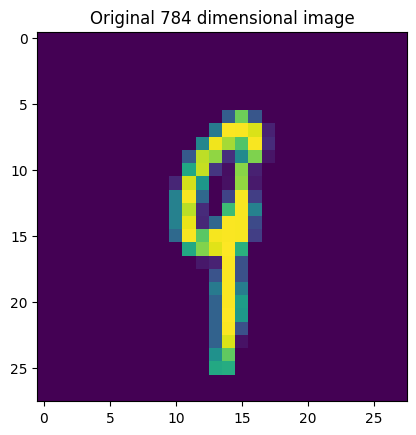

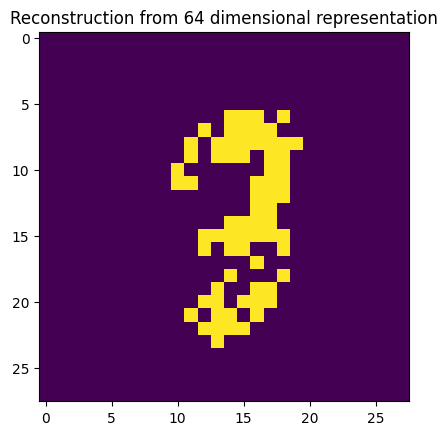

Epoch 15, Iteration 863 -- Loss: 0.117392
Epoch 15, Iteration 864 -- Loss: 0.118415
Epoch 15, Iteration 865 -- Loss: 0.119936
Epoch 15, Iteration 866 -- Loss: 0.120345
Epoch 15, Iteration 867 -- Loss: 0.119336
Epoch 15, Iteration 868 -- Loss: 0.118737
Epoch 15, Iteration 869 -- Loss: 0.120505
Epoch 16, Iteration 870 -- Loss: 0.119900


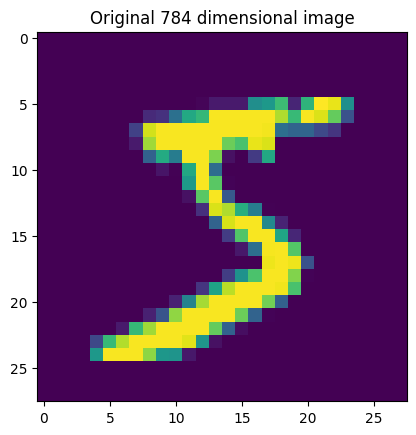

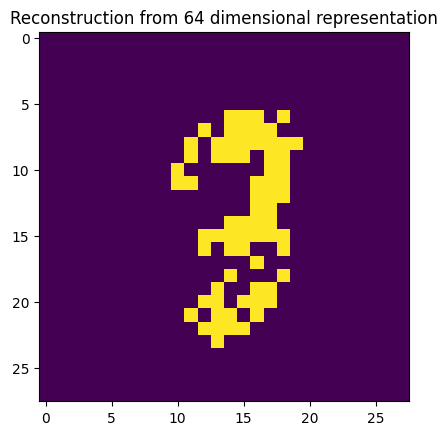

Epoch 16, Iteration 871 -- Loss: 0.119739
Epoch 16, Iteration 872 -- Loss: 0.121979
Epoch 16, Iteration 873 -- Loss: 0.118347
Epoch 16, Iteration 874 -- Loss: 0.123835
Epoch 16, Iteration 875 -- Loss: 0.124322
Epoch 16, Iteration 876 -- Loss: 0.117820
Epoch 16, Iteration 877 -- Loss: 0.117980
Epoch 16, Iteration 878 -- Loss: 0.121770
Epoch 16, Iteration 879 -- Loss: 0.121612
Epoch 16, Iteration 880 -- Loss: 0.123694


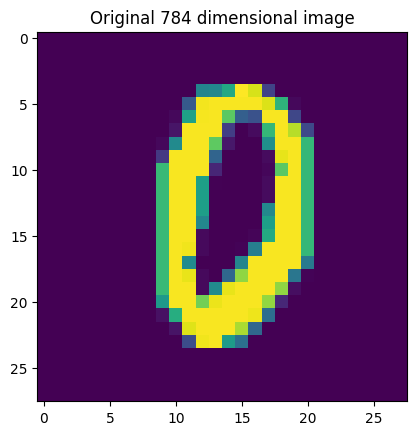

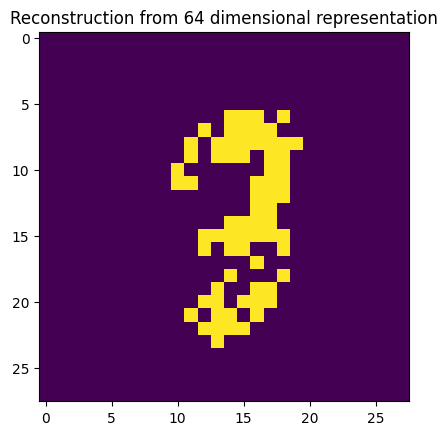

Epoch 16, Iteration 881 -- Loss: 0.118984
Epoch 16, Iteration 882 -- Loss: 0.126202
Epoch 16, Iteration 883 -- Loss: 0.125058
Epoch 16, Iteration 884 -- Loss: 0.119505
Epoch 16, Iteration 885 -- Loss: 0.118929
Epoch 16, Iteration 886 -- Loss: 0.119307
Epoch 16, Iteration 887 -- Loss: 0.114561
Epoch 16, Iteration 888 -- Loss: 0.120283
Epoch 16, Iteration 889 -- Loss: 0.125767
Epoch 16, Iteration 890 -- Loss: 0.121397


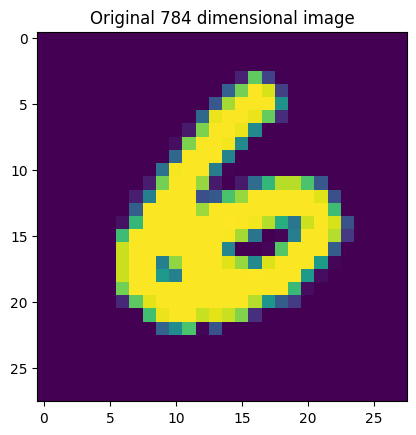

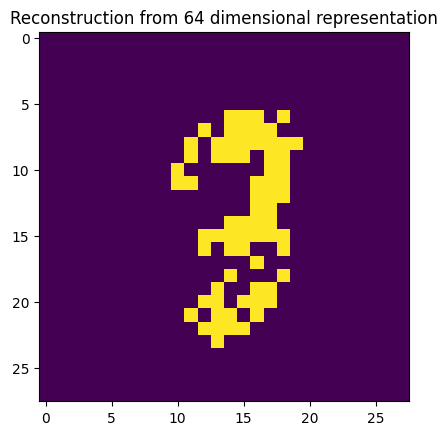

Epoch 16, Iteration 891 -- Loss: 0.121816
Epoch 16, Iteration 892 -- Loss: 0.125109
Epoch 16, Iteration 893 -- Loss: 0.119240
Epoch 16, Iteration 894 -- Loss: 0.119547
Epoch 16, Iteration 895 -- Loss: 0.116490
Epoch 16, Iteration 896 -- Loss: 0.121994
Epoch 16, Iteration 897 -- Loss: 0.122682
Epoch 16, Iteration 898 -- Loss: 0.121286
Epoch 16, Iteration 899 -- Loss: 0.117090
Epoch 16, Iteration 900 -- Loss: 0.116348


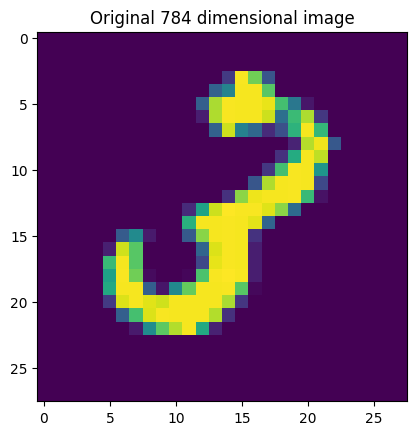

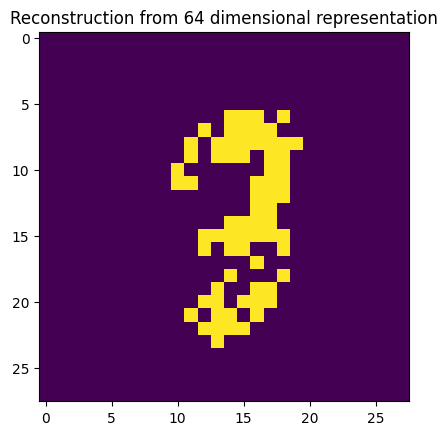

Epoch 16, Iteration 901 -- Loss: 0.121435
Epoch 16, Iteration 902 -- Loss: 0.119337
Epoch 16, Iteration 903 -- Loss: 0.119221
Epoch 16, Iteration 904 -- Loss: 0.119865
Epoch 16, Iteration 905 -- Loss: 0.124092
Epoch 16, Iteration 906 -- Loss: 0.121886
Epoch 16, Iteration 907 -- Loss: 0.119839
Epoch 16, Iteration 908 -- Loss: 0.119948
Epoch 16, Iteration 909 -- Loss: 0.121416
Epoch 16, Iteration 910 -- Loss: 0.120443


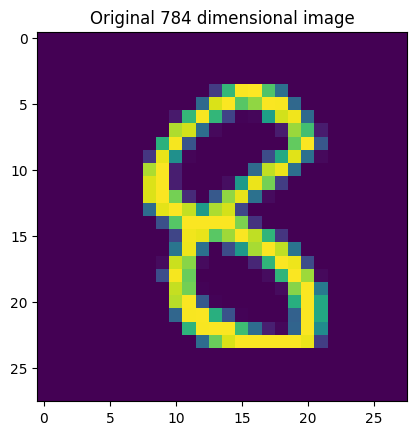

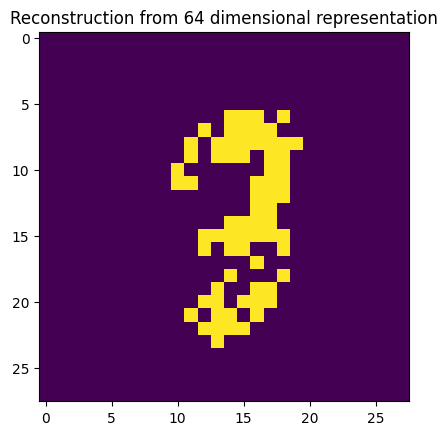

Epoch 16, Iteration 911 -- Loss: 0.122641
Epoch 16, Iteration 912 -- Loss: 0.116342
Epoch 16, Iteration 913 -- Loss: 0.119265
Epoch 16, Iteration 914 -- Loss: 0.119813
Epoch 16, Iteration 915 -- Loss: 0.121092
Epoch 16, Iteration 916 -- Loss: 0.122387
Epoch 16, Iteration 917 -- Loss: 0.123471
Epoch 16, Iteration 918 -- Loss: 0.120974
Epoch 16, Iteration 919 -- Loss: 0.118058
Epoch 16, Iteration 920 -- Loss: 0.121608


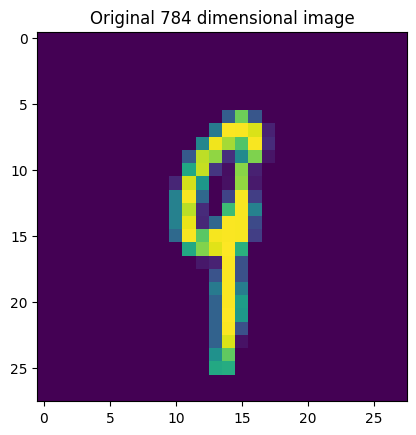

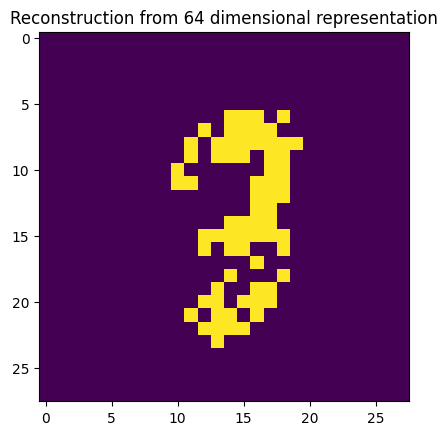

Epoch 16, Iteration 921 -- Loss: 0.117392
Epoch 16, Iteration 922 -- Loss: 0.118415
Epoch 16, Iteration 923 -- Loss: 0.119936
Epoch 16, Iteration 924 -- Loss: 0.120345
Epoch 16, Iteration 925 -- Loss: 0.119336
Epoch 16, Iteration 926 -- Loss: 0.118737
Epoch 16, Iteration 927 -- Loss: 0.120505
Epoch 17, Iteration 928 -- Loss: 0.119900


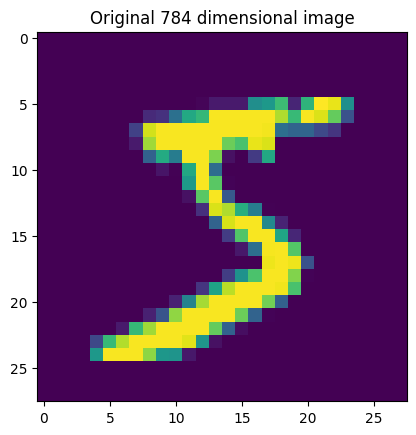

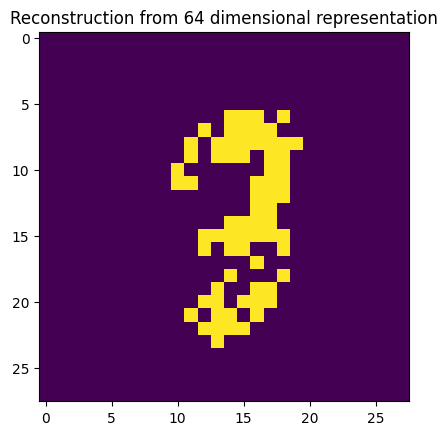

Epoch 17, Iteration 929 -- Loss: 0.119739
Epoch 17, Iteration 930 -- Loss: 0.121979
Epoch 17, Iteration 931 -- Loss: 0.118347
Epoch 17, Iteration 932 -- Loss: 0.123835
Epoch 17, Iteration 933 -- Loss: 0.124322
Epoch 17, Iteration 934 -- Loss: 0.117820
Epoch 17, Iteration 935 -- Loss: 0.117980
Epoch 17, Iteration 936 -- Loss: 0.121770
Epoch 17, Iteration 937 -- Loss: 0.121612
Epoch 17, Iteration 938 -- Loss: 0.123694


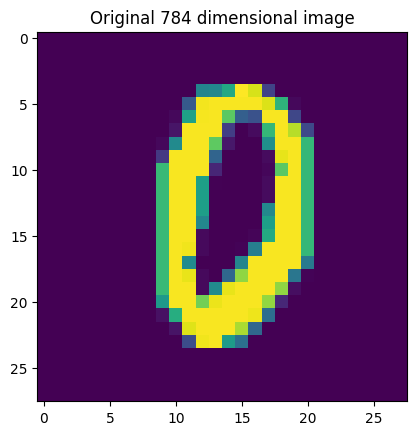

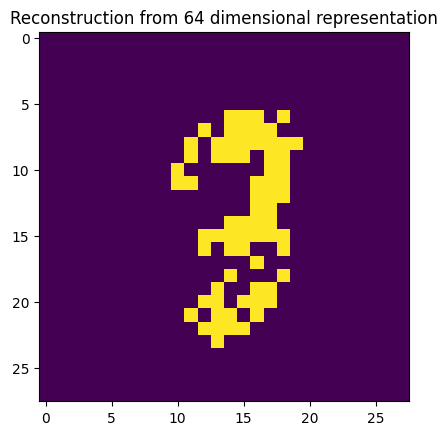

Epoch 17, Iteration 939 -- Loss: 0.118984
Epoch 17, Iteration 940 -- Loss: 0.126202
Epoch 17, Iteration 941 -- Loss: 0.125058
Epoch 17, Iteration 942 -- Loss: 0.119505
Epoch 17, Iteration 943 -- Loss: 0.118929
Epoch 17, Iteration 944 -- Loss: 0.119307
Epoch 17, Iteration 945 -- Loss: 0.114561
Epoch 17, Iteration 946 -- Loss: 0.120283
Epoch 17, Iteration 947 -- Loss: 0.125766
Epoch 17, Iteration 948 -- Loss: 0.121397


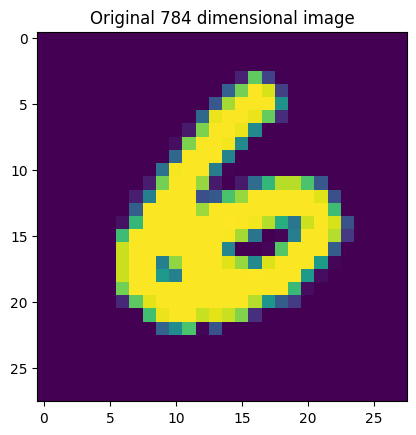

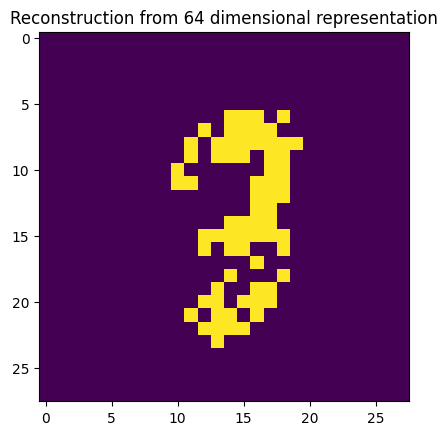

Epoch 17, Iteration 949 -- Loss: 0.121816
Epoch 17, Iteration 950 -- Loss: 0.125109
Epoch 17, Iteration 951 -- Loss: 0.119240
Epoch 17, Iteration 952 -- Loss: 0.119547
Epoch 17, Iteration 953 -- Loss: 0.116490
Epoch 17, Iteration 954 -- Loss: 0.121994
Epoch 17, Iteration 955 -- Loss: 0.122682
Epoch 17, Iteration 956 -- Loss: 0.121286
Epoch 17, Iteration 957 -- Loss: 0.117090
Epoch 17, Iteration 958 -- Loss: 0.116348


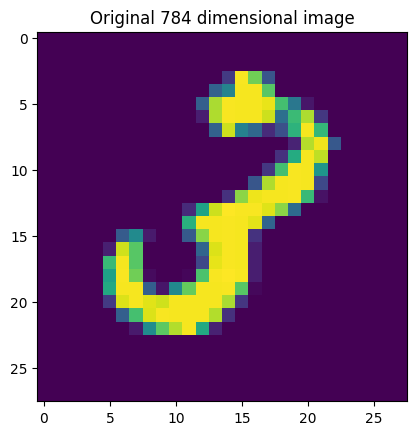

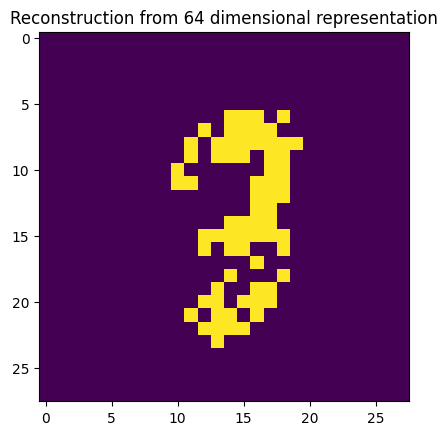

Epoch 17, Iteration 959 -- Loss: 0.121435
Epoch 17, Iteration 960 -- Loss: 0.119337
Epoch 17, Iteration 961 -- Loss: 0.119221
Epoch 17, Iteration 962 -- Loss: 0.119798
Epoch 17, Iteration 963 -- Loss: 0.124240
Epoch 17, Iteration 964 -- Loss: 0.122099
Epoch 17, Iteration 965 -- Loss: 0.120038
Epoch 17, Iteration 966 -- Loss: 0.120169
Epoch 17, Iteration 967 -- Loss: 0.121646
Epoch 17, Iteration 968 -- Loss: 0.120646


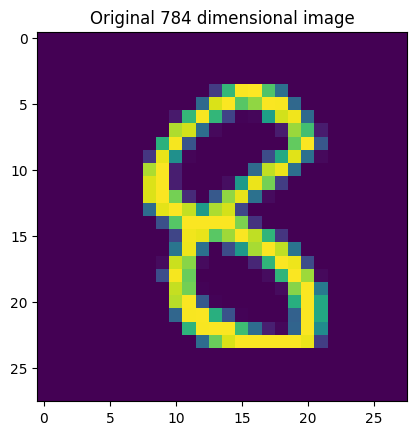

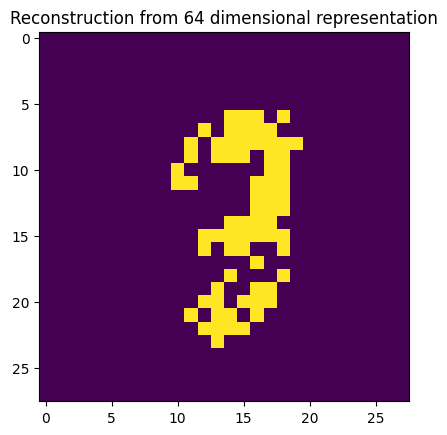

Epoch 17, Iteration 969 -- Loss: 0.122784
Epoch 17, Iteration 970 -- Loss: 0.116555
Epoch 17, Iteration 971 -- Loss: 0.119410
Epoch 17, Iteration 972 -- Loss: 0.120047
Epoch 17, Iteration 973 -- Loss: 0.121265
Epoch 17, Iteration 974 -- Loss: 0.122562
Epoch 17, Iteration 975 -- Loss: 0.123625
Epoch 17, Iteration 976 -- Loss: 0.121193
Epoch 17, Iteration 977 -- Loss: 0.118298
Epoch 17, Iteration 978 -- Loss: 0.121852


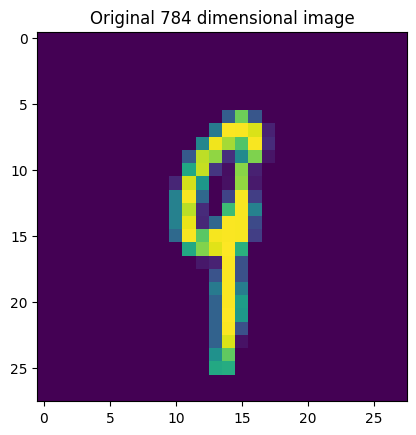

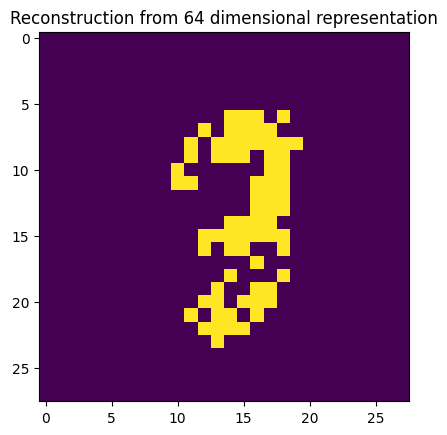

Epoch 17, Iteration 979 -- Loss: 0.117578
Epoch 17, Iteration 980 -- Loss: 0.118687
Epoch 17, Iteration 981 -- Loss: 0.120077
Epoch 17, Iteration 982 -- Loss: 0.120464
Epoch 17, Iteration 983 -- Loss: 0.119569
Epoch 17, Iteration 984 -- Loss: 0.118953
Epoch 17, Iteration 985 -- Loss: 0.120636
Epoch 18, Iteration 986 -- Loss: 0.120037


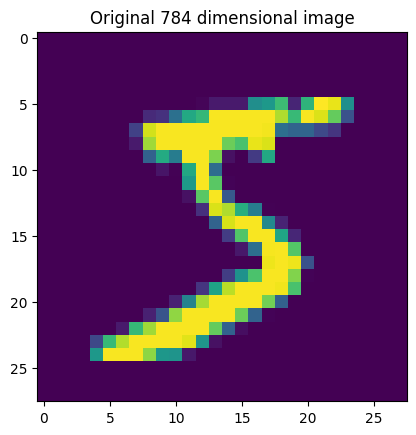

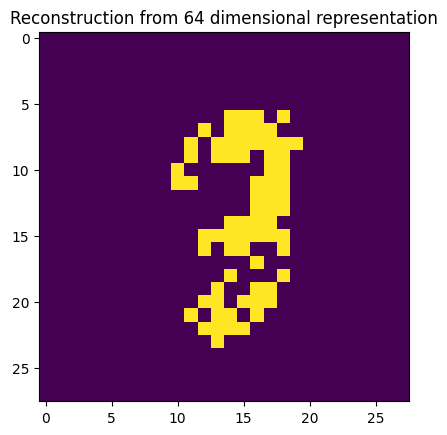

Epoch 18, Iteration 987 -- Loss: 0.119944
Epoch 18, Iteration 988 -- Loss: 0.122156
Epoch 18, Iteration 989 -- Loss: 0.118617
Epoch 18, Iteration 990 -- Loss: 0.123989
Epoch 18, Iteration 991 -- Loss: 0.124398
Epoch 18, Iteration 992 -- Loss: 0.118108
Epoch 18, Iteration 993 -- Loss: 0.118216
Epoch 18, Iteration 994 -- Loss: 0.121934
Epoch 18, Iteration 995 -- Loss: 0.121833
Epoch 18, Iteration 996 -- Loss: 0.123765


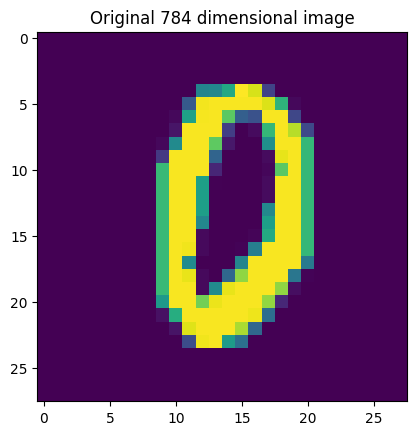

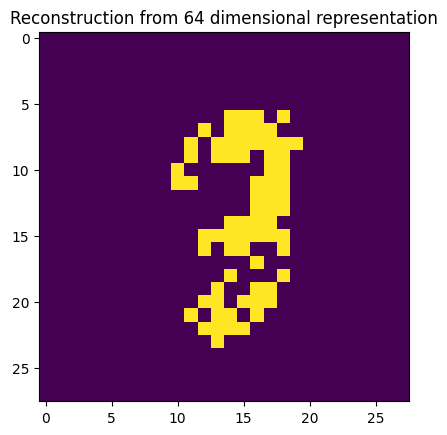

Epoch 18, Iteration 997 -- Loss: 0.119093
Epoch 18, Iteration 998 -- Loss: 0.126310
Epoch 18, Iteration 999 -- Loss: 0.125196
Epoch 18, Iteration 1000 -- Loss: 0.119770
Epoch 18, Iteration 1001 -- Loss: 0.119175
Epoch 18, Iteration 1002 -- Loss: 0.119485
Epoch 18, Iteration 1003 -- Loss: 0.114873
Epoch 18, Iteration 1004 -- Loss: 0.120448
Epoch 18, Iteration 1005 -- Loss: 0.125872
Epoch 18, Iteration 1006 -- Loss: 0.121629


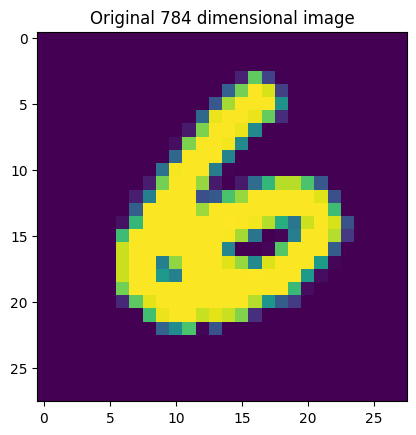

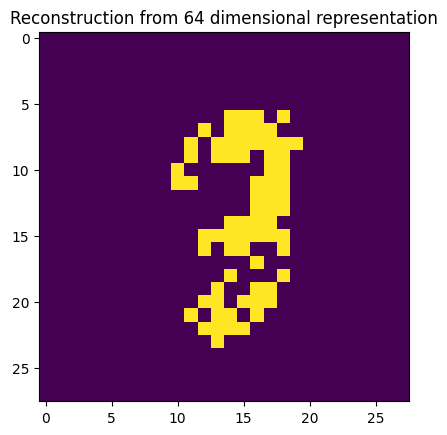

Epoch 18, Iteration 1007 -- Loss: 0.121966
Epoch 18, Iteration 1008 -- Loss: 0.125279
Epoch 18, Iteration 1009 -- Loss: 0.119458
Epoch 18, Iteration 1010 -- Loss: 0.119705
Epoch 18, Iteration 1011 -- Loss: 0.116764
Epoch 18, Iteration 1012 -- Loss: 0.122195
Epoch 18, Iteration 1013 -- Loss: 0.122825
Epoch 18, Iteration 1014 -- Loss: 0.121431
Epoch 18, Iteration 1015 -- Loss: 0.117299
Epoch 18, Iteration 1016 -- Loss: 0.116662


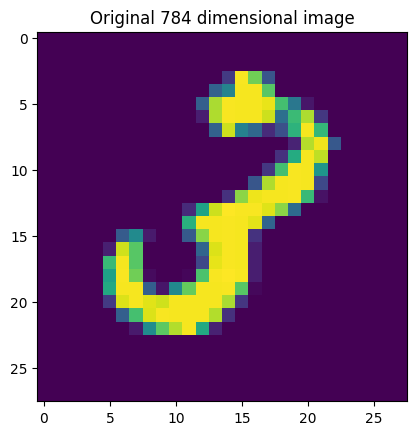

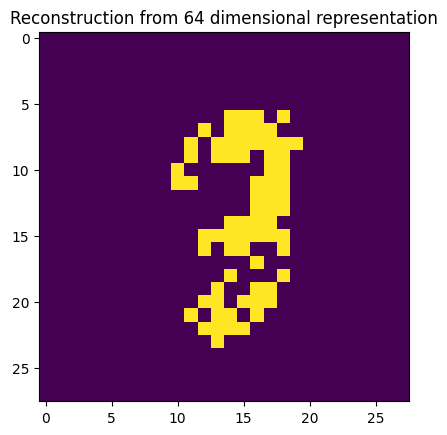

Epoch 18, Iteration 1017 -- Loss: 0.121612
Epoch 18, Iteration 1018 -- Loss: 0.119597
Epoch 18, Iteration 1019 -- Loss: 0.119344
Epoch 18, Iteration 1020 -- Loss: 0.119964
Epoch 18, Iteration 1021 -- Loss: 0.124240
Epoch 18, Iteration 1022 -- Loss: 0.122099
Epoch 18, Iteration 1023 -- Loss: 0.120038
Epoch 18, Iteration 1024 -- Loss: 0.120169
Epoch 18, Iteration 1025 -- Loss: 0.121646
Epoch 18, Iteration 1026 -- Loss: 0.120646


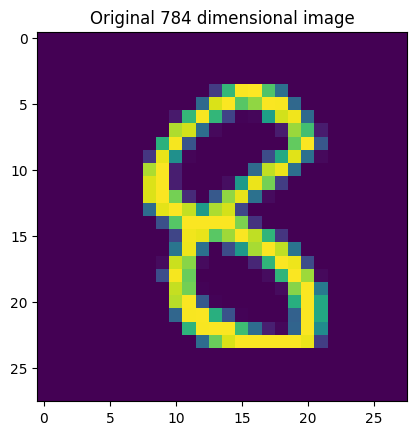

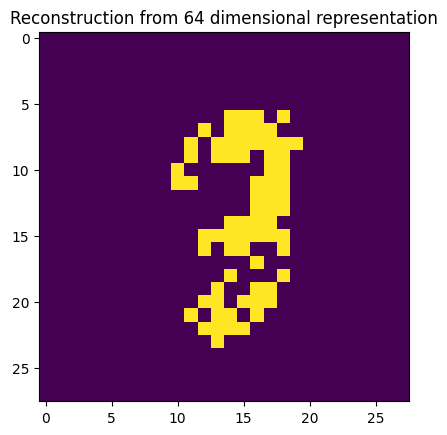

Epoch 18, Iteration 1027 -- Loss: 0.122784
Epoch 18, Iteration 1028 -- Loss: 0.116555
Epoch 18, Iteration 1029 -- Loss: 0.119410
Epoch 18, Iteration 1030 -- Loss: 0.120047
Epoch 18, Iteration 1031 -- Loss: 0.121265
Epoch 18, Iteration 1032 -- Loss: 0.122562
Epoch 18, Iteration 1033 -- Loss: 0.123625
Epoch 18, Iteration 1034 -- Loss: 0.121193
Epoch 18, Iteration 1035 -- Loss: 0.118298
Epoch 18, Iteration 1036 -- Loss: 0.121852


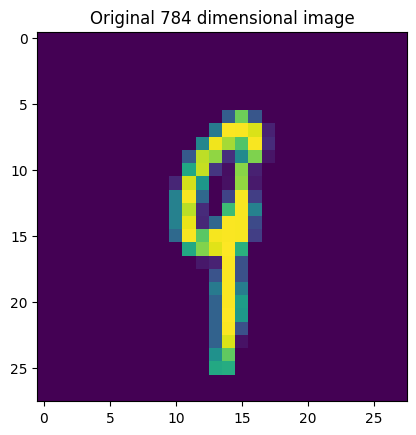

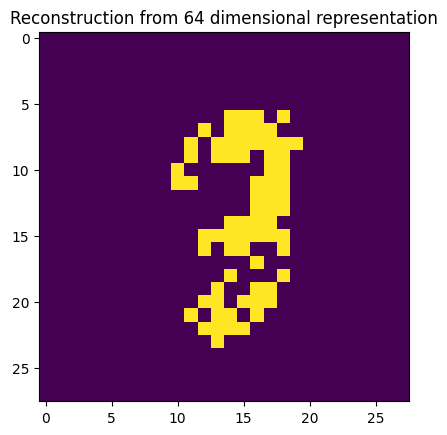

Epoch 18, Iteration 1037 -- Loss: 0.117578
Epoch 18, Iteration 1038 -- Loss: 0.118687
Epoch 18, Iteration 1039 -- Loss: 0.120077
Epoch 18, Iteration 1040 -- Loss: 0.120464
Epoch 18, Iteration 1041 -- Loss: 0.119569
Epoch 18, Iteration 1042 -- Loss: 0.118953
Epoch 18, Iteration 1043 -- Loss: 0.120636
Epoch 19, Iteration 1044 -- Loss: 0.120037


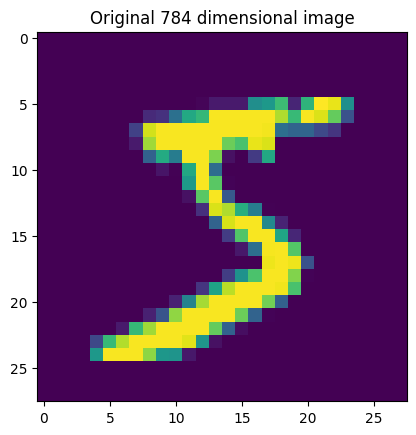

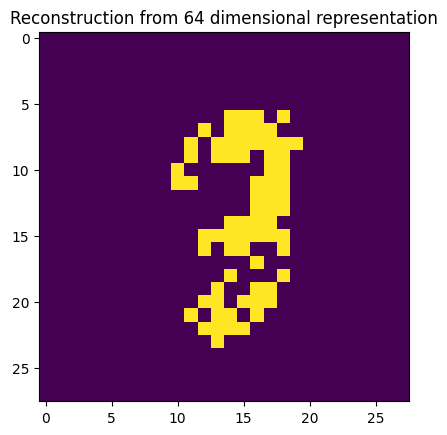

Epoch 19, Iteration 1045 -- Loss: 0.119944
Epoch 19, Iteration 1046 -- Loss: 0.122156
Epoch 19, Iteration 1047 -- Loss: 0.118617
Epoch 19, Iteration 1048 -- Loss: 0.123989
Epoch 19, Iteration 1049 -- Loss: 0.124398
Epoch 19, Iteration 1050 -- Loss: 0.118108
Epoch 19, Iteration 1051 -- Loss: 0.118216
Epoch 19, Iteration 1052 -- Loss: 0.121934
Epoch 19, Iteration 1053 -- Loss: 0.121833
Epoch 19, Iteration 1054 -- Loss: 0.123765


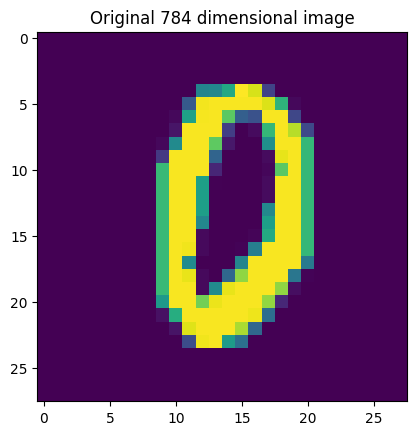

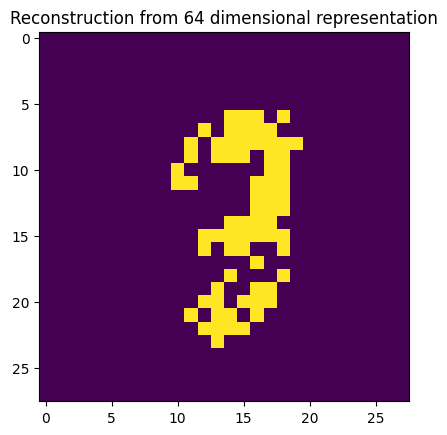

Epoch 19, Iteration 1055 -- Loss: 0.119093
Epoch 19, Iteration 1056 -- Loss: 0.126310
Epoch 19, Iteration 1057 -- Loss: 0.125196
Epoch 19, Iteration 1058 -- Loss: 0.119770
Epoch 19, Iteration 1059 -- Loss: 0.119175
Epoch 19, Iteration 1060 -- Loss: 0.119485
Epoch 19, Iteration 1061 -- Loss: 0.114873
Epoch 19, Iteration 1062 -- Loss: 0.120448
Epoch 19, Iteration 1063 -- Loss: 0.125872
Epoch 19, Iteration 1064 -- Loss: 0.121629


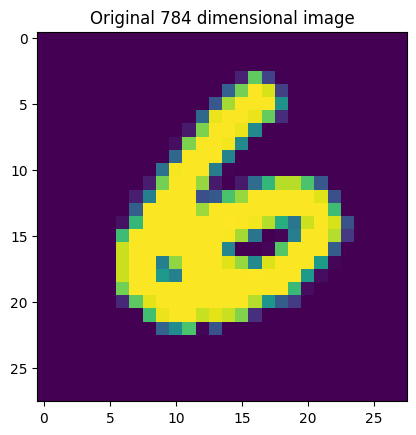

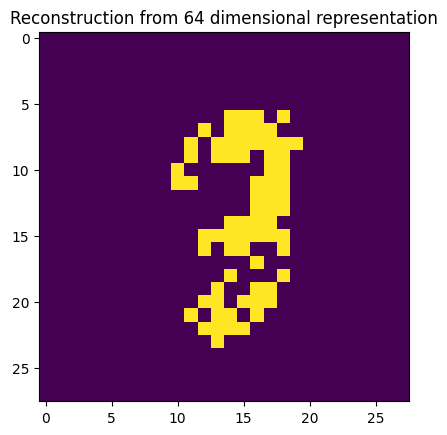

Epoch 19, Iteration 1065 -- Loss: 0.121966
Epoch 19, Iteration 1066 -- Loss: 0.125279
Epoch 19, Iteration 1067 -- Loss: 0.119458
Epoch 19, Iteration 1068 -- Loss: 0.119705
Epoch 19, Iteration 1069 -- Loss: 0.116764
Epoch 19, Iteration 1070 -- Loss: 0.122195
Epoch 19, Iteration 1071 -- Loss: 0.122825
Epoch 19, Iteration 1072 -- Loss: 0.121431
Epoch 19, Iteration 1073 -- Loss: 0.117299
Epoch 19, Iteration 1074 -- Loss: 0.116662


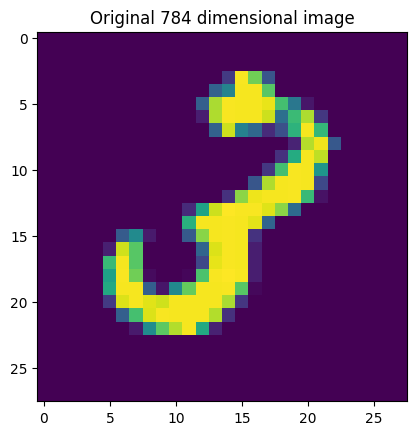

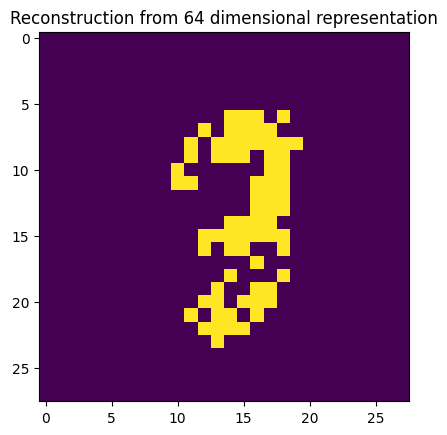

Epoch 19, Iteration 1075 -- Loss: 0.121612
Epoch 19, Iteration 1076 -- Loss: 0.119597
Epoch 19, Iteration 1077 -- Loss: 0.119344
Epoch 19, Iteration 1078 -- Loss: 0.119964
Epoch 19, Iteration 1079 -- Loss: 0.124240
Epoch 19, Iteration 1080 -- Loss: 0.122099
Epoch 19, Iteration 1081 -- Loss: 0.120038
Epoch 19, Iteration 1082 -- Loss: 0.120169
Epoch 19, Iteration 1083 -- Loss: 0.121646
Epoch 19, Iteration 1084 -- Loss: 0.120646


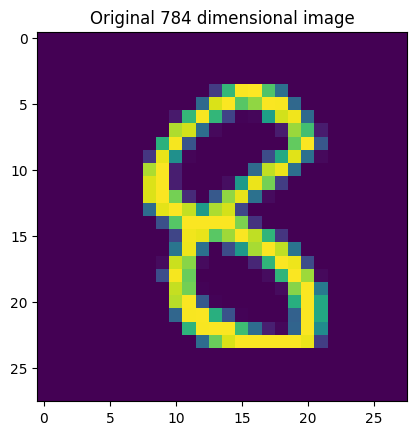

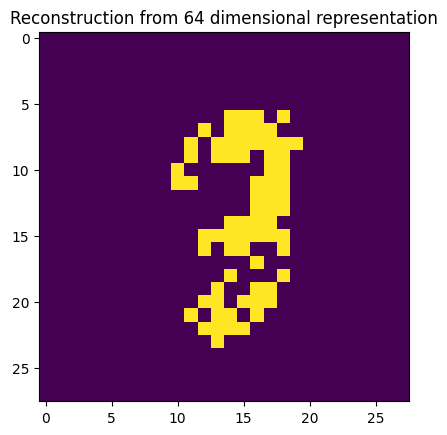

Epoch 19, Iteration 1085 -- Loss: 0.122784
Epoch 19, Iteration 1086 -- Loss: 0.116555
Epoch 19, Iteration 1087 -- Loss: 0.119410
Epoch 19, Iteration 1088 -- Loss: 0.120047
Epoch 19, Iteration 1089 -- Loss: 0.121265
Epoch 19, Iteration 1090 -- Loss: 0.122562
Epoch 19, Iteration 1091 -- Loss: 0.123625
Epoch 19, Iteration 1092 -- Loss: 0.121193
Epoch 19, Iteration 1093 -- Loss: 0.118298
Epoch 19, Iteration 1094 -- Loss: 0.121852


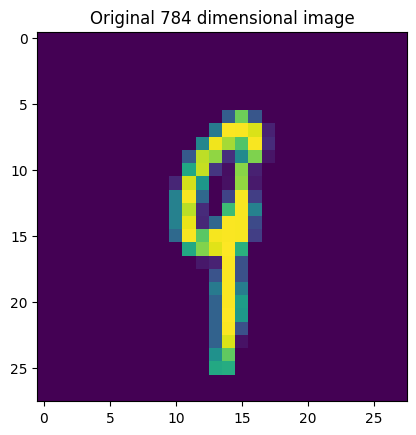

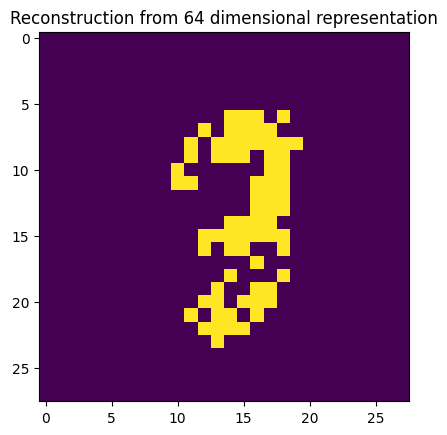

Epoch 19, Iteration 1095 -- Loss: 0.117578
Epoch 19, Iteration 1096 -- Loss: 0.118687
Epoch 19, Iteration 1097 -- Loss: 0.120077
Epoch 19, Iteration 1098 -- Loss: 0.120464
Epoch 19, Iteration 1099 -- Loss: 0.119569
Epoch 19, Iteration 1100 -- Loss: 0.118953
Epoch 19, Iteration 1101 -- Loss: 0.120636
Epoch 20, Iteration 1102 -- Loss: 0.120037


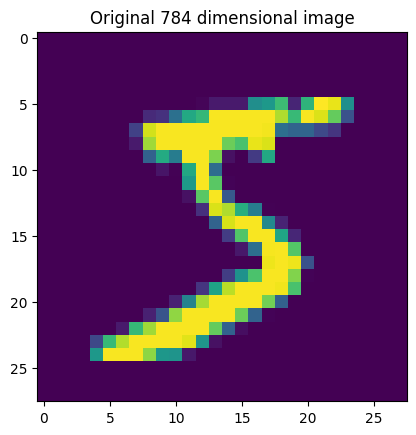

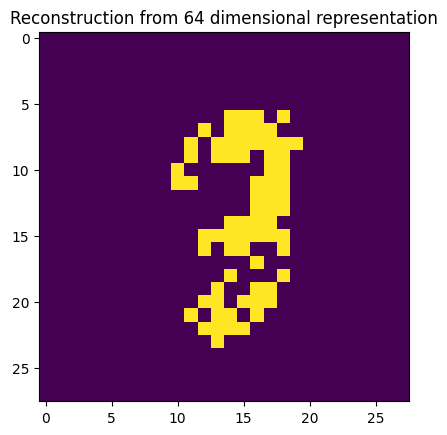

Epoch 20, Iteration 1103 -- Loss: 0.119944
Epoch 20, Iteration 1104 -- Loss: 0.122156
Epoch 20, Iteration 1105 -- Loss: 0.118617
Epoch 20, Iteration 1106 -- Loss: 0.123989
Epoch 20, Iteration 1107 -- Loss: 0.124398
Epoch 20, Iteration 1108 -- Loss: 0.118108
Epoch 20, Iteration 1109 -- Loss: 0.118216
Epoch 20, Iteration 1110 -- Loss: 0.121934
Epoch 20, Iteration 1111 -- Loss: 0.121833
Epoch 20, Iteration 1112 -- Loss: 0.123765


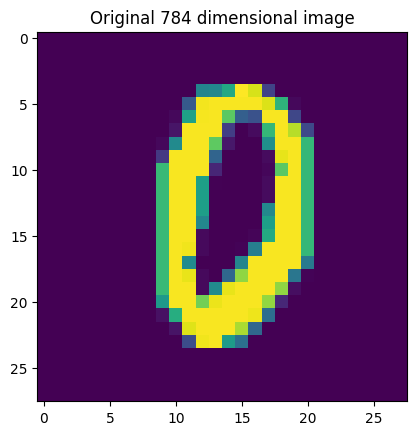

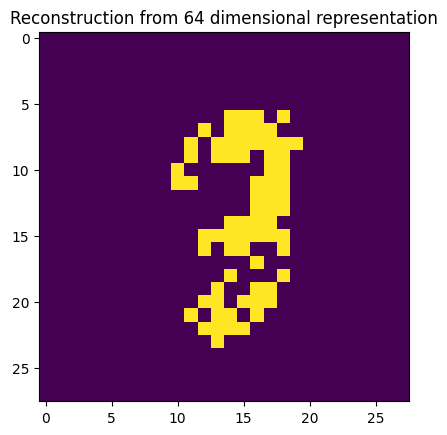

Epoch 20, Iteration 1113 -- Loss: 0.119093
Epoch 20, Iteration 1114 -- Loss: 0.126310
Epoch 20, Iteration 1115 -- Loss: 0.125196
Epoch 20, Iteration 1116 -- Loss: 0.119770
Epoch 20, Iteration 1117 -- Loss: 0.119175
Epoch 20, Iteration 1118 -- Loss: 0.119485
Epoch 20, Iteration 1119 -- Loss: 0.114873
Epoch 20, Iteration 1120 -- Loss: 0.120448
Epoch 20, Iteration 1121 -- Loss: 0.125872
Epoch 20, Iteration 1122 -- Loss: 0.121629


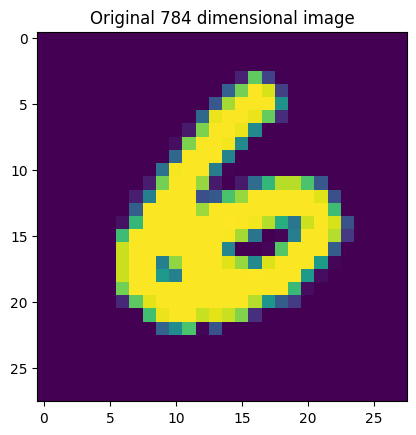

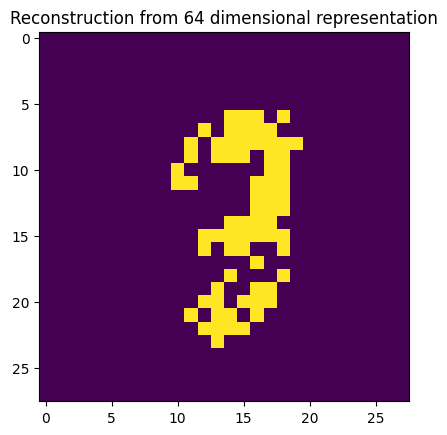

Epoch 20, Iteration 1123 -- Loss: 0.121966
Epoch 20, Iteration 1124 -- Loss: 0.125279
Epoch 20, Iteration 1125 -- Loss: 0.119458
Epoch 20, Iteration 1126 -- Loss: 0.119705
Epoch 20, Iteration 1127 -- Loss: 0.116764
Epoch 20, Iteration 1128 -- Loss: 0.122195
Epoch 20, Iteration 1129 -- Loss: 0.122825
Epoch 20, Iteration 1130 -- Loss: 0.121431
Epoch 20, Iteration 1131 -- Loss: 0.117299
Epoch 20, Iteration 1132 -- Loss: 0.116662


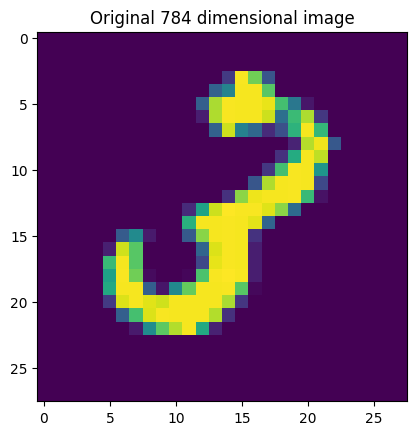

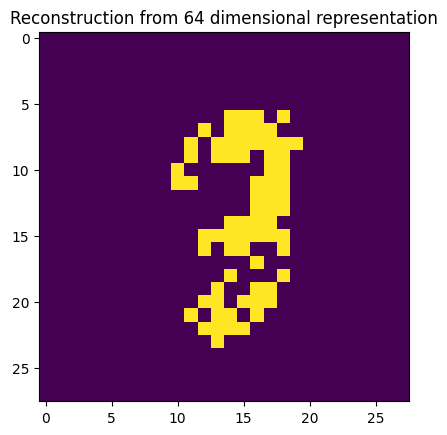

Epoch 20, Iteration 1133 -- Loss: 0.121612
Epoch 20, Iteration 1134 -- Loss: 0.119597
Epoch 20, Iteration 1135 -- Loss: 0.119344
Epoch 20, Iteration 1136 -- Loss: 0.119964
Epoch 20, Iteration 1137 -- Loss: 0.124240
Epoch 20, Iteration 1138 -- Loss: 0.122099
Epoch 20, Iteration 1139 -- Loss: 0.120038
Epoch 20, Iteration 1140 -- Loss: 0.120169
Epoch 20, Iteration 1141 -- Loss: 0.121646
Epoch 20, Iteration 1142 -- Loss: 0.120646


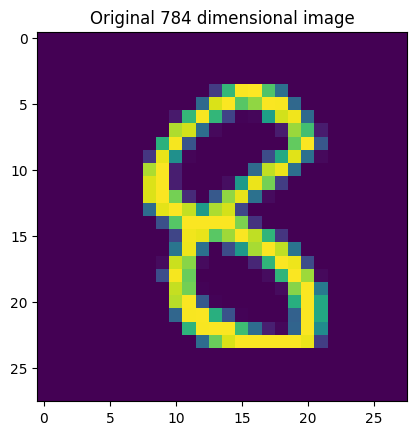

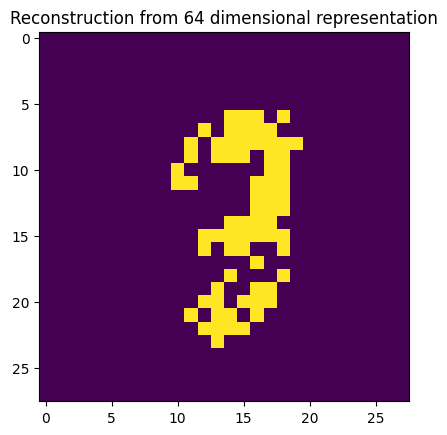

Epoch 20, Iteration 1143 -- Loss: 0.122784
Epoch 20, Iteration 1144 -- Loss: 0.116555
Epoch 20, Iteration 1145 -- Loss: 0.119410
Epoch 20, Iteration 1146 -- Loss: 0.120047
Epoch 20, Iteration 1147 -- Loss: 0.121265
Epoch 20, Iteration 1148 -- Loss: 0.122562
Epoch 20, Iteration 1149 -- Loss: 0.123625
Epoch 20, Iteration 1150 -- Loss: 0.121193
Epoch 20, Iteration 1151 -- Loss: 0.118298
Epoch 20, Iteration 1152 -- Loss: 0.121852


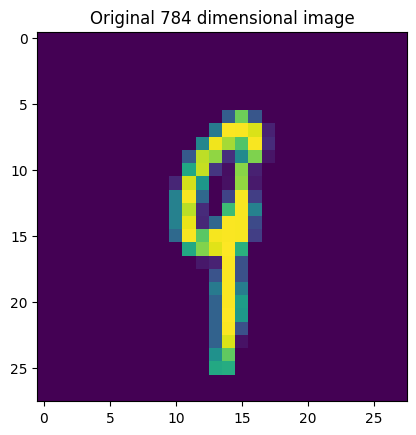

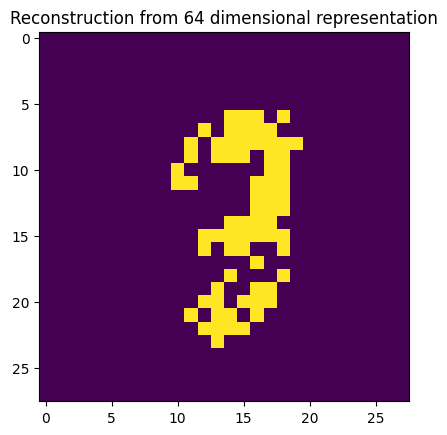

Epoch 20, Iteration 1153 -- Loss: 0.117578
Epoch 20, Iteration 1154 -- Loss: 0.118687
Epoch 20, Iteration 1155 -- Loss: 0.120077
Epoch 20, Iteration 1156 -- Loss: 0.120464
Epoch 20, Iteration 1157 -- Loss: 0.119569
Epoch 20, Iteration 1158 -- Loss: 0.118953
Epoch 20, Iteration 1159 -- Loss: 0.120636


In [38]:
for epoch in range(NUM_EPOCHS):
    for n in range(ITERATIONS_PER_EPOCH):

        ## Sample batch from dataset
        batch_indices = range(n*BATCH_SIZE, n*BATCH_SIZE + BATCH_SIZE)
        X_batch = X[batch_indices]

        ## Forward propagation
        # Matrix Multiplication
        h1 = X_batch @ w1
        # Relu
        o1 = relu(h1)

        # Matrix Multiplication
        h2 = o1 @ w2
        # Sigmoid
        o2 = sigmoid(h2)

        # Obtain the loss using the prepared function and the output of the sigmoid function
        loss = mean_squared_error(o2, X_batch)

        print('Epoch %d, Iteration %d -- Loss: %.6f' % (epoch + 1, epoch * ITERATIONS_PER_EPOCH + n, loss))

        ## Backpropagation

        # Derivative of o2 wrt to loss
        D_o2 = (o2 - X_batch) * 2

        # Derivative of h2 wrt to loss
        D_h2 = sigmoid_backward(D_o2, o2)

        # Derivative of o1 wrt to loss
        D_o1 = D_h2 @ np.transpose(w2)
        # Derivative of w2 wrt to loss
        D_w2 = np.transpose(o1) @ D_h2

        # Derivative of h1 wrt to loss
        D_h1 = relu_backward(D_o1, o1)

        # Derivative of w1 wrt to loss
        D_w1 = np.transpose(X_batch) @ D_h1

        ## Parameter updates
        w1 -= D_w1 * LEARNING_RATE
        w2 -= D_w2 * LEARNING_RATE


        if n % 10 == 0:
            plt.figure()
            plt.title('Original %d dimensional image' % INPUT_SIZE)
            plt.imshow(X_batch[0].reshape(28, 28)); plt.show()


            plt.figure()
            plt.title('Reconstruction from %d dimensional representation' % HIDDEN_SIZE)
            plt.imshow(o2[0].reshape(28, 28)); plt.show()





## **Problem 4: Building your Recurrent Neural Network - Step by Step (30 pts)**

Recurrent Neural Networks (RNN) are very effective for Natural Language Processing and other sequence tasks because they have "memory". They can read inputs $x^{\langle t \rangle}$ (such as words) one at a time, and remember some information/context through the hidden layer activations that get passed from one time-step to the next. This allows a uni-directional RNN to take information from the past to process later inputs. A bidirection RNN can take context from both the past and the future.

**Notation**:
- Superscript $[l]$ denotes an object associated with the $l^{th}$ layer.
    - Example: $a^{[4]}$ is the $4^{th}$ layer activation. $W^{[5]}$ and $b^{[5]}$ are the $5^{th}$ layer parameters.

- Superscript $(i)$ denotes an object associated with the $i^{th}$ example.
    - Example: $x^{(i)}$ is the $i^{th}$ training example input.

- Superscript $\langle t \rangle$ denotes an object at the $t^{th}$ time-step.
    - Example: $x^{\langle t \rangle}$ is the input x at the $t^{th}$ time-step. $x^{(i)\langle t \rangle}$ is the input at the $t^{th}$ timestep of example $i$.
    
- Lowerscript $i$ denotes the $i^{th}$ entry of a vector.
    - Example: $a^{[l]}_i$ denotes the $i^{th}$ entry of the activations in layer $l$.



In [ ]:
import numpy as np


**Problem 4 (a) Softmax and Sigmoid Functions**<br>
Implement the softmax and sigmoid functions as you did in the previous homeworks.


### <br><font color='red'>  **Problem 4 (a) Solution**</font>

In [39]:
def softmax(x):

    return np.exp(x) / np.sum(np.exp(x), axis=0, keepdims=True)


def sigmoid(x):
    return 1 / (1 + np.exp(-x))

#-----------------Don't change anything below------------------------#
def initialize_adam(parameters) :
    """
    Initializes v and s as two python dictionaries with:
                - keys: "dW1", "db1", ..., "dWL", "dbL"
                - values: numpy arrays of zeros of the same shape as the corresponding gradients/parameters.

    Arguments:
    parameters -- python dictionary containing your parameters.
                    parameters["W" + str(l)] = Wl
                    parameters["b" + str(l)] = bl

    Returns:
    v -- python dictionary that will contain the exponentially weighted average of the gradient.
                    v["dW" + str(l)] = ...
                    v["db" + str(l)] = ...
    s -- python dictionary that will contain the exponentially weighted average of the squared gradient.
                    s["dW" + str(l)] = ...
                    s["db" + str(l)] = ...

    """

    L = len(parameters) // 2 # number of layers in the neural networks
    v = {}
    s = {}

    # Initialize v, s. Input: "parameters". Outputs: "v, s".
    for l in range(L):

        v["dW" + str(l+1)] = np.zeros(parameters["W" + str(l+1)].shape)
        v["db" + str(l+1)] = np.zeros(parameters["b" + str(l+1)].shape)
        s["dW" + str(l+1)] = np.zeros(parameters["W" + str(l+1)].shape)
        s["db" + str(l+1)] = np.zeros(parameters["b" + str(l+1)].shape)


    return v, s


def update_parameters_with_adam(parameters, grads, v, s, t, learning_rate = 0.01,
                                beta1 = 0.9, beta2 = 0.999,  epsilon = 1e-8):
    """
    Update parameters using Adam

    Arguments:
    parameters -- python dictionary containing your parameters:
                    parameters['W' + str(l)] = Wl
                    parameters['b' + str(l)] = bl
    grads -- python dictionary containing your gradients for each parameters:
                    grads['dW' + str(l)] = dWl
                    grads['db' + str(l)] = dbl
    v -- Adam variable, moving average of the first gradient, python dictionary
    s -- Adam variable, moving average of the squared gradient, python dictionary
    learning_rate -- the learning rate, scalar.
    beta1 -- Exponential decay hyperparameter for the first moment estimates
    beta2 -- Exponential decay hyperparameter for the second moment estimates
    epsilon -- hyperparameter preventing division by zero in Adam updates

    Returns:
    parameters -- python dictionary containing your updated parameters
    v -- Adam variable, moving average of the first gradient, python dictionary
    s -- Adam variable, moving average of the squared gradient, python dictionary
    """

    L = len(parameters) // 2                 # number of layers in the neural networks
    v_corrected = {}                         # Initializing first moment estimate, python dictionary
    s_corrected = {}                         # Initializing second moment estimate, python dictionary

    # Perform Adam update on all parameters
    for l in range(L):
        # Moving average of the gradients. Inputs: "v, grads, beta1". Output: "v".

        v["dW" + str(l+1)] = beta1 * v["dW" + str(l+1)] + (1 - beta1) * grads["dW" + str(l+1)]
        v["db" + str(l+1)] = beta1 * v["db" + str(l+1)] + (1 - beta1) * grads["db" + str(l+1)]


        # Compute bias-corrected first moment estimate. Inputs: "v, beta1, t". Output: "v_corrected".

        v_corrected["dW" + str(l+1)] = v["dW" + str(l+1)] / (1 - beta1**t)
        v_corrected["db" + str(l+1)] = v["db" + str(l+1)] / (1 - beta1**t)


        # Moving average of the squared gradients. Inputs: "s, grads, beta2". Output: "s".

        s["dW" + str(l+1)] = beta2 * s["dW" + str(l+1)] + (1 - beta2) * (grads["dW" + str(l+1)] ** 2)
        s["db" + str(l+1)] = beta2 * s["db" + str(l+1)] + (1 - beta2) * (grads["db" + str(l+1)] ** 2)


        # Compute bias-corrected second raw moment estimate. Inputs: "s, beta2, t". Output: "s_corrected".

        s_corrected["dW" + str(l+1)] = s["dW" + str(l+1)] / (1 - beta2 ** t)
        s_corrected["db" + str(l+1)] = s["db" + str(l+1)] / (1 - beta2 ** t)


        # Update parameters. Inputs: "parameters, learning_rate, v_corrected, s_corrected, epsilon". Output: "parameters".

        parameters["W" + str(l+1)] = parameters["W" + str(l+1)] - learning_rate * v_corrected["dW" + str(l+1)] / np.sqrt(s_corrected["dW" + str(l+1)] + epsilon)
        parameters["b" + str(l+1)] = parameters["b" + str(l+1)] - learning_rate * v_corrected["db" + str(l+1)] / np.sqrt(s_corrected["db" + str(l+1)] + epsilon)


    return parameters, v, s

**Forward propagation for the basic Recurrent Neural Network**<br>

The basic RNN that you will implement has the structure below. In this example, $T_x = T_y$.

Here's how you can implement an RNN:

**Steps**:
1. Implement the calculations needed for one time-step of the RNN.
2. Implement a loop over $T_x$ time-steps in order to process all the inputs, one at a time.

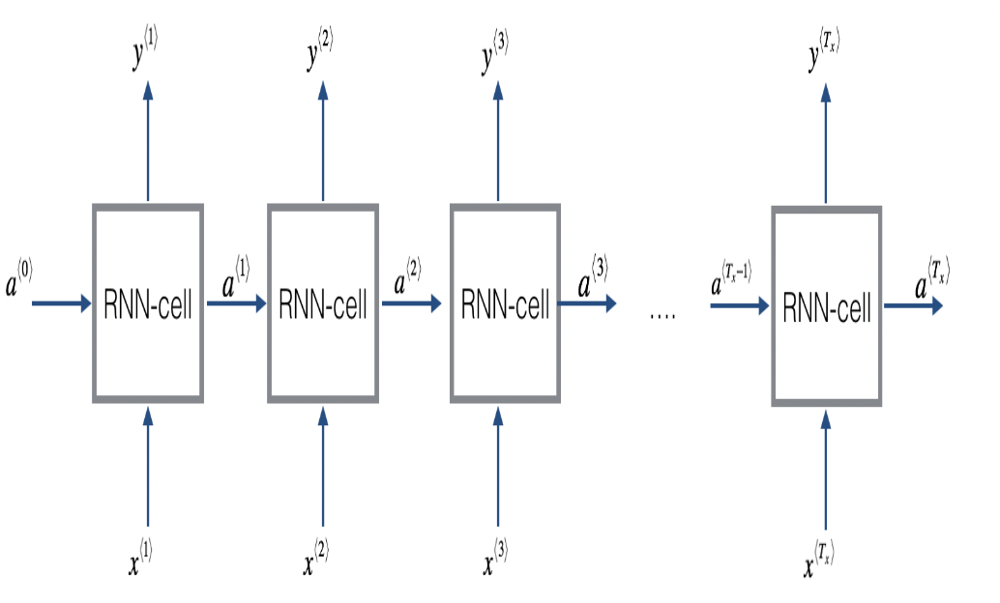

**RNN cell**

A Recurrent neural network can be seen as the repetition of a single cell. You are first going to implement the computations for a single time-step. The following figure describes the operations for a single time-step of an RNN cell.

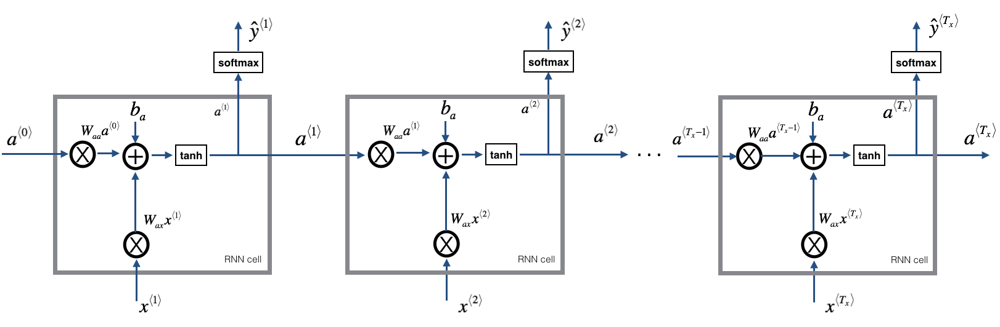

**Figure 2**: Basic RNN cell. Takes as input $x^{\langle t \rangle}$ (current input) and $a^{\langle t - 1\rangle}$ (previous hidden state containing information from the past), and outputs $a^{\langle t \rangle}$ which is given to the next RNN cell and also used to predict $y^{\langle t \rangle}$ </center></caption>

**Problem 4 (b) Implementing the RNN-cell**<br>
Implement the RNN-cell described in Figure (2).
1. Compute the hidden state with tanh activation: $a^{\langle t \rangle} = \tanh(W_{aa} a^{\langle t-1 \rangle} + W_{ax} x^{\langle t \rangle} + b_a)$.
2. Using your new hidden state $a^{\langle t \rangle}$, compute the prediction $\hat{y}^{\langle t \rangle} = softmax(W_{ya} a^{\langle t \rangle} + b_y)$. We provided you a function: `softmax`.
3. Store $(a^{\langle t \rangle}, a^{\langle t-1 \rangle}, x^{\langle t \rangle}, parameters)$ in cache
4. Return $a^{\langle t \rangle}$ , $y^{\langle t \rangle}$ and cache

We will vectorize over $m$ examples. Thus, $x^{\langle t \rangle}$ will have dimension $(n_x,m)$, and $a^{\langle t \rangle}$ will have dimension $(n_a,m)$.

### <br><font color='red'>  **Problem 4 (b) Solution**</font>

In [40]:
# GRADED FUNCTION: rnn_cell_forward

def rnn_cell_forward(xt, a_prev, parameters):
    """
    Implements a single forward step of the RNN-cell as described in Figure (2)

    Arguments:
    xt -- your input data at timestep "t", numpy array of shape (n_x, m).
    a_prev -- Hidden state at timestep "t-1", numpy array of shape (n_a, m)
    parameters -- python dictionary containing:
                        Wax -- Weight matrix multiplying the input, numpy array of shape (n_a, n_x)
                        Waa -- Weight matrix multiplying the hidden state, numpy array of shape (n_a, n_a)
                        Wya -- Weight matrix relating the hidden-state to the output, numpy array of shape (n_y, n_a)
                        ba --  Bias, numpy array of shape (n_a, 1)
                        by -- Bias relating the hidden-state to the output, numpy array of shape (n_y, 1)
    Returns:
    a_next -- next hidden state, of shape (n_a, m)
    yt_pred -- prediction at timestep "t", numpy array of shape (n_y, m)
    cache -- tuple of values needed for the backward pass, contains (a_next, a_prev, xt, parameters)
    """

    # Retrieve parameters from "parameters"
    Wax = parameters["Wax"]
    Waa = parameters["Waa"]
    Wya = parameters["Wya"]
    ba = parameters["ba"]
    by = parameters["by"]

    #-----------------Don't change anything above------------------------#
    # compute next activation state using the formula given above
    a_next = np.tanh(np.dot(Waa, a_prev) + np.dot(Wax, xt) + ba)
    # compute output of the current cell using the formula given above
    yt_pred = softmax(np.dot(Wya, a_next) + by)
    # store values you need for backward propagation in cache
    cache = (a_next, a_prev, xt, parameters)

    #-----------------Don't change anything below------------------------#
    return a_next, yt_pred, cache

In [41]:
np.random.seed(1)
xt = np.random.randn(3,10)
a_prev = np.random.randn(5,10)
Waa = np.random.randn(5,5)
Wax = np.random.randn(5,3)
Wya = np.random.randn(2,5)
ba = np.random.randn(5,1)
by = np.random.randn(2,1)
parameters = {"Waa": Waa, "Wax": Wax, "Wya": Wya, "ba": ba, "by": by}

a_next, yt_pred, cache = rnn_cell_forward(xt, a_prev, parameters)
print("a_next[4] = ", a_next[4])
print("a_next.shape = ", a_next.shape)
print("yt_pred[1] =", yt_pred[1])
print("yt_pred.shape = ", yt_pred.shape)

a_next[4] =  [ 0.59584544  0.18141802  0.61311866  0.99808218  0.85016201  0.99980978
 -0.18887155  0.99815551  0.6531151   0.82872037]
a_next.shape =  (5, 10)
yt_pred[1] = [0.9888161  0.01682021 0.21140899 0.36817467 0.98988387 0.88945212
 0.36920224 0.9966312  0.9982559  0.17746526]
yt_pred.shape =  (2, 10)


**RNN Forward Pass**

You can see an RNN as the repetition of the cell you've just built. If your input sequence of data is carried over 10 time steps, then you will copy the RNN cell 10 times. Each cell takes as input the hidden state from the previous cell ($a^{\langle t-1 \rangle}$) and the current time-step's input data ($x^{\langle t \rangle}$). It outputs a hidden state ($a^{\langle t \rangle}$) and a prediction ($y^{\langle t \rangle}$) for this time-step.



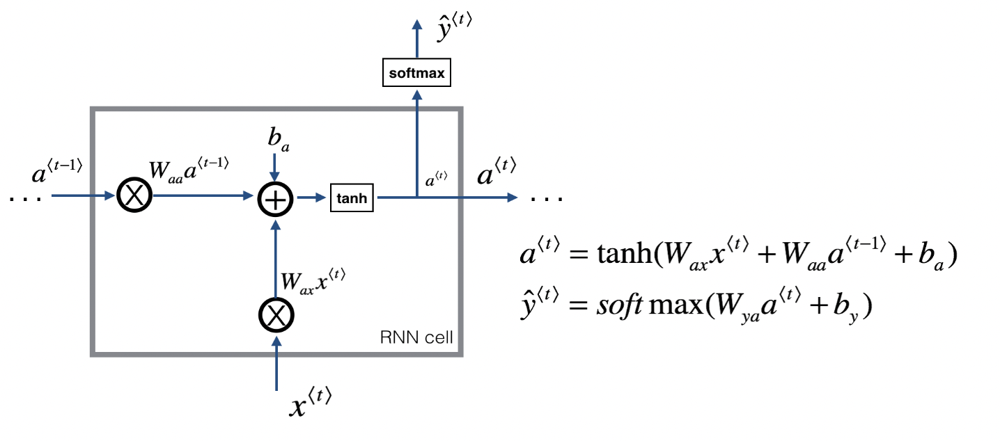

**Figure 3**: Basic RNN. The input sequence $x = (x^{\langle 1 \rangle}, x^{\langle 2 \rangle}, ..., x^{\langle T_x \rangle})$  is carried over $T_x$ time steps. The network outputs $y = (y^{\langle 1 \rangle}, y^{\langle 2 \rangle}, ..., y^{\langle T_x \rangle})$. </center></caption>



**Problem 4 (c) Code the forward propagation of the RNN described in Figure (3):**<br>

1. Create a vector of zeros ($a$) that will store all the hidden states computed by the RNN.
2. Initialize the "next" hidden state as $a_0$ (initial hidden state).
3. Start looping over each time step, your incremental index is $t$ :
    - Update the "next" hidden state and the cache by running `rnn_cell_forward`
    - Store the "next" hidden state in $a$ ($t^{th}$ position)
    - Store the prediction in y
    - Add the cache to the list of caches
4. Return $a$, $y$ and caches

### <br><font color='red'>  **Problem 4 (c) Solution**</font>

In [42]:
# GRADED FUNCTION: rnn_forward

def rnn_forward(x, a0, parameters):
    """
    Implement the forward propagation of the recurrent neural network described in Figure (3).

    Arguments:
    x -- Input data for every time-step, of shape (n_x, m, T_x).
    a0 -- Initial hidden state, of shape (n_a, m)
    parameters -- python dictionary containing:
                        Waa -- Weight matrix multiplying the hidden state, numpy array of shape (n_a, n_a)
                        Wax -- Weight matrix multiplying the input, numpy array of shape (n_a, n_x)
                        Wya -- Weight matrix relating the hidden-state to the output, numpy array of shape (n_y, n_a)
                        ba --  Bias numpy array of shape (n_a, 1)
                        by -- Bias relating the hidden-state to the output, numpy array of shape (n_y, 1)

    Returns:
    a -- Hidden states for every time-step, numpy array of shape (n_a, m, T_x)
    y_pred -- Predictions for every time-step, numpy array of shape (n_y, m, T_x)
    caches -- tuple of values needed for the backward pass, contains (list of caches, x)
    """

    # Initialize "caches" which will contain the list of all caches
    caches = []

    # Retrieve dimensions from shapes of x and parameters["Wya"]
    n_x, m, T_x = x.shape
    n_y, n_a = parameters["Wya"].shape

    #-----------------Don't change anything above------------------------#

    # initialize "a" and "y" with zeros (≈2 lines)
    a = np.zeros((n_a, m, T_x))
    y_pred = np.zeros((n_y, m, T_x))

    # Initialize a_next (≈1 line)
    a_next = a0

    # loop over all time-steps
    for t in range(T_x):
        # Update next hidden state, compute the prediction, get the cache (≈1 line)
        a_next, yt_pred, cache = rnn_cell_forward(x[:, :, t], a_next, parameters)
        # Save the value of the new "next" hidden state in a (≈1 line)
        a[:,:,t] = a_next
        # Save the value of the prediction in y (≈1 line)
        y_pred[:,:,t] = yt_pred
        # Append "cache" to "caches" (≈1 line)
        caches.append(cache)

    #-----------------Don't change anything below------------------------#

    # store values needed for backward propagation in cache
    caches = (caches, x)

    return a, y_pred, caches

In [43]:
np.random.seed(1)
x = np.random.randn(3,10,4)
a0 = np.random.randn(5,10)
Waa = np.random.randn(5,5)
Wax = np.random.randn(5,3)
Wya = np.random.randn(2,5)
ba = np.random.randn(5,1)
by = np.random.randn(2,1)
parameters = {"Waa": Waa, "Wax": Wax, "Wya": Wya, "ba": ba, "by": by}

a, y_pred, caches = rnn_forward(x, a0, parameters)
print("a[4][1] = ", a[4][1])
print("a.shape = ", a.shape)
print("y_pred[1][3] =", y_pred[1][3])
print("y_pred.shape = ", y_pred.shape)
print("caches[1][1][3] =", caches[1][1][3])
print("len(caches) = ", len(caches))

a[4][1] =  [-0.99999375  0.77911235 -0.99861469 -0.99833267]
a.shape =  (5, 10, 4)
y_pred[1][3] = [0.79560373 0.86224861 0.11118257 0.81515947]
y_pred.shape =  (2, 10, 4)
caches[1][1][3] = [-1.1425182  -0.34934272 -0.20889423  0.58662319]
len(caches) =  2


Congratulations! You've successfully built the forward propagation of a recurrent neural network from scratch. This will work well enough for some applications, but it suffers from vanishing gradient problems. So it works best when each output $y^{\langle t \rangle}$ can be estimated using mainly "local" context (meaning information from inputs $x^{\langle t' \rangle}$ where $t'$ is not too far from $t$).


**Backpropagation in recurrent neural networks**<br>
In modern deep learning frameworks, you only have to implement the forward pass, and the framework takes care of the backward pass, so most deep learning engineers do not need to bother with the details of the backward pass. If however you are an expert in calculus and want to see the details of backprop in RNNs, you can work through this optional portion of the notebook.

When in an earlier course you implemented a simple (fully connected) neural network, you used backpropagation to compute the derivatives with respect to the cost to update the parameters. Similarly, in recurrent neural networks you can to calculate the derivatives with respect to the cost in order to update the parameters. The backprop equations are quite complicated and we did not derive them in lecture. However, we will briefly present them below.

**Basic RNN  backward pass**<br>

We will start by computing the backward pass for the basic RNN-cell.

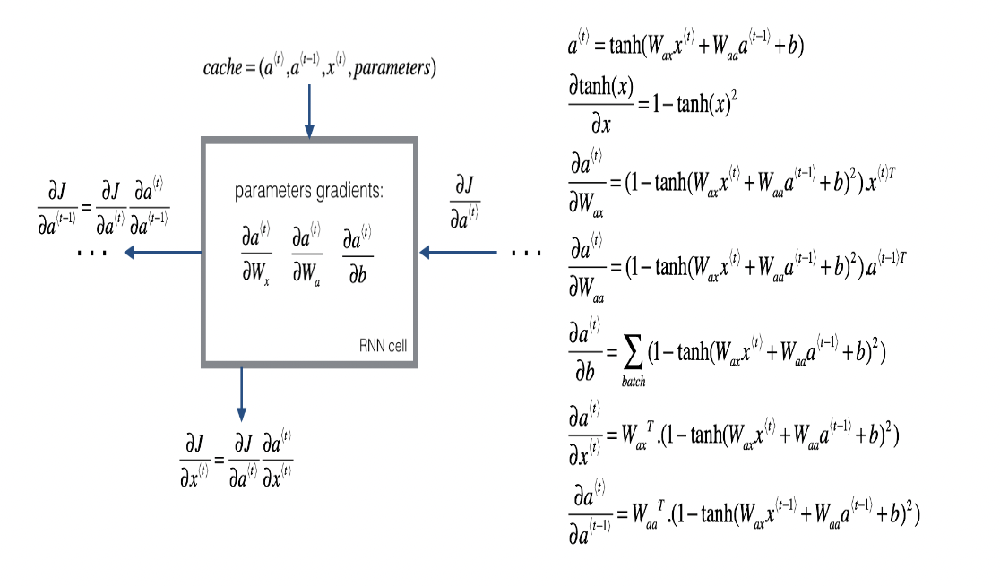

**Figure 4**: RNN-cell's backward pass. Just like in a fully-connected neural network, the derivative of the cost function $J$ backpropagates through the RNN by following the chain-rule from calculas. The chain-rule is also used to calculate $(\frac{\partial J}{\partial W_{ax}},\frac{\partial J}{\partial W_{aa}},\frac{\partial J}{\partial b})$ to update the parameters $(W_{ax}, W_{aa}, b_a)$. </center></caption>

**Deriving the one step backward functions**<br>
To compute the `rnn_cell_backward` you need to compute the following equations. It is a good exercise to derive them by hand.

The derivative of $\tanh$ is $1-\tanh(x)^2$. You can find the complete proof [here](https://www.wyzant.com/resources/lessons/math/calculus/derivative_proofs/tanx). Note that: $ \text{sech}(x)^2 = 1 - \tanh(x)^2$

Similarly for $\frac{ \partial a^{\langle t \rangle} } {\partial W_{ax}}, \frac{ \partial a^{\langle t \rangle} } {\partial W_{aa}},  \frac{ \partial a^{\langle t \rangle} } {\partial b}$, the derivative of  $\tanh(u)$ is $(1-\tanh(u)^2)du$.

The final two equations also follow same rule and are derived using the $\tanh$ derivative. Note that the arrangement is done in a way to get the same dimensions to match.

**Problem 4 (d) RNN Cell in Backward Mode**<br>
Complete the following cell for the backward mode of RNN.

### <br><font color='red'>  **Problem 4 (d) Solution**</font>

In [44]:
def rnn_cell_backward(da_next, cache):
    """
    Implements the backward pass for the RNN-cell (single time-step).

    Arguments:
    da_next -- Gradient of loss with respect to next hidden state
    cache -- python dictionary containing useful values (output of rnn_cell_forward())

    Returns:
    gradients -- python dictionary containing:
                        dx -- Gradients of input data, of shape (n_x, m)
                        da_prev -- Gradients of previous hidden state, of shape (n_a, m)
                        dWax -- Gradients of input-to-hidden weights, of shape (n_a, n_x)
                        dWaa -- Gradients of hidden-to-hidden weights, of shape (n_a, n_a)
                        dba -- Gradients of bias vector, of shape (n_a, 1)
    """

    # Retrieve values from cache
    (a_next, a_prev, xt, parameters) = cache

    # Retrieve values from parameters
    Wax = parameters["Wax"]
    Waa = parameters["Waa"]
    Wya = parameters["Wya"]
    ba = parameters["ba"]
    by = parameters["by"]

    #-----------------Don't change anything above------------------------#
    # compute the gradient of tanh with respect to a_next (≈1 line)
    dtanh = (1 - a_next**2) * da_next

    # compute the gradient of the loss with respect to Wax (≈2 lines)
    dxt = np.dot(np.transpose(Wax), dtanh)
    dWax = np.dot(dtanh, np.transpose(xt))

    # compute the gradient with respect to Waa (≈2 lines)
    da_prev = np.dot(np.transpose(Waa), dtanh)
    dWaa = np.dot(dtanh, np.transpose(a_prev))

    # compute the gradient with respect to b (≈1 line)
    dba = np.sum(dtanh, axis=1, keepdims=True)

    #-----------------Don't change anything below------------------------#

    # Store the gradients in a python dictionary
    gradients = {"dxt": dxt, "da_prev": da_prev, "dWax": dWax, "dWaa": dWaa, "dba": dba}

    return gradients

In [45]:
np.random.seed(1)
xt = np.random.randn(3,10)
a_prev = np.random.randn(5,10)
Wax = np.random.randn(5,3)
Waa = np.random.randn(5,5)
Wya = np.random.randn(2,5)
b = np.random.randn(5,1)
by = np.random.randn(2,1)
parameters = {"Wax": Wax, "Waa": Waa, "Wya": Wya, "ba": ba, "by": by}

a_next, yt, cache = rnn_cell_forward(xt, a_prev, parameters)

da_next = np.random.randn(5,10)
gradients = rnn_cell_backward(da_next, cache)
print("gradients[\"dxt\"][1][2] =", gradients["dxt"][1][2])
print("gradients[\"dxt\"].shape =", gradients["dxt"].shape)
print("gradients[\"da_prev\"][2][3] =", gradients["da_prev"][2][3])
print("gradients[\"da_prev\"].shape =", gradients["da_prev"].shape)
print("gradients[\"dWax\"][3][1] =", gradients["dWax"][3][1])
print("gradients[\"dWax\"].shape =", gradients["dWax"].shape)
print("gradients[\"dWaa\"][1][2] =", gradients["dWaa"][1][2])
print("gradients[\"dWaa\"].shape =", gradients["dWaa"].shape)
print("gradients[\"dba\"][4] =", gradients["dba"][4])
print("gradients[\"dba\"].shape =", gradients["dba"].shape)

gradients["dxt"][1][2] = -0.46056410305887957
gradients["dxt"].shape = (3, 10)
gradients["da_prev"][2][3] = 0.0842968653806773
gradients["da_prev"].shape = (5, 10)
gradients["dWax"][3][1] = 0.39308187392193045
gradients["dWax"].shape = (5, 3)
gradients["dWaa"][1][2] = -0.28483955786960674
gradients["dWaa"].shape = (5, 5)
gradients["dba"][4] = [0.80517166]
gradients["dba"].shape = (5, 1)


**Backward pass through the RNN**<br>

Computing the gradients of the cost with respect to $a^{\langle t \rangle}$ at every time-step $t$ is useful because it is what helps the gradient backpropagate to the previous RNN-cell. To do so, you need to iterate through all the time steps starting at the end, and at each step, you increment the overall $db_a$, $dW_{aa}$, $dW_{ax}$ and you store $dx$.

**Problem 4 (e) Backward pass through the RNN**<br>
Implement the `rnn_backward` function. Initialize the return variables with zeros first and then loop through all the time steps while calling the `rnn_cell_backward` at each time timestep, update the other variables accordingly.

### <br><font color='red'>  **Problem 4 (e) Solution**</font>

In [46]:
def rnn_backward(da, caches):
    """
    Implement the backward pass for a RNN over an entire sequence of input data.

    Arguments:
    da -- Upstream gradients of all hidden states, of shape (n_a, m, T_x)
    caches -- tuple containing information from the forward pass (rnn_forward)

    Returns:
    gradients -- python dictionary containing:
                        dx -- Gradient w.r.t. the input data, numpy-array of shape (n_x, m, T_x)
                        da0 -- Gradient w.r.t the initial hidden state, numpy-array of shape (n_a, m)
                        dWax -- Gradient w.r.t the input's weight matrix, numpy-array of shape (n_a, n_x)
                        dWaa -- Gradient w.r.t the hidden state's weight matrix, numpy-arrayof shape (n_a, n_a)
                        dba -- Gradient w.r.t the bias, of shape (n_a, 1)
    """



    # Retrieve values from the first cache (t=1) of caches
    (caches, x) = caches
    (a1, a0, x1, parameters) = caches[0]

    # Retrieve dimensions from da's and x1's shapes
    n_a, m, T_x = da.shape
    n_x, m = x1.shape

    # initialize the gradients with the right sizes
    #-----------------Don't change anything above------------------------#
    dx = np.zeros((n_x, m, T_x))
    dWax = np.zeros((n_a, n_x))
    dWaa = np.zeros((n_a, n_a))
    dba = np.zeros((n_a, 1))
    da0 = a0 = np.random.randn(5, 10)
    da_prevt = np.zeros((n_a, m))
    #-----------------Don't change anything below------------------------#

    # Loop through all the time steps
    for t in reversed(range(T_x)):
        # Compute gradients at time step t. Choose wisely the "da_next" and the "cache" to use in the backward propagation step.
        gradients = rnn_cell_backward(da[:,:, t] + da_prevt, caches[t])
        # Retrieve derivatives from gradients
        dxt, da_prevt, dWaxt, dWaat, dbat = gradients["dxt"], gradients["da_prev"], gradients["dWax"], gradients["dWaa"], gradients["dba"]
        # Increment global derivatives w.r.t parameters by adding their derivative at time-step t
        dx[:, :, t] = dxt
        dWax += dWaxt
        dWaa += dWaat
        dba += dbat

    # Set da0 to the gradient of a which has been backpropagated through all time-steps
    da0 = da_prevt


    # Store the gradients in a python dictionary
    gradients = {"dx": dx, "da0": da0, "dWax": dWax, "dWaa": dWaa,"dba": dba}

    return gradients

In [47]:
np.random.seed(1)
x = np.random.randn(3,10,4)
a0 = np.random.randn(5,10)
Wax = np.random.randn(5,3)
Waa = np.random.randn(5,5)
Wya = np.random.randn(2,5)
ba = np.random.randn(5,1)
by = np.random.randn(2,1)
parameters = {"Wax": Wax, "Waa": Waa, "Wya": Wya, "ba": ba, "by": by}
a, y, caches = rnn_forward(x, a0, parameters)
da = np.random.randn(5, 10, 4)
gradients = rnn_backward(da, caches)

print("gradients[\"dx\"][1][2] =", gradients["dx"][1][2])
print("gradients[\"dx\"].shape =", gradients["dx"].shape)
print("gradients[\"da0\"][2][3] =", gradients["da0"][2][3])
print("gradients[\"da0\"].shape =", gradients["da0"].shape)
print("gradients[\"dWax\"][3][1] =", gradients["dWax"][3][1])
print("gradients[\"dWax\"].shape =", gradients["dWax"].shape)
print("gradients[\"dWaa\"][1][2] =", gradients["dWaa"][1][2])
print("gradients[\"dWaa\"].shape =", gradients["dWaa"].shape)
print("gradients[\"dba\"][4] =", gradients["dba"][4])
print("gradients[\"dba\"].shape =", gradients["dba"].shape)

gradients["dx"][1][2] = [-2.07101689 -0.59255627  0.02466855  0.01483317]
gradients["dx"].shape = (3, 10, 4)
gradients["da0"][2][3] = -0.3149423751266506
gradients["da0"].shape = (5, 10)
gradients["dWax"][3][1] = 11.264104496527771
gradients["dWax"].shape = (5, 3)
gradients["dWaa"][1][2] = 2.303333126579893
gradients["dWaa"].shape = (5, 5)
gradients["dba"][4] = [-0.74747722]
gradients["dba"].shape = (5, 1)
